In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/aimi-assignment-3/Dataset/Val.mat
/kaggle/input/aimi-assignment-3/Dataset/Train.mat
/kaggle/input/aimi-assignment-3/Dataset/Test.mat


# Assingment 3

In [2]:
!pip install torchmetrics

In [3]:
import os
import cv2

# data manipulation
import numpy as np
import pandas as pd
import scipy.io

# torch 
import torch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision.models as models
from torchmetrics.classification import MulticlassSpecificity, MulticlassRecall, MulticlassConfusionMatrix, MulticlassAccuracy
from torchvision.transforms.functional import to_pil_image

## Utils

In [4]:
def get_images_labels(data, mean=None, std=None, num_classes=3):
    images = np.array(data["data"])
    labels = np.array(data["label"])

    # Reshape images to (num_samples, 1, 224, 224)
    images = images.reshape(-1, 1, 224, 224)

    if mean is None or std is None:
        mean = images.mean()
        std = images.std()

    images = (images - mean) / std
    images = images.astype(np.float32)

    labels = labels.astype(int)

    # One-hot encode the labels
    labels = np.eye(num_classes)[labels]
    labels = labels.astype(np.float32)

    labels = np.squeeze(labels, axis=0)


    return images, labels

In [ ]:
class BasicCNNClassifierWithCAM(nn.Module):
    def __init__(self, num_classes=3, dropout_rate=0.5):
        super(BasicCNNClassifierWithCAM, self).__init__()

        # Encoder
        self.encoder_conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, stride=1, padding=1)
        self.encoder_pool1 = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.bn1 = nn.BatchNorm2d(32)
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout2d(p=dropout_rate)

        self.encoder_conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.encoder_pool2 = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.bn2 = nn.BatchNorm2d(64)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout2d(p=dropout_rate)

        self.encoder_conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)
        self.encoder_pool3 = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.bn3 = nn.BatchNorm2d(128)
        self.relu3 = nn.ReLU()
        self.dropout3 = nn.Dropout2d(p=dropout_rate)

        self.encoder_conv4 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.relu4 = nn.ReLU()
        self.dropout4 = nn.Dropout2d(p=dropout_rate)

        # Global Average Pooling (GAP) layer
        self.gap = nn.AdaptiveAvgPool2d(1)

        # Output layer with weights for each class
        self.fc = nn.Linear(256, num_classes)
        #self.softmax = nn.Softmax()

    def forward(self, x):
        # Encoder
        x = self.encoder_conv1(x)
        x = self.encoder_pool1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.dropout1(x)

        x = self.encoder_conv2(x)
        x = self.encoder_pool2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        x = self.dropout2(x)

        x = self.encoder_conv3(x)
        x = self.encoder_pool3(x)
        x = self.bn3(x)
        x = self.relu3(x)
        x = self.dropout3(x)

        x = self.encoder_conv4(x)
        x = self.bn4(x)
        x = self.relu4(x)
        x = self.dropout4(x)

        x = self.gap(x)
        x = x.view(x.size(0), -1)

        x = self.fc(x)
        #x = self.softmax(x)

        return x

In [ ]:
def visualize_cam_on_image(image_tensor, cam, alpha=0.5):
    if isinstance(cam, torch.Tensor) and cam.requires_grad:
        cam = cam.detach()
        cam = cam.squeeze().cpu().numpy()
    
    if image_tensor.requires_grad:
        image_tensor = image_tensor.detach()

        
    # Convert the image tensor to numpy
    image = image_tensor.squeeze().cpu().numpy()

    # Resize CAM 
    cam_resized = cv2.resize(cam, (image.shape[1], image.shape[0]))

    cam_resized -= cam_resized.min()
    cam_resized /= cam_resized.max() if cam_resized.max() != 0 else 1

    print(cam_resized.shape)

    # Convert CAM to heatmap and overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255

    overlayed_img = heatmap * alpha + np.expand_dims(image, axis=2) * (1 - alpha)

    plt.imshow(overlayed_img)
    plt.axis('off')
    plt.show()

In [ ]:
def remove_all_hooks(model):
    
    for module in model.modules():
        # Remove all hooks from the model
        if hasattr(module, '_forward_hooks'):
            module._forward_hooks.clear()
        if hasattr(module, '_backward_hooks'):
            module._backward_hooks.clear()
        if hasattr(module, '_forward_pre_hooks'):
            module._forward_pre_hooks.clear()

In [ ]:
def get_sample_images_by_class(data_loader, num_samples=2):
    class_samples = {0: {"Images" : [], "Labels": []}, 1: {"Images" : [], "Labels": []}, 2: {"Images" : [], "Labels": []}}

    with torch.no_grad():
        for images, labels in data_loader:
            for image, label in zip(images, labels):

                label_x = int(torch.argmax(label, dim=-1).item())
                if len(class_samples[label_x]["Images"]) < num_samples:
                    class_samples[label_x]["Images"].append(image) # Image
                    class_samples[label_x]["Labels"].append(label) # One-hot encoded label
                if len(class_samples[0]["Images"]) >= num_samples and len(class_samples[1]["Images"]) >= num_samples and len(class_samples[2]["Images"]) >= num_samples: # Break if all classes have num_samples
                    break
    return class_samples

In [9]:
class EarlyStopping:
    def __init__(self, patience=5, verbose=False, delta=0.005, path='checkpoint.pt', trace_func=print):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.early_stop = False
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
        self.best_score = None
        self.last_score = np.inf

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score <= self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0
        self.last_score = val_loss

    def save_checkpoint(self, val_loss, model):
        if self.verbose:
            if self.last_score == np.inf:
                self.trace_func(f'fist save with Validation loss --> {val_loss:.6f}).  Saving model ...')
            else:
                self.trace_func(f'Validation loss decreased ({self.last_score:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.best_loss = val_loss


In [ ]:
from torchmetrics.classification import MulticlassSpecificity, MulticlassRecall, MulticlassConfusionMatrix, MulticlassAccuracy

def test_model(model, data_loader, loss_function, plot_image=False, device='cpu'):
    model.eval()
    cumulative_loss = 0

    # Initialize torchmetrics for a 3-class problem
    specificity_metric = MulticlassSpecificity(num_classes=3, average=None).to(device)  # `average=None` for per-class specificity
    recall_metric = MulticlassRecall(num_classes=3, average=None).to(device)            # `average=None` for per-class recall (sensitivity)
    confusion_matrix_metric = MulticlassConfusionMatrix(num_classes=3).to(device)
    accuracy_metric = MulticlassAccuracy(num_classes=3).to(device)

    total_valid_samples = 0

    with torch.no_grad():
        for images, y in data_loader:
            images, y = images.to(device), y.to(device)
            outputs = model(images)
            loss = loss_function(outputs, y)

            preds = torch.argmax(outputs, dim=1)
            y = torch.argmax(y, dim=1)

            # Update metrics
            specificity_metric.update(preds, y)
            recall_metric.update(preds, y)
            confusion_matrix_metric.update(preds, y)
            accuracy_metric.update(preds, y)

            # Accumulate metrics
            cumulative_loss += loss.item()
            total_valid_samples += 1

    # Compute metrics
    per_class_specificity = specificity_metric.compute()  
    per_class_sensitivity = recall_metric.compute()
    overall_cm = confusion_matrix_metric.compute()
    avg_accuracy = accuracy_metric.compute()
    avg_loss = cumulative_loss / total_valid_samples if total_valid_samples > 0 else None

    return {
        "Overall Confusion Matrix": overall_cm.cpu().numpy().tolist(),
        "Per-Class Sensitivity (Recall)": per_class_sensitivity.cpu().numpy().tolist(),
        "Per-Class Specificity": per_class_specificity.cpu().numpy().tolist(),
        "Accuracy": avg_accuracy.item(),
        "Loss": avg_loss
    }


In [ ]:
# plot training
def plot_training(train_losses, val_losses, train_accuracies, val_accuracies):
    # Convert tensors to numpy arrays
    train_losses = [loss.cpu().numpy() if torch.is_tensor(loss) else loss for loss in train_losses]
    val_losses = [loss.cpu().numpy() if torch.is_tensor(loss) else loss for loss in val_losses]
    train_accuracies = [acc.cpu().numpy() if torch.is_tensor(acc) else acc for acc in train_accuracies]
    val_accuracies = [acc.cpu().numpy() if torch.is_tensor(acc) else acc for acc in val_accuracies]

    fig, axs = plt.subplots(2, 1, figsize=(10, 10))

    # Plot training and validation loss
    axs[0].plot(train_losses, label='Training Loss')
    axs[0].plot(val_losses, label='Validation Loss')
    axs[0].set_title('Loss')
    axs[0].legend()

    # Plot training and validation accuracy
    axs[1].plot(train_accuracies, label='Training Accuracy')
    axs[1].plot(val_accuracies, label='Validation Accuracy')
    axs[1].set_title('Accuracy')
    axs[1].legend()

    plt.show()

In [ ]:
def train_model(model, train_loader, val_loader, loss_fn, optimizer, device, num_epochs=100, patience=10, l1_lambda=0.0):
    # Initialize early stopping
    early_stopping = EarlyStopping(patience=patience, verbose=True, path='checkpoint.pt')

    model.to(device)

    train_losses, train_accuracies, val_losses, val_accuracies = [], [], [], []

    # Main training loop
    for epoch in range(num_epochs):
        running_loss, running_accuracy = 0.0, 0.0
        model.train() 

        # Training phase
        for batch_idx, (images, y) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} Training", leave=False)):
            images = images.to(device)
            y = y.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            loss = loss_fn(outputs, y)
            if l1_lambda > 0:
                l1_loss = sum(torch.norm(param, 1) for param in model.parameters())
                loss += l1_lambda * l1_loss

            preds = torch.argmax(outputs, dim=1)
            y_class = torch.argmax(y, dim=1)

            # Calculate accuracy for each batch
            accuracy_metric = MulticlassAccuracy(num_classes=3).to(device)
            accuracy_metric.update(preds, y_class)
            batch_accuracy = accuracy_metric.compute().item()
            running_accuracy += batch_accuracy

            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        train_loss = running_loss / len(train_loader)
        train_accuracy = running_accuracy / len(train_loader)

        # Validation phase
        val_metrics = test_model(model, val_loader, loss_fn, False, device)
        val_loss = val_metrics['Loss']
        val_accuracy = val_metrics['Accuracy']

        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

        print(f"Class-wise Sensitivity (Recall): {val_metrics['Per-Class Sensitivity (Recall)']}")
        print(f"Class-wise Specificity: {val_metrics['Per-Class Specificity']}")

        # Check for early stopping
        early_stopping(val_loss, model)
        if early_stopping.early_stop:
            print("Early stopping")
            break

    # Load the best model
    model.load_state_dict(torch.load('checkpoint.pt'))

    plot_training(train_losses, val_losses, train_accuracies, val_accuracies)

    # Calculate and display final metrics
    final_val_metrics = test_model(model, val_loader, loss_fn, False, device)
    print(f"Final Validation Metrics: {final_val_metrics}")
    print("\n------------------------------------------------------------------------------------------------------------------")

    final_train_metrics = test_model(model, train_loader, loss_fn, False, device)
    print(f"Final Train Metrics: {final_train_metrics}")
    print("\n------------------------------------------------------------------------------------------------------------------")

    return model


## Data preprocessing

In [ ]:
# Load the data
train_data = scipy.io.loadmat('/kaggle/input/aimi-assignment-3/Dataset/Train.mat')
val_data = scipy.io.loadmat('/kaggle/input/aimi-assignment-3/Dataset/Test.mat')
test_data = scipy.io.loadmat('/kaggle/input/aimi-assignment-3/Dataset/Val.mat')

In [ ]:
# Normalize the data
train_mean = train_data["data"].mean()
train_std = train_data["data"].std()

train_images, train_labels = get_images_labels(train_data, mean=train_mean, std=train_std)
val_images, val_labels = get_images_labels(val_data, mean=train_mean, std=train_std)
test_images, test_labels = get_images_labels(test_data, mean=train_mean, std=train_std)

test_labels.shape, train_labels.shape, val_labels.shape

((285, 3), (2558, 3), (711, 3))

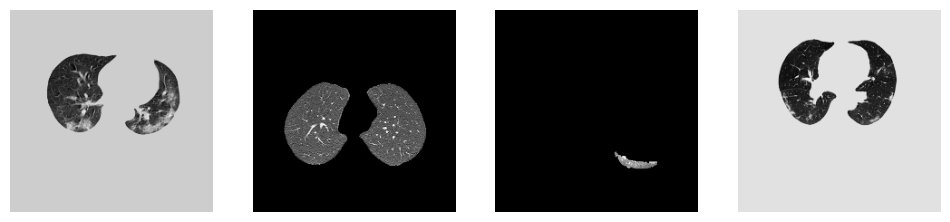

In [15]:
random_indices = np.random.choice(train_images.shape[0], 4, replace=False)

fig, axes = plt.subplots(1, 4, figsize=(12, 3))

for i, ax in enumerate(axes.flat):
    ax.imshow(train_images[random_indices[i], 0], cmap='gray')
    ax.axis('off')

plt.show()

In [16]:
# Ensure data is in float32 format
train_images = train_images.astype(np.float32)
train_labels = train_labels.astype(np.float32)
val_images = val_images.astype(np.float32)
val_labels = val_labels.astype(np.float32)
test_images = test_images.astype(np.float32)
test_labels = test_labels.astype(np.float32)

# Convert numpy arrays to PyTorch tensors
X_train = torch.FloatTensor(train_images)
y_train = torch.FloatTensor(train_labels)
X_val = torch.FloatTensor(val_images)
y_val = torch.FloatTensor(val_labels)
X_test = torch.FloatTensor(test_images)
y_test = torch.FloatTensor(test_labels)

print("\nTensor shapes after conversion:")
print(f"X_train tensor shape: {X_train.shape}")
print(f"y_train tensor shape: {y_train.shape}")


Tensor shapes after conversion:
X_train tensor shape: torch.Size([2558, 1, 224, 224])
y_train tensor shape: torch.Size([2558, 3])


In [17]:
y_val[:, :5]

tensor([[0., 1., 0.],
        [1., 0., 0.],
        [0., 1., 0.],
        ...,
        [0., 0., 1.],
        [0., 1., 0.],
        [0., 1., 0.]])

In [ ]:
batch_size = 16

# Create DataLoader objects
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataset = TensorDataset(X_val, y_val)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_dataset = TensorDataset(X_test, y_test)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

## Q1

Epoch 1/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [1/1000], Train Loss: 3.3911, Train Accuracy: 0.3308, Val Loss: 3.1624, Val Accuracy: 0.5181
Class-wise Sensitivity (Recall): [0.4027777910232544, 0.6828644275665283, 0.46875]
Class-wise Specificity: [0.8699763417243958, 0.5843750238418579, 0.815905749797821]
fist save with Validation loss --> 3.162444).  Saving model ...


Epoch 2/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [2/1000], Train Loss: 3.2032, Train Accuracy: 0.3587, Val Loss: 3.1321, Val Accuracy: 0.4919
Class-wise Sensitivity (Recall): [0.5798611044883728, 0.4271099865436554, 0.46875]
Class-wise Specificity: [0.6382978558540344, 0.7749999761581421, 0.7982326745986938]
Validation loss decreased (3.162444 --> 3.132059).  Saving model ...


Epoch 3/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [3/1000], Train Loss: 3.2199, Train Accuracy: 0.3796, Val Loss: 3.1464, Val Accuracy: 0.4731
Class-wise Sensitivity (Recall): [0.5833333134651184, 0.42966753244400024, 0.40625]
Class-wise Specificity: [0.5957446694374084, 0.7593749761581421, 0.8321060538291931]
EarlyStopping counter: 1 out of 50


Epoch 4/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [4/1000], Train Loss: 3.1574, Train Accuracy: 0.3860, Val Loss: 3.1581, Val Accuracy: 0.4044
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.01534526888281107, 0.28125]
Class-wise Specificity: [0.13475176692008972, 0.996874988079071, 0.9042710065841675]
EarlyStopping counter: 2 out of 50


Epoch 5/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [5/1000], Train Loss: 3.1526, Train Accuracy: 0.3659, Val Loss: 3.1091, Val Accuracy: 0.4511
Class-wise Sensitivity (Recall): [0.6631944179534912, 0.28388747572898865, 0.40625]
Class-wise Specificity: [0.45390069484710693, 0.809374988079071, 0.8468335866928101]
Validation loss decreased (3.158131 --> 3.109127).  Saving model ...


Epoch 6/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [6/1000], Train Loss: 3.1791, Train Accuracy: 0.3968, Val Loss: 3.1458, Val Accuracy: 0.4235
Class-wise Sensitivity (Recall): [0.8715277910232544, 0.11764705926179886, 0.28125]
Class-wise Specificity: [0.24113474786281586, 0.9437500238418579, 0.9027982354164124]
EarlyStopping counter: 1 out of 50


Epoch 7/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [7/1000], Train Loss: 3.1207, Train Accuracy: 0.3885, Val Loss: 3.1246, Val Accuracy: 0.4277
Class-wise Sensitivity (Recall): [0.90625, 0.03324808180332184, 0.34375]
Class-wise Specificity: [0.17966903746128082, 0.996874988079071, 0.8851251602172852]
EarlyStopping counter: 2 out of 50


Epoch 8/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [8/1000], Train Loss: 3.1263, Train Accuracy: 0.3884, Val Loss: 3.1434, Val Accuracy: 0.4190
Class-wise Sensitivity (Recall): [0.8506944179534912, 0.0, 0.40625]
Class-wise Specificity: [0.17966903746128082, 1.0, 0.8438880443572998]
EarlyStopping counter: 3 out of 50


Epoch 9/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [9/1000], Train Loss: 3.0906, Train Accuracy: 0.4072, Val Loss: 3.1544, Val Accuracy: 0.4144
Class-wise Sensitivity (Recall): [0.8368055820465088, 0.0, 0.40625]
Class-wise Specificity: [0.19385342299938202, 1.0, 0.8291605114936829]
EarlyStopping counter: 4 out of 50


Epoch 10/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [10/1000], Train Loss: 3.1031, Train Accuracy: 0.3808, Val Loss: 3.0987, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
Validation loss decreased (3.154363 --> 3.098671).  Saving model ...


Epoch 11/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [11/1000], Train Loss: 3.0908, Train Accuracy: 0.4083, Val Loss: 3.0930, Val Accuracy: 0.4245
Class-wise Sensitivity (Recall): [0.8020833134651184, 0.0025575447361916304, 0.46875]
Class-wise Specificity: [0.2009456306695938, 0.996874988079071, 0.815905749797821]
Validation loss decreased (3.098671 --> 3.092967).  Saving model ...


Epoch 12/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [12/1000], Train Loss: 3.1020, Train Accuracy: 0.4078, Val Loss: 3.0865, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
Validation loss decreased (3.092967 --> 3.086509).  Saving model ...


Epoch 13/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [13/1000], Train Loss: 3.1415, Train Accuracy: 0.3801, Val Loss: 3.0858, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
EarlyStopping counter: 1 out of 50


Epoch 14/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [14/1000], Train Loss: 3.1139, Train Accuracy: 0.4260, Val Loss: 3.1097, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
EarlyStopping counter: 2 out of 50


Epoch 15/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [15/1000], Train Loss: 3.0296, Train Accuracy: 0.4051, Val Loss: 3.0802, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
Validation loss decreased (3.109669 --> 3.080245).  Saving model ...


Epoch 16/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [16/1000], Train Loss: 3.1315, Train Accuracy: 0.4104, Val Loss: 3.0724, Val Accuracy: 0.4500
Class-wise Sensitivity (Recall): [0.7916666865348816, 0.08951406925916672, 0.46875]
Class-wise Specificity: [0.2884160876274109, 0.9781249761581421, 0.815905749797821]
Validation loss decreased (3.080245 --> 3.072444).  Saving model ...


Epoch 17/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [17/1000], Train Loss: 3.1127, Train Accuracy: 0.4151, Val Loss: 3.0808, Val Accuracy: 0.4276
Class-wise Sensitivity (Recall): [0.8090277910232544, 0.005115089472383261, 0.46875]
Class-wise Specificity: [0.20330969989299774, 1.0, 0.8173785209655762]
EarlyStopping counter: 1 out of 50


Epoch 18/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [18/1000], Train Loss: 3.0588, Train Accuracy: 0.4298, Val Loss: 3.0992, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
EarlyStopping counter: 2 out of 50


Epoch 19/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [19/1000], Train Loss: 3.1183, Train Accuracy: 0.4039, Val Loss: 3.0692, Val Accuracy: 0.4341
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.02813299186527729, 0.46875]
Class-wise Specificity: [0.22458629310131073, 1.0, 0.815905749797821]
EarlyStopping counter: 3 out of 50


Epoch 20/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [20/1000], Train Loss: 3.1162, Train Accuracy: 0.4136, Val Loss: 3.0885, Val Accuracy: 0.4282
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.010230178944766521, 0.46875]
Class-wise Specificity: [0.2080378234386444, 1.0, 0.815905749797821]
EarlyStopping counter: 4 out of 50


Epoch 21/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [21/1000], Train Loss: 3.0411, Train Accuracy: 0.3964, Val Loss: 3.0875, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.20567375421524048, 1.0, 0.8114874958992004]
EarlyStopping counter: 5 out of 50


Epoch 22/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [22/1000], Train Loss: 3.0488, Train Accuracy: 0.4368, Val Loss: 3.1237, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
EarlyStopping counter: 6 out of 50


Epoch 23/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [23/1000], Train Loss: 3.0290, Train Accuracy: 0.4173, Val Loss: 3.0702, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
EarlyStopping counter: 7 out of 50


Epoch 24/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [24/1000], Train Loss: 3.0268, Train Accuracy: 0.4131, Val Loss: 3.0973, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
EarlyStopping counter: 8 out of 50


Epoch 25/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [25/1000], Train Loss: 3.0578, Train Accuracy: 0.4160, Val Loss: 3.0747, Val Accuracy: 0.4236
Class-wise Sensitivity (Recall): [0.8020833134651184, 0.0, 0.46875]
Class-wise Specificity: [0.2529550790786743, 1.0, 0.7805596590042114]
EarlyStopping counter: 9 out of 50


Epoch 26/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [26/1000], Train Loss: 3.0355, Train Accuracy: 0.4165, Val Loss: 3.0580, Val Accuracy: 0.4175
Class-wise Sensitivity (Recall): [0.7708333134651184, 0.012787723913788795, 0.46875]
Class-wise Specificity: [0.2529550790786743, 0.96875, 0.7893961668014526]
Validation loss decreased (3.074695 --> 3.058049).  Saving model ...


Epoch 27/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [27/1000], Train Loss: 3.0530, Train Accuracy: 0.4143, Val Loss: 3.0370, Val Accuracy: 0.4245
Class-wise Sensitivity (Recall): [0.8020833134651184, 0.0025575447361916304, 0.46875]
Class-wise Specificity: [0.2009456306695938, 0.996874988079071, 0.815905749797821]
Validation loss decreased (3.058049 --> 3.036970).  Saving model ...


Epoch 28/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [28/1000], Train Loss: 3.0184, Train Accuracy: 0.4241, Val Loss: 3.0775, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
EarlyStopping counter: 1 out of 50


Epoch 29/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [29/1000], Train Loss: 3.0907, Train Accuracy: 0.4060, Val Loss: 3.0732, Val Accuracy: 0.4273
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.007672634441405535, 0.46875]
Class-wise Specificity: [0.20567375421524048, 1.0, 0.815905749797821]
EarlyStopping counter: 2 out of 50


Epoch 30/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [30/1000], Train Loss: 3.0090, Train Accuracy: 0.4289, Val Loss: 3.0515, Val Accuracy: 0.4318
Class-wise Sensitivity (Recall): [0.7986111044883728, 0.02813299186527729, 0.46875]
Class-wise Specificity: [0.22458629310131073, 0.9937499761581421, 0.815905749797821]
EarlyStopping counter: 3 out of 50


Epoch 31/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [31/1000], Train Loss: 3.0542, Train Accuracy: 0.4136, Val Loss: 3.0792, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
EarlyStopping counter: 4 out of 50


Epoch 32/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [32/1000], Train Loss: 3.0019, Train Accuracy: 0.4220, Val Loss: 3.0664, Val Accuracy: 0.4265
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.005115089472383261, 0.46875]
Class-wise Specificity: [0.20330969989299774, 1.0, 0.815905749797821]
EarlyStopping counter: 5 out of 50


Epoch 33/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [33/1000], Train Loss: 2.9818, Train Accuracy: 0.4237, Val Loss: 3.0298, Val Accuracy: 0.4521
Class-wise Sensitivity (Recall): [0.8020833134651184, 0.023017901927232742, 0.53125]
Class-wise Specificity: [0.2718676030635834, 0.996874988079071, 0.7864506840705872]
Validation loss decreased (3.066374 --> 3.029827).  Saving model ...


Epoch 34/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [34/1000], Train Loss: 3.0291, Train Accuracy: 0.4188, Val Loss: 3.0469, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.20567375421524048, 1.0, 0.8114874958992004]
EarlyStopping counter: 1 out of 50


Epoch 35/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [35/1000], Train Loss: 2.9855, Train Accuracy: 0.4169, Val Loss: 3.0570, Val Accuracy: 0.4632
Class-wise Sensitivity (Recall): [0.7881944179534912, 0.007672634441405535, 0.59375]
Class-wise Specificity: [0.2813238799571991, 1.0, 0.7673048377037048]
EarlyStopping counter: 2 out of 50


Epoch 36/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [36/1000], Train Loss: 3.0421, Train Accuracy: 0.4134, Val Loss: 3.0398, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.20567375421524048, 1.0, 0.8114874958992004]
EarlyStopping counter: 3 out of 50


Epoch 37/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [37/1000], Train Loss: 3.0430, Train Accuracy: 0.4212, Val Loss: 3.0278, Val Accuracy: 0.4467
Class-wise Sensitivity (Recall): [0.7986111044883728, 0.010230178944766521, 0.53125]
Class-wise Specificity: [0.2600472867488861, 1.0, 0.7835051417350769]
EarlyStopping counter: 4 out of 50


Epoch 38/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [38/1000], Train Loss: 3.0054, Train Accuracy: 0.4279, Val Loss: 3.0132, Val Accuracy: 0.4363
Class-wise Sensitivity (Recall): [0.7986111044883728, 0.010230178944766521, 0.5]
Class-wise Specificity: [0.26241135597229004, 1.0, 0.7805596590042114]
Validation loss decreased (3.027787 --> 3.013226).  Saving model ...


Epoch 39/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [39/1000], Train Loss: 2.9870, Train Accuracy: 0.4125, Val Loss: 2.9809, Val Accuracy: 0.5163
Class-wise Sensitivity (Recall): [0.7743055820465088, 0.08695652335882187, 0.6875]
Class-wise Specificity: [0.3640661835670471, 0.9781249761581421, 0.7702503800392151]
Validation loss decreased (3.013226 --> 2.980898).  Saving model ...


Epoch 40/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [40/1000], Train Loss: 3.0202, Train Accuracy: 0.4305, Val Loss: 2.9725, Val Accuracy: 0.4513
Class-wise Sensitivity (Recall): [0.8020833134651184, 0.020460357889533043, 0.53125]
Class-wise Specificity: [0.3026004731655121, 1.0, 0.7643593549728394]
Validation loss decreased (2.980898 --> 2.972529).  Saving model ...


Epoch 41/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [41/1000], Train Loss: 3.0173, Train Accuracy: 0.4265, Val Loss: 3.0085, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
EarlyStopping counter: 1 out of 50


Epoch 42/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [42/1000], Train Loss: 3.0190, Train Accuracy: 0.4389, Val Loss: 3.0339, Val Accuracy: 0.4248
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.0, 0.46875]
Class-wise Specificity: [0.19858156144618988, 1.0, 0.815905749797821]
EarlyStopping counter: 2 out of 50


Epoch 43/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [43/1000], Train Loss: 3.0869, Train Accuracy: 0.4149, Val Loss: 3.0139, Val Accuracy: 0.5041
Class-wise Sensitivity (Recall): [0.7951388955116272, 0.09207160770893097, 0.625]
Class-wise Specificity: [0.304964542388916, 0.987500011920929, 0.8114874958992004]
EarlyStopping counter: 3 out of 50


Epoch 44/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [44/1000], Train Loss: 2.9975, Train Accuracy: 0.4361, Val Loss: 3.0374, Val Accuracy: 0.4299
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.01534526888281107, 0.46875]
Class-wise Specificity: [0.21276596188545227, 1.0, 0.815905749797821]
EarlyStopping counter: 4 out of 50


Epoch 45/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [45/1000], Train Loss: 3.0228, Train Accuracy: 0.4035, Val Loss: 3.0360, Val Accuracy: 0.4316
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.020460357889533043, 0.46875]
Class-wise Specificity: [0.21749408543109894, 1.0, 0.815905749797821]
EarlyStopping counter: 5 out of 50


Epoch 46/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [46/1000], Train Loss: 2.9972, Train Accuracy: 0.4315, Val Loss: 3.0291, Val Accuracy: 0.4749
Class-wise Sensitivity (Recall): [0.7847222089767456, 0.1713555008172989, 0.46875]
Class-wise Specificity: [0.3640661835670471, 0.971875011920929, 0.815905749797821]
EarlyStopping counter: 6 out of 50


Epoch 47/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [47/1000], Train Loss: 2.9964, Train Accuracy: 0.4326, Val Loss: 2.9964, Val Accuracy: 0.4562
Class-wise Sensitivity (Recall): [0.7951388955116272, 0.10485933721065521, 0.46875]
Class-wise Specificity: [0.30023640394210815, 0.984375, 0.815905749797821]
EarlyStopping counter: 7 out of 50


Epoch 48/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [48/1000], Train Loss: 2.9837, Train Accuracy: 0.4286, Val Loss: 2.9940, Val Accuracy: 0.5539
Class-wise Sensitivity (Recall): [0.7708333134651184, 0.2659846544265747, 0.625]
Class-wise Specificity: [0.4680851101875305, 0.956250011920929, 0.8144329786300659]
EarlyStopping counter: 8 out of 50


Epoch 49/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [49/1000], Train Loss: 3.0323, Train Accuracy: 0.4219, Val Loss: 2.9674, Val Accuracy: 0.4611
Class-wise Sensitivity (Recall): [0.7916666865348816, 0.12276215106248856, 0.46875]
Class-wise Specificity: [0.3167848587036133, 0.981249988079071, 0.815905749797821]
Validation loss decreased (2.993998 --> 2.967354).  Saving model ...


Epoch 50/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [50/1000], Train Loss: 2.9907, Train Accuracy: 0.4394, Val Loss: 2.9504, Val Accuracy: 0.5561
Class-wise Sensitivity (Recall): [0.7743055820465088, 0.23785166442394257, 0.65625]
Class-wise Specificity: [0.4444444477558136, 0.965624988079071, 0.8114874958992004]
Validation loss decreased (2.967354 --> 2.950450).  Saving model ...


Epoch 51/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [51/1000], Train Loss: 2.9637, Train Accuracy: 0.4349, Val Loss: 2.9483, Val Accuracy: 0.4899
Class-wise Sensitivity (Recall): [0.7951388955116272, 0.14322251081466675, 0.53125]
Class-wise Specificity: [0.33806145191192627, 0.9906250238418579, 0.8144329786300659]
EarlyStopping counter: 1 out of 50


Epoch 52/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [52/1000], Train Loss: 2.9597, Train Accuracy: 0.4419, Val Loss: 2.9664, Val Accuracy: 0.4885
Class-wise Sensitivity (Recall): [0.7951388955116272, 0.07672633975744247, 0.59375]
Class-wise Specificity: [0.30023640394210815, 0.987500011920929, 0.8041236996650696]
EarlyStopping counter: 2 out of 50


Epoch 53/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [53/1000], Train Loss: 2.9256, Train Accuracy: 0.4409, Val Loss: 2.9231, Val Accuracy: 0.5622
Class-wise Sensitivity (Recall): [0.75, 0.1867007613182068, 0.75]
Class-wise Specificity: [0.5224586129188538, 0.949999988079071, 0.7349042892456055]
Validation loss decreased (2.966378 --> 2.923086).  Saving model ...


Epoch 54/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [54/1000], Train Loss: 2.9859, Train Accuracy: 0.4351, Val Loss: 2.9355, Val Accuracy: 0.4924
Class-wise Sensitivity (Recall): [0.7847222089767456, 0.1611253172159195, 0.53125]
Class-wise Specificity: [0.3640661835670471, 0.9750000238418579, 0.8114874958992004]
EarlyStopping counter: 1 out of 50


Epoch 55/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [55/1000], Train Loss: 2.9675, Train Accuracy: 0.4370, Val Loss: 2.9725, Val Accuracy: 0.5575
Class-wise Sensitivity (Recall): [0.7777777910232544, 0.20716112852096558, 0.6875]
Class-wise Specificity: [0.42789599299430847, 0.96875, 0.8055964708328247]
EarlyStopping counter: 2 out of 50


Epoch 56/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [56/1000], Train Loss: 2.9440, Train Accuracy: 0.4332, Val Loss: 2.9542, Val Accuracy: 0.5256
Class-wise Sensitivity (Recall): [0.7986111044883728, 0.02813299186527729, 0.75]
Class-wise Specificity: [0.3924349844455719, 0.9937499761581421, 0.7245950102806091]
EarlyStopping counter: 3 out of 50


Epoch 57/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [57/1000], Train Loss: 3.0018, Train Accuracy: 0.4512, Val Loss: 2.9648, Val Accuracy: 0.5016
Class-wise Sensitivity (Recall): [0.7881944179534912, 0.12276215106248856, 0.59375]
Class-wise Specificity: [0.32860520482063293, 0.981249988079071, 0.8129602074623108]
EarlyStopping counter: 4 out of 50


Epoch 58/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [58/1000], Train Loss: 2.9336, Train Accuracy: 0.4460, Val Loss: 2.9419, Val Accuracy: 0.5653
Class-wise Sensitivity (Recall): [0.7847222089767456, 0.1611253172159195, 0.75]
Class-wise Specificity: [0.42553192377090454, 0.981249988079071, 0.7805596590042114]
EarlyStopping counter: 5 out of 50


Epoch 59/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [59/1000], Train Loss: 2.9676, Train Accuracy: 0.4187, Val Loss: 2.9304, Val Accuracy: 0.5506
Class-wise Sensitivity (Recall): [0.7847222089767456, 0.14833760261535645, 0.71875]
Class-wise Specificity: [0.4349881708621979, 0.9781249761581421, 0.7673048377037048]
EarlyStopping counter: 6 out of 50


Epoch 60/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [60/1000], Train Loss: 2.9928, Train Accuracy: 0.4265, Val Loss: 2.9326, Val Accuracy: 0.5728
Class-wise Sensitivity (Recall): [0.78125, 0.1560102254152298, 0.78125]
Class-wise Specificity: [0.48463356494903564, 0.9750000238418579, 0.7437407970428467]
EarlyStopping counter: 7 out of 50


Epoch 61/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [61/1000], Train Loss: 2.9520, Train Accuracy: 0.4380, Val Loss: 2.9016, Val Accuracy: 0.5672
Class-wise Sensitivity (Recall): [0.7222222089767456, 0.1355498731136322, 0.84375]
Class-wise Specificity: [0.6170212626457214, 0.9750000238418579, 0.6273932456970215]
Validation loss decreased (2.932600 --> 2.901639).  Saving model ...


Epoch 62/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [62/1000], Train Loss: 2.9140, Train Accuracy: 0.4547, Val Loss: 2.9212, Val Accuracy: 0.5688
Class-wise Sensitivity (Recall): [0.7951388955116272, 0.1611253172159195, 0.75]
Class-wise Specificity: [0.3995271921157837, 0.987500011920929, 0.7982326745986938]
EarlyStopping counter: 1 out of 50


Epoch 63/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [63/1000], Train Loss: 2.9961, Train Accuracy: 0.4256, Val Loss: 2.9608, Val Accuracy: 0.4653
Class-wise Sensitivity (Recall): [0.7986111044883728, 0.09718669950962067, 0.5]
Class-wise Specificity: [0.29078012704849243, 0.9937499761581421, 0.815905749797821]
EarlyStopping counter: 2 out of 50


Epoch 64/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [64/1000], Train Loss: 2.8848, Train Accuracy: 0.4523, Val Loss: 2.9299, Val Accuracy: 0.5695
Class-wise Sensitivity (Recall): [0.7916666865348816, 0.1355498731136322, 0.78125]
Class-wise Specificity: [0.38061466813087463, 0.984375, 0.7967599630355835]
EarlyStopping counter: 3 out of 50


Epoch 65/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [65/1000], Train Loss: 2.9429, Train Accuracy: 0.4538, Val Loss: 2.9134, Val Accuracy: 0.5784
Class-wise Sensitivity (Recall): [0.7743055820465088, 0.14833760261535645, 0.8125]
Class-wise Specificity: [0.5437352061271667, 0.984375, 0.6966126561164856]
EarlyStopping counter: 4 out of 50


Epoch 66/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [66/1000], Train Loss: 2.9544, Train Accuracy: 0.4444, Val Loss: 2.9345, Val Accuracy: 0.5425
Class-wise Sensitivity (Recall): [0.7534722089767456, 0.06138107553124428, 0.8125]
Class-wise Specificity: [0.5153664350509644, 0.9937499761581421, 0.6509572863578796]
EarlyStopping counter: 5 out of 50


Epoch 67/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [67/1000], Train Loss: 2.8560, Train Accuracy: 0.4546, Val Loss: 2.8812, Val Accuracy: 0.5792
Class-wise Sensitivity (Recall): [0.7638888955116272, 0.1611253172159195, 0.8125]
Class-wise Specificity: [0.5531914830207825, 0.9750000238418579, 0.6980854272842407]
Validation loss decreased (2.934536 --> 2.881247).  Saving model ...


Epoch 68/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [68/1000], Train Loss: 2.9697, Train Accuracy: 0.4286, Val Loss: 2.8505, Val Accuracy: 0.5789
Class-wise Sensitivity (Recall): [0.7708333134651184, 0.15345267951488495, 0.8125]
Class-wise Specificity: [0.5271867513656616, 0.9750000238418579, 0.7128129601478577]
Validation loss decreased (2.881247 --> 2.850549).  Saving model ...


Epoch 69/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [69/1000], Train Loss: 2.9453, Train Accuracy: 0.4265, Val Loss: 2.8155, Val Accuracy: 0.6141
Class-wise Sensitivity (Recall): [0.7222222089767456, 0.2762148380279541, 0.84375]
Class-wise Specificity: [0.6501182317733765, 0.940625011920929, 0.7039764523506165]
Validation loss decreased (2.850549 --> 2.815525).  Saving model ...


Epoch 70/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [70/1000], Train Loss: 2.9061, Train Accuracy: 0.4408, Val Loss: 2.8367, Val Accuracy: 0.5948
Class-wise Sensitivity (Recall): [0.7708333134651184, 0.26342710852622986, 0.75]
Class-wise Specificity: [0.5106382966041565, 0.9624999761581421, 0.7893961668014526]
EarlyStopping counter: 1 out of 50


Epoch 71/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [71/1000], Train Loss: 2.9295, Train Accuracy: 0.4455, Val Loss: 2.7991, Val Accuracy: 0.6206
Class-wise Sensitivity (Recall): [0.7118055820465088, 0.3375959098339081, 0.8125]
Class-wise Specificity: [0.6075649857521057, 0.9125000238418579, 0.7731958627700806]
Validation loss decreased (2.836669 --> 2.799074).  Saving model ...


Epoch 72/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [72/1000], Train Loss: 2.9454, Train Accuracy: 0.4446, Val Loss: 2.8787, Val Accuracy: 0.6034
Class-wise Sensitivity (Recall): [0.7118055820465088, 0.3171355426311493, 0.78125]
Class-wise Specificity: [0.6406619548797607, 0.9375, 0.7275404930114746]
EarlyStopping counter: 1 out of 50


Epoch 73/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [73/1000], Train Loss: 3.0007, Train Accuracy: 0.4392, Val Loss: 2.8692, Val Accuracy: 0.5973
Class-wise Sensitivity (Recall): [0.7708333134651184, 0.2710997462272644, 0.75]
Class-wise Specificity: [0.513002336025238, 0.965624988079071, 0.7908689379692078]
EarlyStopping counter: 2 out of 50


Epoch 74/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [74/1000], Train Loss: 2.9789, Train Accuracy: 0.4350, Val Loss: 2.8424, Val Accuracy: 0.5899
Class-wise Sensitivity (Recall): [0.7743055820465088, 0.2455243021249771, 0.75]
Class-wise Specificity: [0.4586288332939148, 0.965624988079071, 0.8114874958992004]
EarlyStopping counter: 3 out of 50


Epoch 75/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [75/1000], Train Loss: 2.9469, Train Accuracy: 0.4519, Val Loss: 2.8574, Val Accuracy: 0.6043
Class-wise Sensitivity (Recall): [0.7708333134651184, 0.260869562625885, 0.78125]
Class-wise Specificity: [0.4964539110660553, 0.96875, 0.7952871918678284]
EarlyStopping counter: 4 out of 50


Epoch 76/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [76/1000], Train Loss: 2.9092, Train Accuracy: 0.4430, Val Loss: 2.8814, Val Accuracy: 0.5761
Class-wise Sensitivity (Recall): [0.78125, 0.19693094491958618, 0.75]
Class-wise Specificity: [0.408983439207077, 0.9781249761581421, 0.8114874958992004]
EarlyStopping counter: 5 out of 50


Epoch 77/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [77/1000], Train Loss: 2.9133, Train Accuracy: 0.4476, Val Loss: 2.8761, Val Accuracy: 0.5949
Class-wise Sensitivity (Recall): [0.7604166865348816, 0.24296675622463226, 0.78125]
Class-wise Specificity: [0.5035461187362671, 0.971875011920929, 0.7746686339378357]
EarlyStopping counter: 6 out of 50


Epoch 78/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [78/1000], Train Loss: 2.9454, Train Accuracy: 0.4460, Val Loss: 2.8636, Val Accuracy: 0.6147
Class-wise Sensitivity (Recall): [0.7604166865348816, 0.2710997462272644, 0.8125]
Class-wise Specificity: [0.5484633445739746, 0.971875011920929, 0.7643593549728394]
EarlyStopping counter: 7 out of 50


Epoch 79/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [79/1000], Train Loss: 2.9484, Train Accuracy: 0.4406, Val Loss: 2.8496, Val Accuracy: 0.6118
Class-wise Sensitivity (Recall): [0.7256944179534912, 0.2659846544265747, 0.84375]
Class-wise Specificity: [0.5933806300163269, 0.9593750238418579, 0.7260677218437195]
EarlyStopping counter: 8 out of 50


Epoch 80/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [80/1000], Train Loss: 2.9358, Train Accuracy: 0.4358, Val Loss: 2.7881, Val Accuracy: 0.6240
Class-wise Sensitivity (Recall): [0.71875, 0.30946290493011475, 0.84375]
Class-wise Specificity: [0.6075649857521057, 0.9281250238418579, 0.754050076007843]
Validation loss decreased (2.849588 --> 2.788085).  Saving model ...


Epoch 81/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [81/1000], Train Loss: 2.8537, Train Accuracy: 0.4532, Val Loss: 2.8080, Val Accuracy: 0.6142
Class-wise Sensitivity (Recall): [0.7847222089767456, 0.2455243021249771, 0.8125]
Class-wise Specificity: [0.4680851101875305, 0.9781249761581421, 0.8070692420005798]
EarlyStopping counter: 1 out of 50


Epoch 82/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [82/1000], Train Loss: 2.8782, Train Accuracy: 0.4510, Val Loss: 2.8217, Val Accuracy: 0.5659
Class-wise Sensitivity (Recall): [0.7916666865348816, 0.1560102254152298, 0.75]
Class-wise Specificity: [0.3758865296840668, 0.984375, 0.8100147247314453]
EarlyStopping counter: 2 out of 50


Epoch 83/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [83/1000], Train Loss: 2.9366, Train Accuracy: 0.4355, Val Loss: 2.8119, Val Accuracy: 0.6177
Class-wise Sensitivity (Recall): [0.7534722089767456, 0.2557544708251953, 0.84375]
Class-wise Specificity: [0.5815602540969849, 0.956250011920929, 0.7407953143119812]
EarlyStopping counter: 3 out of 50


Epoch 84/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [84/1000], Train Loss: 2.9240, Train Accuracy: 0.4518, Val Loss: 2.8162, Val Accuracy: 0.6261
Class-wise Sensitivity (Recall): [0.7638888955116272, 0.3017902672290802, 0.8125]
Class-wise Specificity: [0.5390070676803589, 0.9624999761581421, 0.7938144207000732]
EarlyStopping counter: 4 out of 50


Epoch 85/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [85/1000], Train Loss: 2.8627, Train Accuracy: 0.4475, Val Loss: 2.7239, Val Accuracy: 0.6308
Class-wise Sensitivity (Recall): [0.71875, 0.32992327213287354, 0.84375]
Class-wise Specificity: [0.6052009463310242, 0.921875, 0.7702503800392151]
Validation loss decreased (2.816235 --> 2.723888).  Saving model ...


Epoch 86/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [86/1000], Train Loss: 2.8048, Train Accuracy: 0.4501, Val Loss: 2.7628, Val Accuracy: 0.6323
Class-wise Sensitivity (Recall): [0.7673611044883728, 0.3171355426311493, 0.8125]
Class-wise Specificity: [0.5437352061271667, 0.9624999761581421, 0.8011782169342041]
EarlyStopping counter: 1 out of 50


Epoch 87/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [87/1000], Train Loss: 2.9056, Train Accuracy: 0.4261, Val Loss: 2.7640, Val Accuracy: 0.6309
Class-wise Sensitivity (Recall): [0.7604166865348816, 0.31969308853149414, 0.8125]
Class-wise Specificity: [0.5437352061271667, 0.956250011920929, 0.8026509284973145]
EarlyStopping counter: 2 out of 50


Epoch 88/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [88/1000], Train Loss: 2.8804, Train Accuracy: 0.4450, Val Loss: 2.7325, Val Accuracy: 0.6318
Class-wise Sensitivity (Recall): [0.7013888955116272, 0.3503836393356323, 0.84375]
Class-wise Specificity: [0.6359338164329529, 0.9125000238418579, 0.7599411010742188]
EarlyStopping counter: 3 out of 50


Epoch 89/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [89/1000], Train Loss: 2.9577, Train Accuracy: 0.4399, Val Loss: 2.7740, Val Accuracy: 0.6469
Class-wise Sensitivity (Recall): [0.7465277910232544, 0.3503836393356323, 0.84375]
Class-wise Specificity: [0.5933806300163269, 0.949999988079071, 0.7879233956336975]
EarlyStopping counter: 4 out of 50


Epoch 90/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [90/1000], Train Loss: 2.8534, Train Accuracy: 0.4528, Val Loss: 2.7332, Val Accuracy: 0.6663
Class-wise Sensitivity (Recall): [0.6909722089767456, 0.4015345275402069, 0.90625]
Class-wise Specificity: [0.6690307259559631, 0.903124988079071, 0.7717231512069702]
EarlyStopping counter: 5 out of 50


Epoch 91/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [91/1000], Train Loss: 2.8451, Train Accuracy: 0.4660, Val Loss: 2.6962, Val Accuracy: 0.6510
Class-wise Sensitivity (Recall): [0.6770833134651184, 0.4322250783443451, 0.84375]
Class-wise Specificity: [0.6572104096412659, 0.8843749761581421, 0.7967599630355835]
Validation loss decreased (2.733243 --> 2.696213).  Saving model ...


Epoch 92/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [92/1000], Train Loss: 2.9036, Train Accuracy: 0.4626, Val Loss: 2.7362, Val Accuracy: 0.6425
Class-wise Sensitivity (Recall): [0.7256944179534912, 0.35805627703666687, 0.84375]
Class-wise Specificity: [0.6075649857521057, 0.9281250238418579, 0.784977912902832]
EarlyStopping counter: 1 out of 50


Epoch 93/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [93/1000], Train Loss: 2.9127, Train Accuracy: 0.4532, Val Loss: 2.7573, Val Accuracy: 0.6284
Class-wise Sensitivity (Recall): [0.7152777910232544, 0.38874679803848267, 0.78125]
Class-wise Specificity: [0.5910165309906006, 0.9156249761581421, 0.8114874958992004]
EarlyStopping counter: 2 out of 50


Epoch 94/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [94/1000], Train Loss: 2.9662, Train Accuracy: 0.4491, Val Loss: 2.6988, Val Accuracy: 0.6655
Class-wise Sensitivity (Recall): [0.6840277910232544, 0.4373401403427124, 0.875]
Class-wise Specificity: [0.6832151412963867, 0.890625, 0.784977912902832]
EarlyStopping counter: 3 out of 50


Epoch 95/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [95/1000], Train Loss: 2.8334, Train Accuracy: 0.4558, Val Loss: 2.7356, Val Accuracy: 0.6286
Class-wise Sensitivity (Recall): [0.7222222089767456, 0.31969308853149414, 0.84375]
Class-wise Specificity: [0.567375898361206, 0.925000011920929, 0.7879233956336975]
EarlyStopping counter: 4 out of 50


Epoch 96/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [96/1000], Train Loss: 2.9021, Train Accuracy: 0.4403, Val Loss: 2.7134, Val Accuracy: 0.6353
Class-wise Sensitivity (Recall): [0.7118055820465088, 0.3503836393356323, 0.84375]
Class-wise Specificity: [0.5721040368080139, 0.9156249761581421, 0.8026509284973145]
EarlyStopping counter: 5 out of 50


Epoch 97/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [97/1000], Train Loss: 2.8676, Train Accuracy: 0.4456, Val Loss: 2.7233, Val Accuracy: 0.6436
Class-wise Sensitivity (Recall): [0.71875, 0.3682864308357239, 0.84375]
Class-wise Specificity: [0.5933806300163269, 0.921875, 0.799705445766449]
EarlyStopping counter: 6 out of 50


Epoch 98/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [98/1000], Train Loss: 2.8338, Train Accuracy: 0.4505, Val Loss: 2.7014, Val Accuracy: 0.6359
Class-wise Sensitivity (Recall): [0.71875, 0.3452685475349426, 0.84375]
Class-wise Specificity: [0.5791962146759033, 0.921875, 0.7952871918678284]
EarlyStopping counter: 7 out of 50


Epoch 99/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [99/1000], Train Loss: 2.8167, Train Accuracy: 0.4713, Val Loss: 2.6714, Val Accuracy: 0.6451
Class-wise Sensitivity (Recall): [0.6944444179534912, 0.3657289147377014, 0.875]
Class-wise Specificity: [0.652482271194458, 0.903124988079071, 0.7614138722419739]
Validation loss decreased (2.701376 --> 2.671434).  Saving model ...


Epoch 100/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [100/1000], Train Loss: 2.8024, Train Accuracy: 0.4626, Val Loss: 2.6744, Val Accuracy: 0.6448
Class-wise Sensitivity (Recall): [0.6909722089767456, 0.3682864308357239, 0.875]
Class-wise Specificity: [0.6453900933265686, 0.8999999761581421, 0.7673048377037048]
EarlyStopping counter: 1 out of 50


Epoch 101/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [101/1000], Train Loss: 2.8111, Train Accuracy: 0.4559, Val Loss: 2.6410, Val Accuracy: 0.6476
Class-wise Sensitivity (Recall): [0.6944444179534912, 0.3734015226364136, 0.875]
Class-wise Specificity: [0.6170212626457214, 0.903124988079071, 0.7879233956336975]
Validation loss decreased (2.674432 --> 2.641021).  Saving model ...


Epoch 102/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [102/1000], Train Loss: 2.8029, Train Accuracy: 0.4707, Val Loss: 2.6404, Val Accuracy: 0.6460
Class-wise Sensitivity (Recall): [0.6875, 0.4066496193408966, 0.84375]
Class-wise Specificity: [0.652482271194458, 0.893750011920929, 0.784977912902832]
EarlyStopping counter: 1 out of 50


Epoch 103/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [103/1000], Train Loss: 2.8689, Train Accuracy: 0.4574, Val Loss: 2.6565, Val Accuracy: 0.6550
Class-wise Sensitivity (Recall): [0.7013888955116272, 0.38874679803848267, 0.875]
Class-wise Specificity: [0.6406619548797607, 0.90625, 0.7835051417350769]
EarlyStopping counter: 2 out of 50


Epoch 104/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [104/1000], Train Loss: 2.7655, Train Accuracy: 0.4730, Val Loss: 2.6522, Val Accuracy: 0.6410
Class-wise Sensitivity (Recall): [0.7256944179534912, 0.322250634431839, 0.875]
Class-wise Specificity: [0.5862883925437927, 0.9312499761581421, 0.7776141166687012]
EarlyStopping counter: 3 out of 50


Epoch 105/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [105/1000], Train Loss: 2.8703, Train Accuracy: 0.4588, Val Loss: 2.6094, Val Accuracy: 0.6611
Class-wise Sensitivity (Recall): [0.6423611044883728, 0.43478259444236755, 0.90625]
Class-wise Specificity: [0.7281323671340942, 0.8656250238418579, 0.7511045932769775]
Validation loss decreased (2.652250 --> 2.609374).  Saving model ...


Epoch 106/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [106/1000], Train Loss: 2.7784, Train Accuracy: 0.4579, Val Loss: 2.5947, Val Accuracy: 0.6549
Class-wise Sensitivity (Recall): [0.6805555820465088, 0.40920716524124146, 0.875]
Class-wise Specificity: [0.6690307259559631, 0.8999999761581421, 0.7717231512069702]
Validation loss decreased (2.609374 --> 2.594702).  Saving model ...


Epoch 107/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [107/1000], Train Loss: 2.7879, Train Accuracy: 0.4764, Val Loss: 2.6005, Val Accuracy: 0.6502
Class-wise Sensitivity (Recall): [0.6944444179534912, 0.3810741603374481, 0.875]
Class-wise Specificity: [0.6170212626457214, 0.903124988079071, 0.7923416495323181]
EarlyStopping counter: 1 out of 50


Epoch 108/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [108/1000], Train Loss: 2.8072, Train Accuracy: 0.4650, Val Loss: 2.6261, Val Accuracy: 0.6583
Class-wise Sensitivity (Recall): [0.71875, 0.3810741603374481, 0.875]
Class-wise Specificity: [0.6335697174072266, 0.921875, 0.7835051417350769]
EarlyStopping counter: 2 out of 50


Epoch 109/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [109/1000], Train Loss: 2.8642, Train Accuracy: 0.4504, Val Loss: 2.5629, Val Accuracy: 0.6597
Class-wise Sensitivity (Recall): [0.6770833134651184, 0.4271099865436554, 0.875]
Class-wise Specificity: [0.6643025875091553, 0.8812500238418579, 0.7923416495323181]
Validation loss decreased (2.626148 --> 2.562941).  Saving model ...


Epoch 110/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [110/1000], Train Loss: 2.7656, Train Accuracy: 0.4695, Val Loss: 2.5968, Val Accuracy: 0.6524
Class-wise Sensitivity (Recall): [0.6909722089767456, 0.3913043439388275, 0.875]
Class-wise Specificity: [0.6572104096412659, 0.8999999761581421, 0.7731958627700806]
EarlyStopping counter: 1 out of 50


Epoch 111/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [111/1000], Train Loss: 2.7659, Train Accuracy: 0.4742, Val Loss: 2.5817, Val Accuracy: 0.6658
Class-wise Sensitivity (Recall): [0.6979166865348816, 0.42455244064331055, 0.875]
Class-wise Specificity: [0.652482271194458, 0.903124988079071, 0.7967599630355835]
EarlyStopping counter: 2 out of 50


Epoch 112/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [112/1000], Train Loss: 2.7799, Train Accuracy: 0.4711, Val Loss: 2.5978, Val Accuracy: 0.6692
Class-wise Sensitivity (Recall): [0.6979166865348816, 0.43478259444236755, 0.875]
Class-wise Specificity: [0.6784870028495789, 0.90625, 0.784977912902832]
EarlyStopping counter: 3 out of 50


Epoch 113/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [113/1000], Train Loss: 2.8590, Train Accuracy: 0.4692, Val Loss: 2.5857, Val Accuracy: 0.6660
Class-wise Sensitivity (Recall): [0.6805555820465088, 0.4424552321434021, 0.875]
Class-wise Specificity: [0.6784870028495789, 0.890625, 0.7893961668014526]
EarlyStopping counter: 4 out of 50


Epoch 114/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [114/1000], Train Loss: 2.8305, Train Accuracy: 0.4665, Val Loss: 2.5873, Val Accuracy: 0.6617
Class-wise Sensitivity (Recall): [0.6701388955116272, 0.43989768624305725, 0.875]
Class-wise Specificity: [0.7115839123725891, 0.8812500238418579, 0.7673048377037048]
EarlyStopping counter: 5 out of 50


Epoch 115/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [115/1000], Train Loss: 2.8281, Train Accuracy: 0.4551, Val Loss: 2.5950, Val Accuracy: 0.6562
Class-wise Sensitivity (Recall): [0.6875, 0.4373401403427124, 0.84375]
Class-wise Specificity: [0.652482271194458, 0.893750011920929, 0.8026509284973145]
EarlyStopping counter: 6 out of 50


Epoch 116/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [116/1000], Train Loss: 2.7732, Train Accuracy: 0.4625, Val Loss: 2.5631, Val Accuracy: 0.6486
Class-wise Sensitivity (Recall): [0.6979166865348816, 0.40409207344055176, 0.84375]
Class-wise Specificity: [0.6193853616714478, 0.903124988079071, 0.8041236996650696]
EarlyStopping counter: 7 out of 50


Epoch 117/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [117/1000], Train Loss: 2.8021, Train Accuracy: 0.4488, Val Loss: 2.5445, Val Accuracy: 0.6796
Class-wise Sensitivity (Recall): [0.6875, 0.44501277804374695, 0.90625]
Class-wise Specificity: [0.6926714181900024, 0.887499988079071, 0.7879233956336975]
Validation loss decreased (2.563126 --> 2.544532).  Saving model ...


Epoch 118/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [118/1000], Train Loss: 2.7514, Train Accuracy: 0.4693, Val Loss: 2.5624, Val Accuracy: 0.6640
Class-wise Sensitivity (Recall): [0.6770833134651184, 0.43989768624305725, 0.875]
Class-wise Specificity: [0.6832151412963867, 0.893750011920929, 0.7820324301719666]
EarlyStopping counter: 1 out of 50


Epoch 119/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [119/1000], Train Loss: 2.7126, Train Accuracy: 0.4651, Val Loss: 2.5149, Val Accuracy: 0.6672
Class-wise Sensitivity (Recall): [0.6944444179534912, 0.4322250783443451, 0.875]
Class-wise Specificity: [0.6501182317733765, 0.893750011920929, 0.8055964708328247]
Validation loss decreased (2.562362 --> 2.514944).  Saving model ...


Epoch 120/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [120/1000], Train Loss: 2.7119, Train Accuracy: 0.4850, Val Loss: 2.5420, Val Accuracy: 0.6771
Class-wise Sensitivity (Recall): [0.6979166865348816, 0.4271099865436554, 0.90625]
Class-wise Specificity: [0.6713948249816895, 0.90625, 0.7864506840705872]
EarlyStopping counter: 1 out of 50


Epoch 121/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [121/1000], Train Loss: 2.7020, Train Accuracy: 0.4649, Val Loss: 2.4404, Val Accuracy: 0.6610
Class-wise Sensitivity (Recall): [0.6527777910232544, 0.45524296164512634, 0.875]
Class-wise Specificity: [0.7115839123725891, 0.875, 0.7717231512069702]
Validation loss decreased (2.542009 --> 2.440354).  Saving model ...


Epoch 122/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [122/1000], Train Loss: 2.7394, Train Accuracy: 0.4726, Val Loss: 2.4864, Val Accuracy: 0.6493
Class-wise Sensitivity (Recall): [0.6840277910232544, 0.38874679803848267, 0.875]
Class-wise Specificity: [0.6643025875091553, 0.90625, 0.7614138722419739]
EarlyStopping counter: 1 out of 50


Epoch 123/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [123/1000], Train Loss: 2.8497, Train Accuracy: 0.4511, Val Loss: 2.5229, Val Accuracy: 0.6648
Class-wise Sensitivity (Recall): [0.7152777910232544, 0.40409207344055176, 0.875]
Class-wise Specificity: [0.6288415789604187, 0.9156249761581421, 0.8011782169342041]
EarlyStopping counter: 2 out of 50


Epoch 124/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [124/1000], Train Loss: 2.6759, Train Accuracy: 0.4914, Val Loss: 2.4924, Val Accuracy: 0.6623
Class-wise Sensitivity (Recall): [0.6770833134651184, 0.43478259444236755, 0.875]
Class-wise Specificity: [0.6643025875091553, 0.8843749761581421, 0.7952871918678284]
EarlyStopping counter: 3 out of 50


Epoch 125/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [125/1000], Train Loss: 2.7760, Train Accuracy: 0.4703, Val Loss: 2.4541, Val Accuracy: 0.6807
Class-wise Sensitivity (Recall): [0.6805555820465088, 0.45524296164512634, 0.90625]
Class-wise Specificity: [0.6761229038238525, 0.878125011920929, 0.8055964708328247]
EarlyStopping counter: 4 out of 50


Epoch 126/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [126/1000], Train Loss: 2.7276, Train Accuracy: 0.4818, Val Loss: 2.5187, Val Accuracy: 0.6619
Class-wise Sensitivity (Recall): [0.7118055820465088, 0.39897698163986206, 0.875]
Class-wise Specificity: [0.6264775395393372, 0.9156249761581421, 0.7982326745986938]
EarlyStopping counter: 5 out of 50


Epoch 127/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [127/1000], Train Loss: 2.8046, Train Accuracy: 0.4701, Val Loss: 2.4680, Val Accuracy: 0.6825
Class-wise Sensitivity (Recall): [0.6527777910232544, 0.4884910583496094, 0.90625]
Class-wise Specificity: [0.7494089603424072, 0.8687499761581421, 0.7717231512069702]
EarlyStopping counter: 6 out of 50


Epoch 128/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [128/1000], Train Loss: 2.7640, Train Accuracy: 0.4676, Val Loss: 2.4330, Val Accuracy: 0.6741
Class-wise Sensitivity (Recall): [0.6736111044883728, 0.4424552321434021, 0.90625]
Class-wise Specificity: [0.6761229038238525, 0.878125011920929, 0.7952871918678284]
Validation loss decreased (2.467987 --> 2.433021).  Saving model ...


Epoch 129/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [129/1000], Train Loss: 2.7590, Train Accuracy: 0.4625, Val Loss: 2.4260, Val Accuracy: 0.6790
Class-wise Sensitivity (Recall): [0.6805555820465088, 0.45012786984443665, 0.90625]
Class-wise Specificity: [0.6808510422706604, 0.8843749761581421, 0.7967599630355835]
Validation loss decreased (2.433021 --> 2.426019).  Saving model ...


Epoch 130/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [130/1000], Train Loss: 2.7179, Train Accuracy: 0.4714, Val Loss: 2.4246, Val Accuracy: 0.6795
Class-wise Sensitivity (Recall): [0.6666666865348816, 0.46547314524650574, 0.90625]
Class-wise Specificity: [0.6855791807174683, 0.875, 0.8011782169342041]
EarlyStopping counter: 1 out of 50


Epoch 131/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [131/1000], Train Loss: 2.7178, Train Accuracy: 0.4782, Val Loss: 2.4227, Val Accuracy: 0.6816
Class-wise Sensitivity (Recall): [0.6909722089767456, 0.4475703239440918, 0.90625]
Class-wise Specificity: [0.6713948249816895, 0.8812500238418579, 0.8070692420005798]
EarlyStopping counter: 2 out of 50


Epoch 132/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [132/1000], Train Loss: 2.6691, Train Accuracy: 0.4961, Val Loss: 2.4478, Val Accuracy: 0.6481
Class-wise Sensitivity (Recall): [0.6805555820465088, 0.38874679803848267, 0.875]
Class-wise Specificity: [0.6595744490623474, 0.8999999761581421, 0.7658321261405945]
EarlyStopping counter: 3 out of 50


Epoch 133/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [133/1000], Train Loss: 2.6998, Train Accuracy: 0.4734, Val Loss: 2.4039, Val Accuracy: 0.6644
Class-wise Sensitivity (Recall): [0.7013888955116272, 0.416879802942276, 0.875]
Class-wise Specificity: [0.6548463106155396, 0.8968750238418579, 0.7952871918678284]
Validation loss decreased (2.447815 --> 2.403923).  Saving model ...


Epoch 134/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [134/1000], Train Loss: 2.7022, Train Accuracy: 0.4722, Val Loss: 2.4545, Val Accuracy: 0.6567
Class-wise Sensitivity (Recall): [0.6909722089767456, 0.40409207344055176, 0.875]
Class-wise Specificity: [0.6477541327476501, 0.8999999761581421, 0.7864506840705872]
EarlyStopping counter: 1 out of 50


Epoch 135/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [135/1000], Train Loss: 2.6798, Train Accuracy: 0.4749, Val Loss: 2.4273, Val Accuracy: 0.6573
Class-wise Sensitivity (Recall): [0.6979166865348816, 0.39897698163986206, 0.875]
Class-wise Specificity: [0.652482271194458, 0.903124988079071, 0.7820324301719666]
EarlyStopping counter: 2 out of 50


Epoch 136/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [136/1000], Train Loss: 2.7283, Train Accuracy: 0.4646, Val Loss: 2.4024, Val Accuracy: 0.6571
Class-wise Sensitivity (Recall): [0.7048611044883728, 0.3913043439388275, 0.875]
Class-wise Specificity: [0.6335697174072266, 0.909375011920929, 0.7893961668014526]
EarlyStopping counter: 3 out of 50


Epoch 137/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [137/1000], Train Loss: 2.7503, Train Accuracy: 0.4739, Val Loss: 2.4491, Val Accuracy: 0.6745
Class-wise Sensitivity (Recall): [0.7361111044883728, 0.3810741603374481, 0.90625]
Class-wise Specificity: [0.6619385480880737, 0.9375, 0.7673048377037048]
EarlyStopping counter: 4 out of 50


Epoch 138/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [138/1000], Train Loss: 2.6834, Train Accuracy: 0.4870, Val Loss: 2.4248, Val Accuracy: 0.6745
Class-wise Sensitivity (Recall): [0.7361111044883728, 0.3810741603374481, 0.90625]
Class-wise Specificity: [0.6406619548797607, 0.9375, 0.7805596590042114]
EarlyStopping counter: 5 out of 50


Epoch 139/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [139/1000], Train Loss: 2.6786, Train Accuracy: 0.4823, Val Loss: 2.3572, Val Accuracy: 0.6708
Class-wise Sensitivity (Recall): [0.7152777910232544, 0.4219948947429657, 0.875]
Class-wise Specificity: [0.6359338164329529, 0.903124988079071, 0.8129602074623108]
Validation loss decreased (2.424763 --> 2.357171).  Saving model ...


Epoch 140/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [140/1000], Train Loss: 2.6445, Train Accuracy: 0.4944, Val Loss: 2.4486, Val Accuracy: 0.6719
Class-wise Sensitivity (Recall): [0.7256944179534912, 0.38363170623779297, 0.90625]
Class-wise Specificity: [0.6926714181900024, 0.934374988079071, 0.7466862797737122]
EarlyStopping counter: 1 out of 50


Epoch 141/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [141/1000], Train Loss: 2.7229, Train Accuracy: 0.4787, Val Loss: 2.4018, Val Accuracy: 0.6767
Class-wise Sensitivity (Recall): [0.6736111044883728, 0.45012786984443665, 0.90625]
Class-wise Specificity: [0.7281323671340942, 0.890625, 0.7614138722419739]
EarlyStopping counter: 2 out of 50


Epoch 142/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [142/1000], Train Loss: 2.5960, Train Accuracy: 0.4862, Val Loss: 2.3468, Val Accuracy: 0.6888
Class-wise Sensitivity (Recall): [0.65625, 0.5038363337516785, 0.90625]
Class-wise Specificity: [0.7446808218955994, 0.8656250238418579, 0.7864506840705872]
Validation loss decreased (2.401764 --> 2.346813).  Saving model ...


Epoch 143/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [143/1000], Train Loss: 2.6544, Train Accuracy: 0.4805, Val Loss: 2.3191, Val Accuracy: 0.6773
Class-wise Sensitivity (Recall): [0.6909722089767456, 0.43478259444236755, 0.90625]
Class-wise Specificity: [0.7021276354789734, 0.893750011920929, 0.7746686339378357]
Validation loss decreased (2.346813 --> 2.319091).  Saving model ...


Epoch 144/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [144/1000], Train Loss: 2.7004, Train Accuracy: 0.4741, Val Loss: 2.4096, Val Accuracy: 0.7023
Class-wise Sensitivity (Recall): [0.7708333134651184, 0.42966753244400024, 0.90625]
Class-wise Specificity: [0.6666666865348816, 0.918749988079071, 0.815905749797821]
EarlyStopping counter: 1 out of 50


Epoch 145/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [145/1000], Train Loss: 2.6744, Train Accuracy: 0.4971, Val Loss: 2.3585, Val Accuracy: 0.6827
Class-wise Sensitivity (Recall): [0.7638888955116272, 0.40920716524124146, 0.875]
Class-wise Specificity: [0.609929084777832, 0.909375011920929, 0.8394697904586792]
EarlyStopping counter: 2 out of 50


Epoch 146/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [146/1000], Train Loss: 2.5897, Train Accuracy: 0.4858, Val Loss: 2.3339, Val Accuracy: 0.6802
Class-wise Sensitivity (Recall): [0.6944444179534912, 0.43989768624305725, 0.90625]
Class-wise Specificity: [0.6879432797431946, 0.893750011920929, 0.7879233956336975]
EarlyStopping counter: 3 out of 50


Epoch 147/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [147/1000], Train Loss: 2.7109, Train Accuracy: 0.4846, Val Loss: 2.3231, Val Accuracy: 0.6912
Class-wise Sensitivity (Recall): [0.7326388955116272, 0.43478259444236755, 0.90625]
Class-wise Specificity: [0.6855791807174683, 0.9156249761581421, 0.7923416495323181]
EarlyStopping counter: 4 out of 50


Epoch 148/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [148/1000], Train Loss: 2.7101, Train Accuracy: 0.4866, Val Loss: 2.3490, Val Accuracy: 0.6969
Class-wise Sensitivity (Recall): [0.7291666865348816, 0.45524296164512634, 0.90625]
Class-wise Specificity: [0.6879432797431946, 0.903124988079071, 0.8070692420005798]
EarlyStopping counter: 5 out of 50


Epoch 149/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [149/1000], Train Loss: 2.6928, Train Accuracy: 0.4711, Val Loss: 2.3395, Val Accuracy: 0.6702
Class-wise Sensitivity (Recall): [0.7673611044883728, 0.3682864308357239, 0.875]
Class-wise Specificity: [0.5508274435997009, 0.9281250238418579, 0.8453608155250549]
EarlyStopping counter: 6 out of 50


Epoch 150/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [150/1000], Train Loss: 2.6278, Train Accuracy: 0.4877, Val Loss: 2.3169, Val Accuracy: 0.6893
Class-wise Sensitivity (Recall): [0.7013888955116272, 0.46035805344581604, 0.90625]
Class-wise Specificity: [0.6879432797431946, 0.878125011920929, 0.8100147247314453]
EarlyStopping counter: 7 out of 50


Epoch 151/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [151/1000], Train Loss: 2.6014, Train Accuracy: 0.4885, Val Loss: 2.3183, Val Accuracy: 0.6756
Class-wise Sensitivity (Recall): [0.7291666865348816, 0.3913043439388275, 0.90625]
Class-wise Specificity: [0.6666666865348816, 0.9125000238418579, 0.7790868878364563]
EarlyStopping counter: 8 out of 50


Epoch 152/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [152/1000], Train Loss: 2.6232, Train Accuracy: 0.4752, Val Loss: 2.2495, Val Accuracy: 0.6868
Class-wise Sensitivity (Recall): [0.7013888955116272, 0.4526854157447815, 0.90625]
Class-wise Specificity: [0.6784870028495789, 0.878125011920929, 0.8114874958992004]
Validation loss decreased (2.318303 --> 2.249450).  Saving model ...


Epoch 153/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [153/1000], Train Loss: 2.6239, Train Accuracy: 0.4853, Val Loss: 2.2736, Val Accuracy: 0.6806
Class-wise Sensitivity (Recall): [0.6701388955116272, 0.46547314524650574, 0.90625]
Class-wise Specificity: [0.7186761498451233, 0.8656250238418579, 0.7864506840705872]
EarlyStopping counter: 1 out of 50


Epoch 154/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [154/1000], Train Loss: 2.6667, Train Accuracy: 0.4840, Val Loss: 2.2774, Val Accuracy: 0.6963
Class-wise Sensitivity (Recall): [0.7708333134651184, 0.4117647111415863, 0.90625]
Class-wise Specificity: [0.6122931241989136, 0.921875, 0.8379970788955688]
EarlyStopping counter: 2 out of 50


Epoch 155/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [155/1000], Train Loss: 2.5636, Train Accuracy: 0.4791, Val Loss: 2.2464, Val Accuracy: 0.6962
Class-wise Sensitivity (Recall): [0.7118055820465088, 0.47058823704719543, 0.90625]
Class-wise Specificity: [0.6926714181900024, 0.890625, 0.8114874958992004]
EarlyStopping counter: 3 out of 50


Epoch 156/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [156/1000], Train Loss: 2.5799, Train Accuracy: 0.4974, Val Loss: 2.2990, Val Accuracy: 0.6990
Class-wise Sensitivity (Recall): [0.7048611044883728, 0.4859335124492645, 0.90625]
Class-wise Specificity: [0.7328605055809021, 0.871874988079071, 0.8011782169342041]
EarlyStopping counter: 4 out of 50


Epoch 157/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [157/1000], Train Loss: 2.6282, Train Accuracy: 0.4987, Val Loss: 2.2667, Val Accuracy: 0.6988
Class-wise Sensitivity (Recall): [0.7118055820465088, 0.47826087474823, 0.90625]
Class-wise Specificity: [0.7210401892662048, 0.871874988079071, 0.8070692420005798]
EarlyStopping counter: 5 out of 50


Epoch 158/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [158/1000], Train Loss: 2.6390, Train Accuracy: 0.4862, Val Loss: 2.2661, Val Accuracy: 0.6899
Class-wise Sensitivity (Recall): [0.6597222089767456, 0.5038363337516785, 0.90625]
Class-wise Specificity: [0.7541370987892151, 0.8500000238418579, 0.7893961668014526]
EarlyStopping counter: 6 out of 50


Epoch 159/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [159/1000], Train Loss: 2.5843, Train Accuracy: 0.4845, Val Loss: 2.2191, Val Accuracy: 0.7052
Class-wise Sensitivity (Recall): [0.6875, 0.52173912525177, 0.90625]
Class-wise Specificity: [0.7423167824745178, 0.8500000238418579, 0.8188512325286865]
Validation loss decreased (2.266104 --> 2.219143).  Saving model ...


Epoch 160/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [160/1000], Train Loss: 2.5460, Train Accuracy: 0.4903, Val Loss: 2.2155, Val Accuracy: 0.6888
Class-wise Sensitivity (Recall): [0.65625, 0.5038363337516785, 0.90625]
Class-wise Specificity: [0.7541370987892151, 0.856249988079071, 0.784977912902832]
EarlyStopping counter: 1 out of 50


Epoch 161/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [161/1000], Train Loss: 2.6358, Train Accuracy: 0.4936, Val Loss: 2.2679, Val Accuracy: 0.6804
Class-wise Sensitivity (Recall): [0.7569444179534912, 0.40920716524124146, 0.875]
Class-wise Specificity: [0.5744680762290955, 0.918749988079071, 0.8541973233222961]
EarlyStopping counter: 2 out of 50


Epoch 162/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [162/1000], Train Loss: 2.6519, Train Accuracy: 0.4874, Val Loss: 2.2280, Val Accuracy: 0.6749
Class-wise Sensitivity (Recall): [0.7743055820465088, 0.4066496193408966, 0.84375]
Class-wise Specificity: [0.5981087684631348, 0.909375011920929, 0.8483063578605652]
EarlyStopping counter: 3 out of 50


Epoch 163/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [163/1000], Train Loss: 2.6485, Train Accuracy: 0.4831, Val Loss: 2.2223, Val Accuracy: 0.6900
Class-wise Sensitivity (Recall): [0.71875, 0.44501277804374695, 0.90625]
Class-wise Specificity: [0.6784870028495789, 0.887499988079071, 0.8100147247314453]
EarlyStopping counter: 4 out of 50


Epoch 164/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [164/1000], Train Loss: 2.5632, Train Accuracy: 0.5088, Val Loss: 2.2061, Val Accuracy: 0.6769
Class-wise Sensitivity (Recall): [0.6979166865348816, 0.4578005075454712, 0.875]
Class-wise Specificity: [0.6335697174072266, 0.878125011920929, 0.8394697904586792]
Validation loss decreased (2.222285 --> 2.206127).  Saving model ...


Epoch 165/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [165/1000], Train Loss: 2.5925, Train Accuracy: 0.4970, Val Loss: 2.2234, Val Accuracy: 0.6876
Class-wise Sensitivity (Recall): [0.6909722089767456, 0.46547314524650574, 0.90625]
Class-wise Specificity: [0.716312050819397, 0.878125011920929, 0.7908689379692078]
EarlyStopping counter: 1 out of 50


Epoch 166/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [166/1000], Train Loss: 2.5344, Train Accuracy: 0.4920, Val Loss: 2.1610, Val Accuracy: 0.6954
Class-wise Sensitivity (Recall): [0.7118055820465088, 0.4680306911468506, 0.90625]
Class-wise Specificity: [0.6997635960578918, 0.887499988079071, 0.8070692420005798]
Validation loss decreased (2.223356 --> 2.161036).  Saving model ...


Epoch 167/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [167/1000], Train Loss: 2.6212, Train Accuracy: 0.4973, Val Loss: 2.1825, Val Accuracy: 0.6874
Class-wise Sensitivity (Recall): [0.75, 0.4373401403427124, 0.875]
Class-wise Specificity: [0.6761229038238525, 0.90625, 0.8100147247314453]
EarlyStopping counter: 1 out of 50


Epoch 168/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [168/1000], Train Loss: 2.5824, Train Accuracy: 0.5131, Val Loss: 2.2151, Val Accuracy: 0.6784
Class-wise Sensitivity (Recall): [0.7152777910232544, 0.44501277804374695, 0.875]
Class-wise Specificity: [0.6572104096412659, 0.893750011920929, 0.8173785209655762]
EarlyStopping counter: 2 out of 50


Epoch 169/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [169/1000], Train Loss: 2.4091, Train Accuracy: 0.5358, Val Loss: 2.1982, Val Accuracy: 0.6798
Class-wise Sensitivity (Recall): [0.7118055820465088, 0.4526854157447815, 0.875]
Class-wise Specificity: [0.6643025875091553, 0.8843749761581421, 0.8203240036964417]
EarlyStopping counter: 3 out of 50


Epoch 170/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [170/1000], Train Loss: 2.5513, Train Accuracy: 0.4912, Val Loss: 2.1274, Val Accuracy: 0.6985
Class-wise Sensitivity (Recall): [0.6701388955116272, 0.5191816091537476, 0.90625]
Class-wise Specificity: [0.7304964661598206, 0.8531249761581421, 0.815905749797821]
Validation loss decreased (2.198154 --> 2.127399).  Saving model ...


Epoch 171/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [171/1000], Train Loss: 2.5054, Train Accuracy: 0.5061, Val Loss: 2.2094, Val Accuracy: 0.6903
Class-wise Sensitivity (Recall): [0.7222222089767456, 0.4424552321434021, 0.90625]
Class-wise Specificity: [0.6690307259559631, 0.8968750238418579, 0.8114874958992004]
EarlyStopping counter: 1 out of 50


Epoch 172/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [172/1000], Train Loss: 2.6623, Train Accuracy: 0.4774, Val Loss: 2.2039, Val Accuracy: 0.6925
Class-wise Sensitivity (Recall): [0.7569444179534912, 0.41432225704193115, 0.90625]
Class-wise Specificity: [0.6335697174072266, 0.918749988079071, 0.8217967748641968]
EarlyStopping counter: 2 out of 50


Epoch 173/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [173/1000], Train Loss: 2.5251, Train Accuracy: 0.4942, Val Loss: 2.2172, Val Accuracy: 0.6802
Class-wise Sensitivity (Recall): [0.7430555820465088, 0.3913043439388275, 0.90625]
Class-wise Specificity: [0.6406619548797607, 0.9156249761581421, 0.799705445766449]
EarlyStopping counter: 3 out of 50


Epoch 174/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [174/1000], Train Loss: 2.5866, Train Accuracy: 0.4861, Val Loss: 2.1435, Val Accuracy: 0.6871
Class-wise Sensitivity (Recall): [0.7048611044883728, 0.45012786984443665, 0.90625]
Class-wise Specificity: [0.7021276354789734, 0.8843749761581421, 0.7938144207000732]
EarlyStopping counter: 4 out of 50


Epoch 175/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [175/1000], Train Loss: 2.4816, Train Accuracy: 0.4978, Val Loss: 2.1055, Val Accuracy: 0.7043
Class-wise Sensitivity (Recall): [0.7256944179534912, 0.48081842064857483, 0.90625]
Class-wise Specificity: [0.6973995566368103, 0.890625, 0.8203240036964417]
Validation loss decreased (2.143485 --> 2.105474).  Saving model ...


Epoch 176/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [176/1000], Train Loss: 2.5261, Train Accuracy: 0.5089, Val Loss: 2.1749, Val Accuracy: 0.6949
Class-wise Sensitivity (Recall): [0.7256944179534912, 0.4526854157447815, 0.90625]
Class-wise Specificity: [0.6666666865348816, 0.8968750238418579, 0.8203240036964417]
EarlyStopping counter: 1 out of 50


Epoch 177/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [177/1000], Train Loss: 2.4687, Train Accuracy: 0.5185, Val Loss: 2.1372, Val Accuracy: 0.6924
Class-wise Sensitivity (Recall): [0.7673611044883728, 0.43478259444236755, 0.875]
Class-wise Specificity: [0.6146572232246399, 0.909375011920929, 0.8527246117591858]
EarlyStopping counter: 2 out of 50


Epoch 178/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [178/1000], Train Loss: 2.5111, Train Accuracy: 0.5156, Val Loss: 2.1003, Val Accuracy: 0.6979
Class-wise Sensitivity (Recall): [0.7013888955116272, 0.4859335124492645, 0.90625]
Class-wise Specificity: [0.7210401892662048, 0.875, 0.8055964708328247]
Validation loss decreased (2.137189 --> 2.100292).  Saving model ...


Epoch 179/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [179/1000], Train Loss: 2.5178, Train Accuracy: 0.5080, Val Loss: 2.1206, Val Accuracy: 0.6953
Class-wise Sensitivity (Recall): [0.7013888955116272, 0.47826087474823, 0.90625]
Class-wise Specificity: [0.6997635960578918, 0.875, 0.8144329786300659]
EarlyStopping counter: 1 out of 50


Epoch 180/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [180/1000], Train Loss: 2.4224, Train Accuracy: 0.5154, Val Loss: 2.1007, Val Accuracy: 0.7233
Class-wise Sensitivity (Recall): [0.7534722089767456, 0.4475703239440918, 0.96875]
Class-wise Specificity: [0.6713948249816895, 0.903124988079071, 0.8262150287628174]
EarlyStopping counter: 2 out of 50


Epoch 181/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [181/1000], Train Loss: 2.5479, Train Accuracy: 0.4927, Val Loss: 2.1164, Val Accuracy: 0.7158
Class-wise Sensitivity (Recall): [0.6805555820465088, 0.529411792755127, 0.9375]
Class-wise Specificity: [0.7565011978149414, 0.8500000238418579, 0.8129602074623108]
EarlyStopping counter: 3 out of 50


Epoch 182/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [182/1000], Train Loss: 2.5198, Train Accuracy: 0.5019, Val Loss: 2.1081, Val Accuracy: 0.7093
Class-wise Sensitivity (Recall): [0.7152777910232544, 0.5063938498497009, 0.90625]
Class-wise Specificity: [0.7304964661598206, 0.875, 0.8173785209655762]
EarlyStopping counter: 4 out of 50


Epoch 183/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [183/1000], Train Loss: 2.4800, Train Accuracy: 0.5198, Val Loss: 2.0922, Val Accuracy: 0.6899
Class-wise Sensitivity (Recall): [0.6666666865348816, 0.46547314524650574, 0.9375]
Class-wise Specificity: [0.7446808218955994, 0.8687499761581421, 0.76877760887146]
Validation loss decreased (2.108082 --> 2.092179).  Saving model ...


Epoch 184/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [184/1000], Train Loss: 2.5037, Train Accuracy: 0.4975, Val Loss: 2.0731, Val Accuracy: 0.7004
Class-wise Sensitivity (Recall): [0.6909722089767456, 0.5038363337516785, 0.90625]
Class-wise Specificity: [0.7234042286872864, 0.8687499761581421, 0.8129602074623108]
Validation loss decreased (2.092179 --> 2.073137).  Saving model ...


Epoch 185/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [185/1000], Train Loss: 2.5357, Train Accuracy: 0.5040, Val Loss: 2.1328, Val Accuracy: 0.7034
Class-wise Sensitivity (Recall): [0.7743055820465088, 0.42966753244400024, 0.90625]
Class-wise Specificity: [0.6335697174072266, 0.918749988079071, 0.8379970788955688]
EarlyStopping counter: 1 out of 50


Epoch 186/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [186/1000], Train Loss: 2.4874, Train Accuracy: 0.5120, Val Loss: 2.1081, Val Accuracy: 0.6988
Class-wise Sensitivity (Recall): [0.7222222089767456, 0.4680306911468506, 0.90625]
Class-wise Specificity: [0.6784870028495789, 0.8812500238418579, 0.8276877999305725]
EarlyStopping counter: 2 out of 50


Epoch 187/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [187/1000], Train Loss: 2.4177, Train Accuracy: 0.5301, Val Loss: 2.0757, Val Accuracy: 0.7230
Class-wise Sensitivity (Recall): [0.7430555820465088, 0.4884910583496094, 0.9375]
Class-wise Specificity: [0.6973995566368103, 0.8812500238418579, 0.8379970788955688]
EarlyStopping counter: 3 out of 50


Epoch 188/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [188/1000], Train Loss: 2.4801, Train Accuracy: 0.4891, Val Loss: 2.0439, Val Accuracy: 0.7147
Class-wise Sensitivity (Recall): [0.7569444179534912, 0.48081842064857483, 0.90625]
Class-wise Specificity: [0.6808510422706604, 0.8843749761581421, 0.8468335866928101]
Validation loss decreased (2.075743 --> 2.043883).  Saving model ...


Epoch 189/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [189/1000], Train Loss: 2.4423, Train Accuracy: 0.5101, Val Loss: 2.1008, Val Accuracy: 0.6929
Class-wise Sensitivity (Recall): [0.78125, 0.3913043439388275, 0.90625]
Class-wise Specificity: [0.5957446694374084, 0.9281250238418579, 0.8379970788955688]
EarlyStopping counter: 1 out of 50


Epoch 190/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [190/1000], Train Loss: 2.4074, Train Accuracy: 0.5107, Val Loss: 2.0659, Val Accuracy: 0.7273
Class-wise Sensitivity (Recall): [0.7534722089767456, 0.4910486042499542, 0.9375]
Class-wise Specificity: [0.695035457611084, 0.8843749761581421, 0.8438880443572998]
EarlyStopping counter: 2 out of 50


Epoch 191/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [191/1000], Train Loss: 2.4697, Train Accuracy: 0.5042, Val Loss: 2.0424, Val Accuracy: 0.7239
Class-wise Sensitivity (Recall): [0.7847222089767456, 0.48081842064857483, 0.90625]
Class-wise Specificity: [0.6690307259559631, 0.875, 0.8703976273536682]
EarlyStopping counter: 3 out of 50


Epoch 192/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [192/1000], Train Loss: 2.3621, Train Accuracy: 0.5321, Val Loss: 2.0645, Val Accuracy: 0.7239
Class-wise Sensitivity (Recall): [0.8020833134651184, 0.4322250783443451, 0.9375]
Class-wise Specificity: [0.6477541327476501, 0.893750011920929, 0.8556700944900513]
EarlyStopping counter: 4 out of 50


Epoch 193/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [193/1000], Train Loss: 2.5099, Train Accuracy: 0.5054, Val Loss: 2.0152, Val Accuracy: 0.7092
Class-wise Sensitivity (Recall): [0.6944444179534912, 0.5268542170524597, 0.90625]
Class-wise Specificity: [0.758865237236023, 0.8656250238418579, 0.8070692420005798]
Validation loss decreased (2.064451 --> 2.015210).  Saving model ...


Epoch 194/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [194/1000], Train Loss: 2.4042, Train Accuracy: 0.5201, Val Loss: 2.0205, Val Accuracy: 0.7179
Class-wise Sensitivity (Recall): [0.7256944179534912, 0.52173912525177, 0.90625]
Class-wise Specificity: [0.7068557739257812, 0.871874988079071, 0.8468335866928101]
EarlyStopping counter: 1 out of 50


Epoch 195/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [195/1000], Train Loss: 2.3992, Train Accuracy: 0.5209, Val Loss: 2.0123, Val Accuracy: 0.7343
Class-wise Sensitivity (Recall): [0.7847222089767456, 0.48081842064857483, 0.9375]
Class-wise Specificity: [0.6926714181900024, 0.893750011920929, 0.8483063578605652]
EarlyStopping counter: 2 out of 50


Epoch 196/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [196/1000], Train Loss: 2.3704, Train Accuracy: 0.5241, Val Loss: 2.0022, Val Accuracy: 0.7288
Class-wise Sensitivity (Recall): [0.6805555820465088, 0.5370844006538391, 0.96875]
Class-wise Specificity: [0.7541370987892151, 0.8500000238418579, 0.8203240036964417]
Validation loss decreased (2.012336 --> 2.002165).  Saving model ...


Epoch 197/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [197/1000], Train Loss: 2.4275, Train Accuracy: 0.5136, Val Loss: 2.0162, Val Accuracy: 0.7212
Class-wise Sensitivity (Recall): [0.7534722089767456, 0.5038363337516785, 0.90625]
Class-wise Specificity: [0.7021276354789734, 0.875, 0.8497790694236755]
EarlyStopping counter: 1 out of 50


Epoch 198/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [198/1000], Train Loss: 2.3455, Train Accuracy: 0.5028, Val Loss: 1.9706, Val Accuracy: 0.7240
Class-wise Sensitivity (Recall): [0.6979166865348816, 0.5677749514579773, 0.90625]
Class-wise Specificity: [0.7683215141296387, 0.859375, 0.8291605114936829]
Validation loss decreased (2.016235 --> 1.970567).  Saving model ...


Epoch 199/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [199/1000], Train Loss: 2.4191, Train Accuracy: 0.5210, Val Loss: 2.0004, Val Accuracy: 0.7242
Class-wise Sensitivity (Recall): [0.7777777910232544, 0.4884910583496094, 0.90625]
Class-wise Specificity: [0.652482271194458, 0.8812500238418579, 0.8792341947555542]
EarlyStopping counter: 1 out of 50


Epoch 200/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [200/1000], Train Loss: 2.4061, Train Accuracy: 0.5143, Val Loss: 2.0147, Val Accuracy: 0.7181
Class-wise Sensitivity (Recall): [0.7673611044883728, 0.48081842064857483, 0.90625]
Class-wise Specificity: [0.6903073191642761, 0.8687499761581421, 0.8527246117591858]
EarlyStopping counter: 2 out of 50


Epoch 201/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [201/1000], Train Loss: 2.4612, Train Accuracy: 0.5239, Val Loss: 2.0080, Val Accuracy: 0.7275
Class-wise Sensitivity (Recall): [0.7673611044883728, 0.5089514255523682, 0.90625]
Class-wise Specificity: [0.6761229038238525, 0.875, 0.8748158812522888]
EarlyStopping counter: 3 out of 50


Epoch 202/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [202/1000], Train Loss: 2.4692, Train Accuracy: 0.5189, Val Loss: 2.0012, Val Accuracy: 0.7202
Class-wise Sensitivity (Recall): [0.7708333134651184, 0.4833759665489197, 0.90625]
Class-wise Specificity: [0.6572104096412659, 0.878125011920929, 0.8718703985214233]
EarlyStopping counter: 4 out of 50


Epoch 203/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [203/1000], Train Loss: 2.3522, Train Accuracy: 0.5435, Val Loss: 2.0027, Val Accuracy: 0.7091
Class-wise Sensitivity (Recall): [0.8333333134651184, 0.45012786984443665, 0.84375]
Class-wise Specificity: [0.6335697174072266, 0.9125000238418579, 0.8748158812522888]
EarlyStopping counter: 5 out of 50


Epoch 204/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [204/1000], Train Loss: 2.4041, Train Accuracy: 0.5274, Val Loss: 1.9580, Val Accuracy: 0.7212
Class-wise Sensitivity (Recall): [0.7465277910232544, 0.5421994924545288, 0.875]
Class-wise Specificity: [0.7257683277130127, 0.8687499761581421, 0.8556700944900513]
Validation loss decreased (2.002680 --> 1.958007).  Saving model ...


Epoch 205/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [205/1000], Train Loss: 2.3495, Train Accuracy: 0.5029, Val Loss: 2.0059, Val Accuracy: 0.7273
Class-wise Sensitivity (Recall): [0.7743055820465088, 0.5012787580490112, 0.90625]
Class-wise Specificity: [0.6903073191642761, 0.8843749761581421, 0.8600883483886719]
EarlyStopping counter: 1 out of 50


Epoch 206/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [206/1000], Train Loss: 2.3967, Train Accuracy: 0.5144, Val Loss: 1.9860, Val Accuracy: 0.7158
Class-wise Sensitivity (Recall): [0.78125, 0.4910486042499542, 0.875]
Class-wise Specificity: [0.6926714181900024, 0.893750011920929, 0.8497790694236755]
EarlyStopping counter: 2 out of 50


Epoch 207/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [207/1000], Train Loss: 2.5073, Train Accuracy: 0.5263, Val Loss: 1.9622, Val Accuracy: 0.7401
Class-wise Sensitivity (Recall): [0.7847222089767456, 0.529411792755127, 0.90625]
Class-wise Specificity: [0.7328605055809021, 0.887499988079071, 0.8527246117591858]
EarlyStopping counter: 3 out of 50


Epoch 208/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [208/1000], Train Loss: 2.3173, Train Accuracy: 0.5309, Val Loss: 1.9607, Val Accuracy: 0.7261
Class-wise Sensitivity (Recall): [0.7708333134651184, 0.5012787580490112, 0.90625]
Class-wise Specificity: [0.6832151412963867, 0.890625, 0.8600883483886719]
EarlyStopping counter: 4 out of 50


Epoch 209/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [209/1000], Train Loss: 2.3897, Train Accuracy: 0.5372, Val Loss: 1.9685, Val Accuracy: 0.7625
Class-wise Sensitivity (Recall): [0.7951388955116272, 0.5549871921539307, 0.9375]
Class-wise Specificity: [0.7304964661598206, 0.871874988079071, 0.8821796774864197]
EarlyStopping counter: 5 out of 50


Epoch 210/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [210/1000], Train Loss: 2.3998, Train Accuracy: 0.5263, Val Loss: 1.9620, Val Accuracy: 0.7364
Class-wise Sensitivity (Recall): [0.78125, 0.52173912525177, 0.90625]
Class-wise Specificity: [0.6903073191642761, 0.8843749761581421, 0.8748158812522888]
EarlyStopping counter: 6 out of 50


Epoch 211/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [211/1000], Train Loss: 2.3476, Train Accuracy: 0.5310, Val Loss: 1.9470, Val Accuracy: 0.7445
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.52173912525177, 0.90625]
Class-wise Specificity: [0.6879432797431946, 0.887499988079071, 0.8851251602172852]
Validation loss decreased (1.962006 --> 1.946961).  Saving model ...


Epoch 212/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [212/1000], Train Loss: 2.4007, Train Accuracy: 0.5088, Val Loss: 1.9515, Val Accuracy: 0.7383
Class-wise Sensitivity (Recall): [0.8125, 0.4961636960506439, 0.90625]
Class-wise Specificity: [0.6430259943008423, 0.887499988079071, 0.9013254642486572]
EarlyStopping counter: 1 out of 50


Epoch 213/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [213/1000], Train Loss: 2.3245, Train Accuracy: 0.5347, Val Loss: 1.9527, Val Accuracy: 0.7560
Class-wise Sensitivity (Recall): [0.7986111044883728, 0.5319693088531494, 0.9375]
Class-wise Specificity: [0.7352246046066284, 0.893750011920929, 0.8571428656578064]
EarlyStopping counter: 2 out of 50


Epoch 214/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [214/1000], Train Loss: 2.3361, Train Accuracy: 0.5392, Val Loss: 2.0035, Val Accuracy: 0.7008
Class-wise Sensitivity (Recall): [0.875, 0.38363170623779297, 0.84375]
Class-wise Specificity: [0.5413711667060852, 0.9375, 0.8998527526855469]
EarlyStopping counter: 3 out of 50


Epoch 215/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [215/1000], Train Loss: 2.3704, Train Accuracy: 0.5141, Val Loss: 1.9496, Val Accuracy: 0.7471
Class-wise Sensitivity (Recall): [0.8229166865348816, 0.48081842064857483, 0.9375]
Class-wise Specificity: [0.6595744490623474, 0.893750011920929, 0.8851251602172852]
EarlyStopping counter: 4 out of 50


Epoch 216/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [216/1000], Train Loss: 2.3566, Train Accuracy: 0.5467, Val Loss: 1.9666, Val Accuracy: 0.7002
Class-wise Sensitivity (Recall): [0.8298611044883728, 0.4271099865436554, 0.84375]
Class-wise Specificity: [0.588652491569519, 0.8999999761581421, 0.8939617276191711]
EarlyStopping counter: 5 out of 50


Epoch 217/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [217/1000], Train Loss: 2.2954, Train Accuracy: 0.5512, Val Loss: 1.9357, Val Accuracy: 0.7292
Class-wise Sensitivity (Recall): [0.8159722089767456, 0.46547314524650574, 0.90625]
Class-wise Specificity: [0.6879432797431946, 0.9156249761581421, 0.8438880443572998]
Validation loss decreased (1.966638 --> 1.935650).  Saving model ...


Epoch 218/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [218/1000], Train Loss: 2.2539, Train Accuracy: 0.5468, Val Loss: 1.9427, Val Accuracy: 0.7128
Class-wise Sensitivity (Recall): [0.8368055820465088, 0.4578005075454712, 0.84375]
Class-wise Specificity: [0.6264775395393372, 0.921875, 0.8807069063186646]
EarlyStopping counter: 1 out of 50


Epoch 219/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [219/1000], Train Loss: 2.3251, Train Accuracy: 0.5398, Val Loss: 1.9369, Val Accuracy: 0.7499
Class-wise Sensitivity (Recall): [0.8472222089767456, 0.4961636960506439, 0.90625]
Class-wise Specificity: [0.6761229038238525, 0.918749988079071, 0.8807069063186646]
EarlyStopping counter: 2 out of 50


Epoch 220/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [220/1000], Train Loss: 2.3366, Train Accuracy: 0.5413, Val Loss: 1.9277, Val Accuracy: 0.7435
Class-wise Sensitivity (Recall): [0.8229166865348816, 0.5012787580490112, 0.90625]
Class-wise Specificity: [0.6855791807174683, 0.90625, 0.8733431696891785]
Validation loss decreased (1.936895 --> 1.927678).  Saving model ...


Epoch 221/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [221/1000], Train Loss: 2.3743, Train Accuracy: 0.5352, Val Loss: 1.9208, Val Accuracy: 0.7217
Class-wise Sensitivity (Recall): [0.8125, 0.5089514255523682, 0.84375]
Class-wise Specificity: [0.6879432797431946, 0.8999999761581421, 0.8718703985214233]
Validation loss decreased (1.927678 --> 1.920798).  Saving model ...


Epoch 222/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [222/1000], Train Loss: 2.3151, Train Accuracy: 0.5363, Val Loss: 1.8998, Val Accuracy: 0.7463
Class-wise Sensitivity (Recall): [0.8472222089767456, 0.5166240334510803, 0.875]
Class-wise Specificity: [0.6903073191642761, 0.8968750238418579, 0.892488956451416]
Validation loss decreased (1.920798 --> 1.899793).  Saving model ...


Epoch 223/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [223/1000], Train Loss: 2.3186, Train Accuracy: 0.5462, Val Loss: 1.8991, Val Accuracy: 0.7321
Class-wise Sensitivity (Recall): [0.8333333134651184, 0.5191816091537476, 0.84375]
Class-wise Specificity: [0.6453900933265686, 0.890625, 0.9175257682800293]
EarlyStopping counter: 1 out of 50


Epoch 224/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [224/1000], Train Loss: 2.2548, Train Accuracy: 0.5532, Val Loss: 1.9539, Val Accuracy: 0.7298
Class-wise Sensitivity (Recall): [0.8229166865348816, 0.46035805344581604, 0.90625]
Class-wise Specificity: [0.6761229038238525, 0.909375011920929, 0.8541973233222961]
EarlyStopping counter: 2 out of 50


Epoch 225/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [225/1000], Train Loss: 2.3220, Train Accuracy: 0.5474, Val Loss: 1.9122, Val Accuracy: 0.7565
Class-wise Sensitivity (Recall): [0.8541666865348816, 0.5089514255523682, 0.90625]
Class-wise Specificity: [0.652482271194458, 0.909375011920929, 0.9101620316505432]
EarlyStopping counter: 3 out of 50


Epoch 226/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [226/1000], Train Loss: 2.2663, Train Accuracy: 0.5499, Val Loss: 1.9020, Val Accuracy: 0.7488
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.5345268249511719, 0.90625]
Class-wise Specificity: [0.73758864402771, 0.8999999761581421, 0.8556700944900513]
EarlyStopping counter: 4 out of 50


Epoch 227/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [227/1000], Train Loss: 2.2681, Train Accuracy: 0.5426, Val Loss: 1.9211, Val Accuracy: 0.7345
Class-wise Sensitivity (Recall): [0.8472222089767456, 0.45012786984443665, 0.90625]
Class-wise Specificity: [0.6193853616714478, 0.921875, 0.8880707025527954]
EarlyStopping counter: 5 out of 50


Epoch 228/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [228/1000], Train Loss: 2.3422, Train Accuracy: 0.5395, Val Loss: 1.8755, Val Accuracy: 0.7515
Class-wise Sensitivity (Recall): [0.8368055820465088, 0.5115089416503906, 0.90625]
Class-wise Specificity: [0.6690307259559631, 0.903124988079071, 0.8969072103500366]
Validation loss decreased (1.921126 --> 1.875455).  Saving model ...


Epoch 229/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [229/1000], Train Loss: 2.3195, Train Accuracy: 0.5559, Val Loss: 1.9261, Val Accuracy: 0.7339
Class-wise Sensitivity (Recall): [0.8402777910232544, 0.45524296164512634, 0.90625]
Class-wise Specificity: [0.6382978558540344, 0.921875, 0.876288652420044]
EarlyStopping counter: 1 out of 50


Epoch 230/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [230/1000], Train Loss: 2.2396, Train Accuracy: 0.5367, Val Loss: 1.9558, Val Accuracy: 0.7382
Class-wise Sensitivity (Recall): [0.8888888955116272, 0.41943734884262085, 0.90625]
Class-wise Specificity: [0.6028369069099426, 0.953125, 0.8836524486541748]
EarlyStopping counter: 2 out of 50


Epoch 231/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [231/1000], Train Loss: 2.3088, Train Accuracy: 0.5205, Val Loss: 1.9411, Val Accuracy: 0.7424
Class-wise Sensitivity (Recall): [0.8402777910232544, 0.48081842064857483, 0.90625]
Class-wise Specificity: [0.6477541327476501, 0.909375011920929, 0.8910161852836609]
EarlyStopping counter: 3 out of 50


Epoch 232/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [232/1000], Train Loss: 2.3218, Train Accuracy: 0.5556, Val Loss: 1.9248, Val Accuracy: 0.7304
Class-wise Sensitivity (Recall): [0.8506944179534912, 0.46547314524650574, 0.875]
Class-wise Specificity: [0.6004728078842163, 0.909375011920929, 0.9145802855491638]
EarlyStopping counter: 4 out of 50


Epoch 233/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [233/1000], Train Loss: 2.2644, Train Accuracy: 0.5363, Val Loss: 1.8732, Val Accuracy: 0.7422
Class-wise Sensitivity (Recall): [0.7986111044883728, 0.52173912525177, 0.90625]
Class-wise Specificity: [0.7021276354789734, 0.8843749761581421, 0.8748158812522888]
EarlyStopping counter: 5 out of 50


Epoch 234/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [234/1000], Train Loss: 2.2616, Train Accuracy: 0.5627, Val Loss: 1.8928, Val Accuracy: 0.7310
Class-wise Sensitivity (Recall): [0.8576388955116272, 0.46035805344581604, 0.875]
Class-wise Specificity: [0.6335697174072266, 0.925000011920929, 0.8865979313850403]
EarlyStopping counter: 6 out of 50


Epoch 235/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [235/1000], Train Loss: 2.2220, Train Accuracy: 0.5478, Val Loss: 1.8798, Val Accuracy: 0.7384
Class-wise Sensitivity (Recall): [0.8055555820465088, 0.5345268249511719, 0.875]
Class-wise Specificity: [0.7044917345046997, 0.878125011920929, 0.8851251602172852]
EarlyStopping counter: 7 out of 50


Epoch 236/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [236/1000], Train Loss: 2.2106, Train Accuracy: 0.5545, Val Loss: 1.9008, Val Accuracy: 0.7390
Class-wise Sensitivity (Recall): [0.8298611044883728, 0.48081842064857483, 0.90625]
Class-wise Specificity: [0.6619385480880737, 0.90625, 0.8792341947555542]
EarlyStopping counter: 8 out of 50


Epoch 237/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [237/1000], Train Loss: 2.2776, Train Accuracy: 0.5409, Val Loss: 1.8618, Val Accuracy: 0.7775
Class-wise Sensitivity (Recall): [0.8298611044883728, 0.5652173757553101, 0.9375]
Class-wise Specificity: [0.7257683277130127, 0.890625, 0.8969072103500366]
Validation loss decreased (1.900825 --> 1.861751).  Saving model ...


Epoch 238/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [238/1000], Train Loss: 2.2437, Train Accuracy: 0.5338, Val Loss: 1.9182, Val Accuracy: 0.7474
Class-wise Sensitivity (Recall): [0.8680555820465088, 0.4680306911468506, 0.90625]
Class-wise Specificity: [0.6217494010925293, 0.925000011920929, 0.9042710065841675]
EarlyStopping counter: 1 out of 50


Epoch 239/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [239/1000], Train Loss: 2.3385, Train Accuracy: 0.5204, Val Loss: 1.8219, Val Accuracy: 0.7636
Class-wise Sensitivity (Recall): [0.8194444179534912, 0.5652173757553101, 0.90625]
Class-wise Specificity: [0.7115839123725891, 0.8843749761581421, 0.9027982354164124]
Validation loss decreased (1.918228 --> 1.821888).  Saving model ...


Epoch 240/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [240/1000], Train Loss: 2.1982, Train Accuracy: 0.5530, Val Loss: 1.8256, Val Accuracy: 0.7455
Class-wise Sensitivity (Recall): [0.8506944179534912, 0.5421994924545288, 0.84375]
Class-wise Specificity: [0.6713948249816895, 0.893750011920929, 0.9204713106155396]
EarlyStopping counter: 1 out of 50


Epoch 241/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [241/1000], Train Loss: 2.1299, Train Accuracy: 0.5629, Val Loss: 1.7867, Val Accuracy: 0.7652
Class-wise Sensitivity (Recall): [0.8194444179534912, 0.6010230183601379, 0.875]
Class-wise Specificity: [0.7281323671340942, 0.878125011920929, 0.9145802855491638]
Validation loss decreased (1.825606 --> 1.786727).  Saving model ...


Epoch 242/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [242/1000], Train Loss: 2.0670, Train Accuracy: 0.5745, Val Loss: 1.7934, Val Accuracy: 0.7696
Class-wise Sensitivity (Recall): [0.7881944179534912, 0.5831202268600464, 0.9375]
Class-wise Specificity: [0.7659574747085571, 0.8656250238418579, 0.876288652420044]
EarlyStopping counter: 1 out of 50


Epoch 243/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [243/1000], Train Loss: 2.2003, Train Accuracy: 0.5497, Val Loss: 1.7868, Val Accuracy: 0.7575
Class-wise Sensitivity (Recall): [0.8298611044883728, 0.5677749514579773, 0.875]
Class-wise Specificity: [0.6879432797431946, 0.878125011920929, 0.9248895645141602]
EarlyStopping counter: 2 out of 50


Epoch 244/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [244/1000], Train Loss: 2.1948, Train Accuracy: 0.5626, Val Loss: 1.7890, Val Accuracy: 0.7455
Class-wise Sensitivity (Recall): [0.8576388955116272, 0.5038363337516785, 0.875]
Class-wise Specificity: [0.6572104096412659, 0.9156249761581421, 0.9013254642486572]
EarlyStopping counter: 3 out of 50


Epoch 245/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [245/1000], Train Loss: 2.1353, Train Accuracy: 0.5521, Val Loss: 1.7515, Val Accuracy: 0.7657
Class-wise Sensitivity (Recall): [0.8159722089767456, 0.6061381101608276, 0.875]
Class-wise Specificity: [0.7281323671340942, 0.878125011920929, 0.9160529971122742]
Validation loss decreased (1.789026 --> 1.751493).  Saving model ...


Epoch 246/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [246/1000], Train Loss: 2.1757, Train Accuracy: 0.5567, Val Loss: 1.8384, Val Accuracy: 0.7462
Class-wise Sensitivity (Recall): [0.8680555820465088, 0.5268542170524597, 0.84375]
Class-wise Specificity: [0.6572104096412659, 0.918749988079071, 0.9160529971122742]
EarlyStopping counter: 1 out of 50


Epoch 247/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [247/1000], Train Loss: 2.1413, Train Accuracy: 0.5595, Val Loss: 1.7670, Val Accuracy: 0.7620
Class-wise Sensitivity (Recall): [0.8125, 0.5984655022621155, 0.875]
Class-wise Specificity: [0.7257683277130127, 0.875, 0.9131075143814087]
EarlyStopping counter: 2 out of 50


Epoch 248/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [248/1000], Train Loss: 2.1664, Train Accuracy: 0.5781, Val Loss: 1.7642, Val Accuracy: 0.7737
Class-wise Sensitivity (Recall): [0.7986111044883728, 0.616368293762207, 0.90625]
Class-wise Specificity: [0.7423167824745178, 0.859375, 0.9160529971122742]
EarlyStopping counter: 3 out of 50


Epoch 249/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [249/1000], Train Loss: 2.1410, Train Accuracy: 0.5566, Val Loss: 1.7748, Val Accuracy: 0.7677
Class-wise Sensitivity (Recall): [0.8576388955116272, 0.5703324675559998, 0.875]
Class-wise Specificity: [0.7044917345046997, 0.909375011920929, 0.9131075143814087]
EarlyStopping counter: 4 out of 50


Epoch 250/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [250/1000], Train Loss: 2.1542, Train Accuracy: 0.5429, Val Loss: 1.7728, Val Accuracy: 0.7349
Class-wise Sensitivity (Recall): [0.875, 0.4859335124492645, 0.84375]
Class-wise Specificity: [0.6122931241989136, 0.918749988079071, 0.923416793346405]
EarlyStopping counter: 5 out of 50


Epoch 251/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [251/1000], Train Loss: 2.1279, Train Accuracy: 0.5657, Val Loss: 1.8008, Val Accuracy: 0.7489
Class-wise Sensitivity (Recall): [0.8888888955116272, 0.5140665173530579, 0.84375]
Class-wise Specificity: [0.6643025875091553, 0.934374988079071, 0.9057437181472778]
EarlyStopping counter: 6 out of 50


Epoch 252/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [252/1000], Train Loss: 2.2124, Train Accuracy: 0.5529, Val Loss: 1.7820, Val Accuracy: 0.7482
Class-wise Sensitivity (Recall): [0.8541666865348816, 0.5780051350593567, 0.8125]
Class-wise Specificity: [0.6855791807174683, 0.893750011920929, 0.9322533011436462]
EarlyStopping counter: 7 out of 50


Epoch 253/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [253/1000], Train Loss: 2.1407, Train Accuracy: 0.5495, Val Loss: 1.8010, Val Accuracy: 0.7552
Class-wise Sensitivity (Recall): [0.8541666865348816, 0.5677749514579773, 0.84375]
Class-wise Specificity: [0.6926714181900024, 0.893750011920929, 0.923416793346405]
EarlyStopping counter: 8 out of 50


Epoch 254/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [254/1000], Train Loss: 2.1539, Train Accuracy: 0.5780, Val Loss: 1.8401, Val Accuracy: 0.7142
Class-wise Sensitivity (Recall): [0.8958333134651184, 0.46547314524650574, 0.78125]
Class-wise Specificity: [0.5862883925437927, 0.9281250238418579, 0.9293078184127808]
EarlyStopping counter: 9 out of 50


Epoch 255/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [255/1000], Train Loss: 2.1089, Train Accuracy: 0.5780, Val Loss: 1.8026, Val Accuracy: 0.7462
Class-wise Sensitivity (Recall): [0.8680555820465088, 0.5268542170524597, 0.84375]
Class-wise Specificity: [0.6690307259559631, 0.909375011920929, 0.9131075143814087]
EarlyStopping counter: 10 out of 50


Epoch 256/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [256/1000], Train Loss: 2.1235, Train Accuracy: 0.5732, Val Loss: 1.7614, Val Accuracy: 0.7616
Class-wise Sensitivity (Recall): [0.8784722089767456, 0.5626598596572876, 0.84375]
Class-wise Specificity: [0.6832151412963867, 0.9156249761581421, 0.9263622760772705]
EarlyStopping counter: 11 out of 50


Epoch 257/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [257/1000], Train Loss: 2.1745, Train Accuracy: 0.5430, Val Loss: 1.7297, Val Accuracy: 0.7705
Class-wise Sensitivity (Recall): [0.8611111044883728, 0.5754475593566895, 0.875]
Class-wise Specificity: [0.7139480113983154, 0.9125000238418579, 0.9101620316505432]
Validation loss decreased (1.761388 --> 1.729741).  Saving model ...


Epoch 258/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [258/1000], Train Loss: 2.1301, Train Accuracy: 0.5496, Val Loss: 1.7992, Val Accuracy: 0.7431
Class-wise Sensitivity (Recall): [0.8611111044883728, 0.5242967009544373, 0.84375]
Class-wise Specificity: [0.652482271194458, 0.903124988079071, 0.9219440221786499]
EarlyStopping counter: 1 out of 50


Epoch 259/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [259/1000], Train Loss: 2.1200, Train Accuracy: 0.5971, Val Loss: 1.8000, Val Accuracy: 0.7518
Class-wise Sensitivity (Recall): [0.9027777910232544, 0.5089514255523682, 0.84375]
Class-wise Specificity: [0.6406619548797607, 0.934374988079071, 0.923416793346405]
EarlyStopping counter: 2 out of 50


Epoch 260/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [260/1000], Train Loss: 2.1001, Train Accuracy: 0.5826, Val Loss: 1.7748, Val Accuracy: 0.7669
Class-wise Sensitivity (Recall): [0.8680555820465088, 0.5575447678565979, 0.875]
Class-wise Specificity: [0.6784870028495789, 0.903124988079071, 0.9293078184127808]
EarlyStopping counter: 3 out of 50


Epoch 261/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [261/1000], Train Loss: 2.1158, Train Accuracy: 0.5737, Val Loss: 1.7627, Val Accuracy: 0.7434
Class-wise Sensitivity (Recall): [0.8958333134651184, 0.52173912525177, 0.8125]
Class-wise Specificity: [0.6382978558540344, 0.925000011920929, 0.9322533011436462]
EarlyStopping counter: 4 out of 50


Epoch 262/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [262/1000], Train Loss: 2.1916, Train Accuracy: 0.5722, Val Loss: 1.7526, Val Accuracy: 0.7555
Class-wise Sensitivity (Recall): [0.875, 0.5166240334510803, 0.875]
Class-wise Specificity: [0.6643025875091553, 0.918749988079071, 0.9101620316505432]
EarlyStopping counter: 5 out of 50


Epoch 263/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [263/1000], Train Loss: 2.1655, Train Accuracy: 0.5616, Val Loss: 1.7477, Val Accuracy: 0.7643
Class-wise Sensitivity (Recall): [0.8506944179534912, 0.5984655022621155, 0.84375]
Class-wise Specificity: [0.716312050819397, 0.887499988079071, 0.9278350472450256]
EarlyStopping counter: 6 out of 50


Epoch 264/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [264/1000], Train Loss: 2.1092, Train Accuracy: 0.5591, Val Loss: 1.7939, Val Accuracy: 0.7415
Class-wise Sensitivity (Recall): [0.8819444179534912, 0.49872124195098877, 0.84375]
Class-wise Specificity: [0.6170212626457214, 0.918749988079071, 0.9307805299758911]
EarlyStopping counter: 7 out of 50


Epoch 265/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [265/1000], Train Loss: 2.1443, Train Accuracy: 0.5730, Val Loss: 1.7413, Val Accuracy: 0.7706
Class-wise Sensitivity (Recall): [0.7916666865348816, 0.6138107180595398, 0.90625]
Class-wise Specificity: [0.7683215141296387, 0.862500011920929, 0.8939617276191711]
EarlyStopping counter: 8 out of 50


Epoch 266/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [266/1000], Train Loss: 2.0639, Train Accuracy: 0.5546, Val Loss: 1.7352, Val Accuracy: 0.7621
Class-wise Sensitivity (Recall): [0.8541666865348816, 0.5882353186607361, 0.84375]
Class-wise Specificity: [0.6973995566368103, 0.893750011920929, 0.9322533011436462]
EarlyStopping counter: 9 out of 50


Epoch 267/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [267/1000], Train Loss: 2.1227, Train Accuracy: 0.5685, Val Loss: 1.7540, Val Accuracy: 0.7569
Class-wise Sensitivity (Recall): [0.875, 0.5831202268600464, 0.8125]
Class-wise Specificity: [0.6997635960578918, 0.909375011920929, 0.9278350472450256]
EarlyStopping counter: 10 out of 50


Epoch 268/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [268/1000], Train Loss: 2.0748, Train Accuracy: 0.5814, Val Loss: 1.7367, Val Accuracy: 0.7395
Class-wise Sensitivity (Recall): [0.8611111044883728, 0.5447570085525513, 0.8125]
Class-wise Specificity: [0.6784870028495789, 0.903124988079071, 0.9160529971122742]
EarlyStopping counter: 11 out of 50


Epoch 269/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [269/1000], Train Loss: 2.0551, Train Accuracy: 0.5838, Val Loss: 1.7106, Val Accuracy: 0.7699
Class-wise Sensitivity (Recall): [0.8541666865348816, 0.5805626511573792, 0.875]
Class-wise Specificity: [0.7068557739257812, 0.893750011920929, 0.923416793346405]
Validation loss decreased (1.736732 --> 1.710638).  Saving model ...


Epoch 270/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [270/1000], Train Loss: 2.0704, Train Accuracy: 0.5808, Val Loss: 1.7593, Val Accuracy: 0.7522
Class-wise Sensitivity (Recall): [0.8784722089767456, 0.5345268249511719, 0.84375]
Class-wise Specificity: [0.6595744490623474, 0.9156249761581421, 0.9248895645141602]
EarlyStopping counter: 1 out of 50


Epoch 271/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [271/1000], Train Loss: 2.1211, Train Accuracy: 0.5959, Val Loss: 1.7463, Val Accuracy: 0.7487
Class-wise Sensitivity (Recall): [0.8888888955116272, 0.5447570085525513, 0.8125]
Class-wise Specificity: [0.6619385480880737, 0.9281250238418579, 0.9263622760772705]
EarlyStopping counter: 2 out of 50


Epoch 272/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [272/1000], Train Loss: 2.0675, Train Accuracy: 0.5758, Val Loss: 1.7246, Val Accuracy: 0.7937
Class-wise Sensitivity (Recall): [0.8611111044883728, 0.6138107180595398, 0.90625]
Class-wise Specificity: [0.7446808218955994, 0.8999999761581421, 0.9204713106155396]
EarlyStopping counter: 3 out of 50


Epoch 273/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [273/1000], Train Loss: 2.0091, Train Accuracy: 0.5865, Val Loss: 1.7091, Val Accuracy: 0.7705
Class-wise Sensitivity (Recall): [0.8506944179534912, 0.5856777429580688, 0.875]
Class-wise Specificity: [0.6973995566368103, 0.8843749761581421, 0.9351988434791565]
EarlyStopping counter: 4 out of 50


Epoch 274/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [274/1000], Train Loss: 2.1025, Train Accuracy: 0.5769, Val Loss: 1.7401, Val Accuracy: 0.7439
Class-wise Sensitivity (Recall): [0.8923611044883728, 0.5268542170524597, 0.8125]
Class-wise Specificity: [0.6359338164329529, 0.918749988079071, 0.938144326210022]
EarlyStopping counter: 5 out of 50


Epoch 275/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [275/1000], Train Loss: 1.9756, Train Accuracy: 0.5774, Val Loss: 1.7135, Val Accuracy: 0.7803
Class-wise Sensitivity (Recall): [0.875, 0.5907928347587585, 0.875]
Class-wise Specificity: [0.7352246046066284, 0.9156249761581421, 0.9101620316505432]
EarlyStopping counter: 6 out of 50


Epoch 276/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [276/1000], Train Loss: 2.0653, Train Accuracy: 0.5769, Val Loss: 1.7026, Val Accuracy: 0.7726
Class-wise Sensitivity (Recall): [0.875, 0.5677749514579773, 0.875]
Class-wise Specificity: [0.6997635960578918, 0.9125000238418579, 0.9204713106155396]
Validation loss decreased (1.713479 --> 1.702581).  Saving model ...


Epoch 277/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [277/1000], Train Loss: 2.0896, Train Accuracy: 0.5797, Val Loss: 1.7710, Val Accuracy: 0.7382
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.4680306911468506, 0.8125]
Class-wise Specificity: [0.5839243531227112, 0.956250011920929, 0.9366715550422668]
EarlyStopping counter: 1 out of 50


Epoch 278/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [278/1000], Train Loss: 2.0172, Train Accuracy: 0.5828, Val Loss: 1.7221, Val Accuracy: 0.7561
Class-wise Sensitivity (Recall): [0.8854166865348816, 0.5703324675559998, 0.8125]
Class-wise Specificity: [0.6832151412963867, 0.9125000238418579, 0.9337260723114014]
EarlyStopping counter: 2 out of 50


Epoch 279/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [279/1000], Train Loss: 2.0485, Train Accuracy: 0.5668, Val Loss: 1.7403, Val Accuracy: 0.7557
Class-wise Sensitivity (Recall): [0.8888888955116272, 0.5345268249511719, 0.84375]
Class-wise Specificity: [0.6643025875091553, 0.921875, 0.923416793346405]
EarlyStopping counter: 3 out of 50


Epoch 280/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [280/1000], Train Loss: 2.0019, Train Accuracy: 0.5903, Val Loss: 1.7026, Val Accuracy: 0.7646
Class-wise Sensitivity (Recall): [0.8854166865348816, 0.5959079265594482, 0.8125]
Class-wise Specificity: [0.7304964661598206, 0.9156249761581421, 0.9175257682800293]
EarlyStopping counter: 4 out of 50


Epoch 281/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [281/1000], Train Loss: 1.9791, Train Accuracy: 0.5795, Val Loss: 1.7594, Val Accuracy: 0.7574
Class-wise Sensitivity (Recall): [0.9097222089767456, 0.549872100353241, 0.8125]
Class-wise Specificity: [0.6453900933265686, 0.934374988079071, 0.9455081224441528]
EarlyStopping counter: 5 out of 50


Epoch 282/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [282/1000], Train Loss: 2.0423, Train Accuracy: 0.5911, Val Loss: 1.6992, Val Accuracy: 0.7730
Class-wise Sensitivity (Recall): [0.8993055820465088, 0.5447570085525513, 0.875]
Class-wise Specificity: [0.6879432797431946, 0.9312499761581421, 0.9160529971122742]
EarlyStopping counter: 6 out of 50


Epoch 283/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [283/1000], Train Loss: 2.0266, Train Accuracy: 0.6038, Val Loss: 1.7031, Val Accuracy: 0.7561
Class-wise Sensitivity (Recall): [0.8854166865348816, 0.5703324675559998, 0.8125]
Class-wise Specificity: [0.673758864402771, 0.9125000238418579, 0.9396170973777771]
EarlyStopping counter: 7 out of 50


Epoch 284/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [284/1000], Train Loss: 2.0080, Train Accuracy: 0.6038, Val Loss: 1.6986, Val Accuracy: 0.7514
Class-wise Sensitivity (Recall): [0.8784722089767456, 0.5319693088531494, 0.84375]
Class-wise Specificity: [0.6666666865348816, 0.9125000238418579, 0.9204713106155396]
EarlyStopping counter: 8 out of 50


Epoch 285/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [285/1000], Train Loss: 1.9904, Train Accuracy: 0.5847, Val Loss: 1.6699, Val Accuracy: 0.7788
Class-wise Sensitivity (Recall): [0.8680555820465088, 0.5933504104614258, 0.875]
Class-wise Specificity: [0.7115839123725891, 0.903124988079071, 0.9293078184127808]
Validation loss decreased (1.698611 --> 1.669882).  Saving model ...


Epoch 286/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [286/1000], Train Loss: 1.9932, Train Accuracy: 0.5810, Val Loss: 1.6831, Val Accuracy: 0.7791
Class-wise Sensitivity (Recall): [0.8541666865348816, 0.6393861770629883, 0.84375]
Class-wise Specificity: [0.7470449209213257, 0.8843749761581421, 0.9351988434791565]
EarlyStopping counter: 1 out of 50


Epoch 287/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [287/1000], Train Loss: 1.9657, Train Accuracy: 0.5968, Val Loss: 1.7046, Val Accuracy: 0.7576
Class-wise Sensitivity (Recall): [0.8715277910232544, 0.5575447678565979, 0.84375]
Class-wise Specificity: [0.6690307259559631, 0.90625, 0.9337260723114014]
EarlyStopping counter: 2 out of 50


Epoch 288/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [288/1000], Train Loss: 1.9718, Train Accuracy: 0.5888, Val Loss: 1.6755, Val Accuracy: 0.7938
Class-wise Sensitivity (Recall): [0.8715277910232544, 0.6035805344581604, 0.90625]
Class-wise Specificity: [0.7304964661598206, 0.903124988079071, 0.9263622760772705]
EarlyStopping counter: 3 out of 50


Epoch 289/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [289/1000], Train Loss: 2.0531, Train Accuracy: 0.5662, Val Loss: 1.6750, Val Accuracy: 0.7901
Class-wise Sensitivity (Recall): [0.8993055820465088, 0.5959079265594482, 0.875]
Class-wise Specificity: [0.716312050819397, 0.9312499761581421, 0.9278350472450256]
EarlyStopping counter: 4 out of 50


Epoch 290/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [290/1000], Train Loss: 1.9385, Train Accuracy: 0.5917, Val Loss: 1.6778, Val Accuracy: 0.7670
Class-wise Sensitivity (Recall): [0.8645833134651184, 0.6240409016609192, 0.8125]
Class-wise Specificity: [0.7304964661598206, 0.893750011920929, 0.9351988434791565]
EarlyStopping counter: 5 out of 50


Epoch 291/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [291/1000], Train Loss: 2.0635, Train Accuracy: 0.5774, Val Loss: 1.6889, Val Accuracy: 0.7658
Class-wise Sensitivity (Recall): [0.8680555820465088, 0.5856777429580688, 0.84375]
Class-wise Specificity: [0.6973995566368103, 0.903124988079071, 0.9322533011436462]
EarlyStopping counter: 6 out of 50


Epoch 292/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [292/1000], Train Loss: 2.0132, Train Accuracy: 0.5770, Val Loss: 1.6992, Val Accuracy: 0.7822
Class-wise Sensitivity (Recall): [0.8680555820465088, 0.6035805344581604, 0.875]
Class-wise Specificity: [0.7446808218955994, 0.909375011920929, 0.9116347432136536]
EarlyStopping counter: 7 out of 50


Epoch 293/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [293/1000], Train Loss: 2.0397, Train Accuracy: 0.5926, Val Loss: 1.6765, Val Accuracy: 0.7714
Class-wise Sensitivity (Recall): [0.8611111044883728, 0.5780051350593567, 0.875]
Class-wise Specificity: [0.7115839123725891, 0.903124988079071, 0.9175257682800293]
EarlyStopping counter: 8 out of 50


Epoch 294/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [294/1000], Train Loss: 1.9750, Train Accuracy: 0.5848, Val Loss: 1.6705, Val Accuracy: 0.7836
Class-wise Sensitivity (Recall): [0.8715277910232544, 0.572890043258667, 0.90625]
Class-wise Specificity: [0.7044917345046997, 0.90625, 0.923416793346405]
EarlyStopping counter: 9 out of 50


Epoch 295/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [295/1000], Train Loss: 1.9204, Train Accuracy: 0.5984, Val Loss: 1.7013, Val Accuracy: 0.7552
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.48081842064857483, 0.84375]
Class-wise Specificity: [0.6052009463310242, 0.9624999761581421, 0.9322533011436462]
EarlyStopping counter: 10 out of 50


Epoch 296/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [296/1000], Train Loss: 2.0294, Train Accuracy: 0.5927, Val Loss: 1.6906, Val Accuracy: 0.7747
Class-wise Sensitivity (Recall): [0.8993055820465088, 0.549872100353241, 0.875]
Class-wise Specificity: [0.6713948249816895, 0.925000011920929, 0.9322533011436462]
EarlyStopping counter: 11 out of 50


Epoch 297/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [297/1000], Train Loss: 1.9234, Train Accuracy: 0.5936, Val Loss: 1.6516, Val Accuracy: 0.7878
Class-wise Sensitivity (Recall): [0.8541666865348816, 0.6342710852622986, 0.875]
Class-wise Specificity: [0.7612293362617493, 0.887499988079071, 0.923416793346405]
Validation loss decreased (1.690615 --> 1.651575).  Saving model ...


Epoch 298/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [298/1000], Train Loss: 1.9984, Train Accuracy: 0.6055, Val Loss: 1.6426, Val Accuracy: 0.7854
Class-wise Sensitivity (Recall): [0.8854166865348816, 0.5959079265594482, 0.875]
Class-wise Specificity: [0.7210401892662048, 0.918749988079071, 0.9248895645141602]
Validation loss decreased (1.651575 --> 1.642621).  Saving model ...


Epoch 299/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [299/1000], Train Loss: 2.0514, Train Accuracy: 0.5882, Val Loss: 1.6616, Val Accuracy: 0.7611
Class-wise Sensitivity (Recall): [0.8923611044883728, 0.5473145842552185, 0.84375]
Class-wise Specificity: [0.652482271194458, 0.918749988079071, 0.9410898089408875]
EarlyStopping counter: 1 out of 50


Epoch 300/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [300/1000], Train Loss: 2.0327, Train Accuracy: 0.5536, Val Loss: 1.6267, Val Accuracy: 0.7715
Class-wise Sensitivity (Recall): [0.8645833134651184, 0.6061381101608276, 0.84375]
Class-wise Specificity: [0.7186761498451233, 0.893750011920929, 0.9337260723114014]
Validation loss decreased (1.661605 --> 1.626674).  Saving model ...


Epoch 301/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [301/1000], Train Loss: 2.0059, Train Accuracy: 0.5790, Val Loss: 1.6682, Val Accuracy: 0.7803
Class-wise Sensitivity (Recall): [0.875, 0.5907928347587585, 0.875]
Class-wise Specificity: [0.7115839123725891, 0.903124988079071, 0.9307805299758911]
EarlyStopping counter: 1 out of 50


Epoch 302/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [302/1000], Train Loss: 1.9836, Train Accuracy: 0.5953, Val Loss: 1.6498, Val Accuracy: 0.7571
Class-wise Sensitivity (Recall): [0.8680555820465088, 0.5907928347587585, 0.8125]
Class-wise Specificity: [0.7021276354789734, 0.8968750238418579, 0.9337260723114014]
EarlyStopping counter: 2 out of 50


Epoch 303/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [303/1000], Train Loss: 1.9845, Train Accuracy: 0.5858, Val Loss: 1.6662, Val Accuracy: 0.7569
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.5345268249511719, 0.8125]
Class-wise Specificity: [0.652482271194458, 0.9468749761581421, 0.9322533011436462]
EarlyStopping counter: 3 out of 50


Epoch 304/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [304/1000], Train Loss: 1.9293, Train Accuracy: 0.6009, Val Loss: 1.6593, Val Accuracy: 0.7778
Class-wise Sensitivity (Recall): [0.8784722089767456, 0.6112532019615173, 0.84375]
Class-wise Specificity: [0.7494089603424072, 0.9156249761581421, 0.9131075143814087]
EarlyStopping counter: 4 out of 50


Epoch 305/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [305/1000], Train Loss: 1.9753, Train Accuracy: 0.6077, Val Loss: 1.6797, Val Accuracy: 0.7912
Class-wise Sensitivity (Recall): [0.9097222089767456, 0.5575447678565979, 0.90625]
Class-wise Specificity: [0.7257683277130127, 0.9437500238418579, 0.8998527526855469]
EarlyStopping counter: 5 out of 50


Epoch 306/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [306/1000], Train Loss: 1.9252, Train Accuracy: 0.6048, Val Loss: 1.6752, Val Accuracy: 0.7499
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.4961636960506439, 0.8125]
Class-wise Specificity: [0.5981087684631348, 0.9624999761581421, 0.9440353512763977]
EarlyStopping counter: 6 out of 50


Epoch 307/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [307/1000], Train Loss: 1.9599, Train Accuracy: 0.5939, Val Loss: 1.6477, Val Accuracy: 0.7851
Class-wise Sensitivity (Recall): [0.8715277910232544, 0.6086956262588501, 0.875]
Class-wise Specificity: [0.7517730593681335, 0.8999999761581421, 0.9160529971122742]
EarlyStopping counter: 7 out of 50


Epoch 308/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [308/1000], Train Loss: 1.9021, Train Accuracy: 0.5989, Val Loss: 1.6396, Val Accuracy: 0.7817
Class-wise Sensitivity (Recall): [0.8819444179534912, 0.5882353186607361, 0.875]
Class-wise Specificity: [0.7304964661598206, 0.909375011920929, 0.9175257682800293]
EarlyStopping counter: 8 out of 50


Epoch 309/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [309/1000], Train Loss: 1.9438, Train Accuracy: 0.6127, Val Loss: 1.6694, Val Accuracy: 0.7806
Class-wise Sensitivity (Recall): [0.9270833134651184, 0.5396419167518616, 0.875]
Class-wise Specificity: [0.6713948249816895, 0.953125, 0.9248895645141602]
EarlyStopping counter: 9 out of 50


Epoch 310/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [310/1000], Train Loss: 1.8747, Train Accuracy: 0.6148, Val Loss: 1.6447, Val Accuracy: 0.7706
Class-wise Sensitivity (Recall): [0.9131944179534912, 0.5549871921539307, 0.84375]
Class-wise Specificity: [0.6713948249816895, 0.9375, 0.9337260723114014]
EarlyStopping counter: 10 out of 50


Epoch 311/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [311/1000], Train Loss: 2.0002, Train Accuracy: 0.5985, Val Loss: 1.6602, Val Accuracy: 0.7574
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.5396419167518616, 0.8125]
Class-wise Specificity: [0.652482271194458, 0.9437500238418579, 0.9351988434791565]
EarlyStopping counter: 11 out of 50


Epoch 312/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [312/1000], Train Loss: 1.9378, Train Accuracy: 0.6006, Val Loss: 1.6777, Val Accuracy: 0.7671
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.5652173757553101, 0.8125]
Class-wise Specificity: [0.7115839123725891, 0.9468749761581421, 0.9131075143814087]
EarlyStopping counter: 12 out of 50


Epoch 313/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [313/1000], Train Loss: 1.9121, Train Accuracy: 0.5978, Val Loss: 1.6350, Val Accuracy: 0.7672
Class-wise Sensitivity (Recall): [0.9027777910232544, 0.5549871921539307, 0.84375]
Class-wise Specificity: [0.6973995566368103, 0.9312499761581421, 0.9160529971122742]
EarlyStopping counter: 13 out of 50


Epoch 314/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [314/1000], Train Loss: 2.0091, Train Accuracy: 0.5994, Val Loss: 1.6761, Val Accuracy: 0.7678
Class-wise Sensitivity (Recall): [0.9097222089767456, 0.549872100353241, 0.84375]
Class-wise Specificity: [0.6690307259559631, 0.934374988079071, 0.9322533011436462]
EarlyStopping counter: 14 out of 50


Epoch 315/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [315/1000], Train Loss: 1.9717, Train Accuracy: 0.6004, Val Loss: 1.6543, Val Accuracy: 0.7915
Class-wise Sensitivity (Recall): [0.8958333134651184, 0.6035805344581604, 0.875]
Class-wise Specificity: [0.7257683277130127, 0.921875, 0.9293078184127808]
EarlyStopping counter: 15 out of 50


Epoch 316/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [316/1000], Train Loss: 1.9950, Train Accuracy: 0.5898, Val Loss: 1.6814, Val Accuracy: 0.7629
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.5038363337516785, 0.84375]
Class-wise Specificity: [0.6501182317733765, 0.965624988079071, 0.9160529971122742]
EarlyStopping counter: 16 out of 50


Epoch 317/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [317/1000], Train Loss: 2.0072, Train Accuracy: 0.5930, Val Loss: 1.6911, Val Accuracy: 0.7385
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.5038363337516785, 0.78125]
Class-wise Specificity: [0.6052009463310242, 0.953125, 0.9425625801086426]
EarlyStopping counter: 17 out of 50


Epoch 318/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [318/1000], Train Loss: 1.9247, Train Accuracy: 0.6055, Val Loss: 1.6472, Val Accuracy: 0.7687
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.5421994924545288, 0.84375]
Class-wise Specificity: [0.6879432797431946, 0.9437500238418579, 0.9160529971122742]
EarlyStopping counter: 18 out of 50


Epoch 319/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [319/1000], Train Loss: 1.9245, Train Accuracy: 0.5919, Val Loss: 1.6620, Val Accuracy: 0.7684
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.5447570085525513, 0.84375]
Class-wise Specificity: [0.673758864402771, 0.9437500238418579, 0.9248895645141602]
EarlyStopping counter: 19 out of 50


Epoch 320/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [320/1000], Train Loss: 1.9190, Train Accuracy: 0.6053, Val Loss: 1.7002, Val Accuracy: 0.7459
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.48081842064857483, 0.8125]
Class-wise Specificity: [0.5933806300163269, 0.965624988079071, 0.938144326210022]
EarlyStopping counter: 20 out of 50


Epoch 321/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [321/1000], Train Loss: 1.8684, Train Accuracy: 0.6152, Val Loss: 1.6576, Val Accuracy: 0.7605
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.5524296760559082, 0.8125]
Class-wise Specificity: [0.6477541327476501, 0.940625011920929, 0.9455081224441528]
EarlyStopping counter: 21 out of 50


Epoch 322/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [322/1000], Train Loss: 1.9361, Train Accuracy: 0.6091, Val Loss: 1.6206, Val Accuracy: 0.7864
Class-wise Sensitivity (Recall): [0.8784722089767456, 0.6368286609649658, 0.84375]
Class-wise Specificity: [0.7683215141296387, 0.90625, 0.9204713106155396]
Validation loss decreased (1.657623 --> 1.620567).  Saving model ...


Epoch 323/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [323/1000], Train Loss: 1.8962, Train Accuracy: 0.6037, Val Loss: 1.6566, Val Accuracy: 0.7672
Class-wise Sensitivity (Recall): [0.9131944179534912, 0.5447570085525513, 0.84375]
Class-wise Specificity: [0.673758864402771, 0.9375, 0.9263622760772705]
EarlyStopping counter: 1 out of 50


Epoch 324/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [324/1000], Train Loss: 1.9705, Train Accuracy: 0.5913, Val Loss: 1.6491, Val Accuracy: 0.7756
Class-wise Sensitivity (Recall): [0.9131944179534912, 0.6010230183601379, 0.8125]
Class-wise Specificity: [0.7068557739257812, 0.9375, 0.9366715550422668]
EarlyStopping counter: 2 out of 50


Epoch 325/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [325/1000], Train Loss: 1.8753, Train Accuracy: 0.6054, Val Loss: 1.6274, Val Accuracy: 0.7614
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.5549871921539307, 0.8125]
Class-wise Specificity: [0.6548463106155396, 0.940625011920929, 0.9425625801086426]
EarlyStopping counter: 3 out of 50


Epoch 326/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [326/1000], Train Loss: 1.9289, Train Accuracy: 0.6044, Val Loss: 1.6255, Val Accuracy: 0.7905
Class-wise Sensitivity (Recall): [0.90625, 0.6214833855628967, 0.84375]
Class-wise Specificity: [0.7257683277130127, 0.9312499761581421, 0.938144326210022]
EarlyStopping counter: 4 out of 50


Epoch 327/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [327/1000], Train Loss: 1.8479, Train Accuracy: 0.5961, Val Loss: 1.6210, Val Accuracy: 0.7767
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.5626598596572876, 0.84375]
Class-wise Specificity: [0.6784870028495789, 0.9468749761581421, 0.9337260723114014]
EarlyStopping counter: 5 out of 50


Epoch 328/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [328/1000], Train Loss: 1.8778, Train Accuracy: 0.6175, Val Loss: 1.6682, Val Accuracy: 0.7536
Class-wise Sensitivity (Recall): [0.9375, 0.5421994924545288, 0.78125]
Class-wise Specificity: [0.6241135001182556, 0.9593750238418579, 0.9528718590736389]
EarlyStopping counter: 6 out of 50


Epoch 329/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [329/1000], Train Loss: 1.9575, Train Accuracy: 0.6022, Val Loss: 1.6299, Val Accuracy: 0.7628
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.5524296760559082, 0.8125]
Class-wise Specificity: [0.6548463106155396, 0.9468749761581421, 0.9410898089408875]
EarlyStopping counter: 7 out of 50


Epoch 330/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [330/1000], Train Loss: 1.8704, Train Accuracy: 0.6182, Val Loss: 1.6461, Val Accuracy: 0.7547
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.5626598596572876, 0.78125]
Class-wise Specificity: [0.6477541327476501, 0.9437500238418579, 0.9499263763427734]
EarlyStopping counter: 8 out of 50


Epoch 331/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [331/1000], Train Loss: 1.8628, Train Accuracy: 0.6077, Val Loss: 1.5894, Val Accuracy: 0.7744
Class-wise Sensitivity (Recall): [0.8923611044883728, 0.6496163606643677, 0.78125]
Class-wise Specificity: [0.7494089603424072, 0.918749988079071, 0.9366715550422668]
Validation loss decreased (1.646138 --> 1.589419).  Saving model ...


Epoch 332/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [332/1000], Train Loss: 1.8616, Train Accuracy: 0.6171, Val Loss: 1.6467, Val Accuracy: 0.7569
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.572890043258667, 0.78125]
Class-wise Specificity: [0.6477541327476501, 0.940625011920929, 0.9558174014091492]
EarlyStopping counter: 1 out of 50


Epoch 333/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [333/1000], Train Loss: 1.9930, Train Accuracy: 0.6004, Val Loss: 1.6063, Val Accuracy: 0.8016
Class-wise Sensitivity (Recall): [0.90625, 0.6547314524650574, 0.84375]
Class-wise Specificity: [0.7541370987892151, 0.9312499761581421, 0.9396170973777771]
EarlyStopping counter: 2 out of 50


Epoch 334/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [334/1000], Train Loss: 1.8938, Train Accuracy: 0.6023, Val Loss: 1.6268, Val Accuracy: 0.7766
Class-wise Sensitivity (Recall): [0.9131944179534912, 0.572890043258667, 0.84375]
Class-wise Specificity: [0.6690307259559631, 0.9375, 0.9455081224441528]
EarlyStopping counter: 3 out of 50


Epoch 335/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [335/1000], Train Loss: 1.8697, Train Accuracy: 0.6221, Val Loss: 1.5944, Val Accuracy: 0.7867
Class-wise Sensitivity (Recall): [0.8993055820465088, 0.5856777429580688, 0.875]
Class-wise Specificity: [0.7186761498451233, 0.925000011920929, 0.923416793346405]
EarlyStopping counter: 4 out of 50


Epoch 336/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [336/1000], Train Loss: 1.8445, Train Accuracy: 0.6131, Val Loss: 1.5948, Val Accuracy: 0.7806
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.5780051350593567, 0.84375]
Class-wise Specificity: [0.6879432797431946, 0.9437500238418579, 0.9366715550422668]
EarlyStopping counter: 5 out of 50


Epoch 337/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [337/1000], Train Loss: 1.8344, Train Accuracy: 0.6048, Val Loss: 1.6310, Val Accuracy: 0.7586
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.5396419167518616, 0.8125]
Class-wise Specificity: [0.6430259943008423, 0.9468749761581421, 0.9410898089408875]
EarlyStopping counter: 6 out of 50


Epoch 338/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [338/1000], Train Loss: 1.7931, Train Accuracy: 0.6240, Val Loss: 1.6169, Val Accuracy: 0.7668
Class-wise Sensitivity (Recall): [0.9375, 0.5191816091537476, 0.84375]
Class-wise Specificity: [0.652482271194458, 0.9593750238418579, 0.9248895645141602]
EarlyStopping counter: 7 out of 50


Epoch 339/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [339/1000], Train Loss: 1.8070, Train Accuracy: 0.6112, Val Loss: 1.5663, Val Accuracy: 0.7732
Class-wise Sensitivity (Recall): [0.9131944179534912, 0.5626598596572876, 0.84375]
Class-wise Specificity: [0.6643025875091553, 0.9375, 0.9425625801086426]
Validation loss decreased (1.616864 --> 1.566349).  Saving model ...


Epoch 340/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [340/1000], Train Loss: 1.8597, Train Accuracy: 0.6234, Val Loss: 1.5755, Val Accuracy: 0.7845
Class-wise Sensitivity (Recall): [0.90625, 0.6035805344581604, 0.84375]
Class-wise Specificity: [0.7234042286872864, 0.9312499761581421, 0.9293078184127808]
EarlyStopping counter: 1 out of 50


Epoch 341/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [341/1000], Train Loss: 1.8435, Train Accuracy: 0.6121, Val Loss: 1.6084, Val Accuracy: 0.7663
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.5626598596572876, 0.8125]
Class-wise Specificity: [0.6666666865348816, 0.9468749761581421, 0.9396170973777771]
EarlyStopping counter: 2 out of 50


Epoch 342/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [342/1000], Train Loss: 1.9448, Train Accuracy: 0.6159, Val Loss: 1.5785, Val Accuracy: 0.7987
Class-wise Sensitivity (Recall): [0.9097222089767456, 0.6112532019615173, 0.875]
Class-wise Specificity: [0.7494089603424072, 0.934374988079071, 0.9189985394477844]
EarlyStopping counter: 3 out of 50


Epoch 343/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [343/1000], Train Loss: 1.8556, Train Accuracy: 0.6026, Val Loss: 1.5500, Val Accuracy: 0.8085
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.6649616360664368, 0.84375]
Class-wise Specificity: [0.7659574747085571, 0.940625011920929, 0.938144326210022]
Validation loss decreased (1.578541 --> 1.549958).  Saving model ...


Epoch 344/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [344/1000], Train Loss: 1.7861, Train Accuracy: 0.6366, Val Loss: 1.6245, Val Accuracy: 0.7731
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.5831202268600464, 0.8125]
Class-wise Specificity: [0.7257683277130127, 0.949999988079071, 0.9131075143814087]
EarlyStopping counter: 1 out of 50


Epoch 345/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [345/1000], Train Loss: 1.7791, Train Accuracy: 0.6242, Val Loss: 1.6089, Val Accuracy: 0.7614
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.5549871921539307, 0.8125]
Class-wise Specificity: [0.6501182317733765, 0.940625011920929, 0.9455081224441528]
EarlyStopping counter: 2 out of 50


Epoch 346/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [346/1000], Train Loss: 1.7689, Train Accuracy: 0.6430, Val Loss: 1.5838, Val Accuracy: 0.7589
Class-wise Sensitivity (Recall): [0.9097222089767456, 0.5856777429580688, 0.78125]
Class-wise Specificity: [0.6808510422706604, 0.934374988079071, 0.9425625801086426]
EarlyStopping counter: 3 out of 50


Epoch 347/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [347/1000], Train Loss: 1.8065, Train Accuracy: 0.6176, Val Loss: 1.5584, Val Accuracy: 0.7840
Class-wise Sensitivity (Recall): [0.8923611044883728, 0.6470588445663452, 0.8125]
Class-wise Specificity: [0.7517730593681335, 0.918749988079071, 0.9351988434791565]
EarlyStopping counter: 4 out of 50


Epoch 348/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [348/1000], Train Loss: 1.7358, Train Accuracy: 0.6314, Val Loss: 1.5911, Val Accuracy: 0.7497
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.5268542170524597, 0.78125]
Class-wise Specificity: [0.6146572232246399, 0.9624999761581421, 0.9499263763427734]
EarlyStopping counter: 5 out of 50


Epoch 349/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [349/1000], Train Loss: 1.8178, Train Accuracy: 0.6180, Val Loss: 1.5760, Val Accuracy: 0.7960
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.6138107180595398, 0.84375]
Class-wise Specificity: [0.73758864402771, 0.953125, 0.9263622760772705]
EarlyStopping counter: 6 out of 50


Epoch 350/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [350/1000], Train Loss: 1.8498, Train Accuracy: 0.6341, Val Loss: 1.5861, Val Accuracy: 0.7717
Class-wise Sensitivity (Recall): [0.9375, 0.5652173757553101, 0.8125]
Class-wise Specificity: [0.6548463106155396, 0.9593750238418579, 0.9484536051750183]
EarlyStopping counter: 7 out of 50


Epoch 351/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [351/1000], Train Loss: 1.8933, Train Accuracy: 0.6123, Val Loss: 1.5774, Val Accuracy: 0.7581
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.572890043258667, 0.78125]
Class-wise Specificity: [0.6666666865348816, 0.9437500238418579, 0.9440353512763977]
EarlyStopping counter: 8 out of 50


Epoch 352/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [352/1000], Train Loss: 1.8142, Train Accuracy: 0.6171, Val Loss: 1.6220, Val Accuracy: 0.7716
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.5370844006538391, 0.84375]
Class-wise Specificity: [0.6761229038238525, 0.9593750238418579, 0.9189985394477844]
EarlyStopping counter: 9 out of 50


Epoch 353/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [353/1000], Train Loss: 1.7671, Train Accuracy: 0.6463, Val Loss: 1.5450, Val Accuracy: 0.8061
Class-wise Sensitivity (Recall): [0.8993055820465088, 0.6751918196678162, 0.84375]
Class-wise Specificity: [0.7777777910232544, 0.925000011920929, 0.9366715550422668]
EarlyStopping counter: 10 out of 50


Epoch 354/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [354/1000], Train Loss: 1.8384, Train Accuracy: 0.6250, Val Loss: 1.5752, Val Accuracy: 0.8157
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.6240409016609192, 0.90625]
Class-wise Specificity: [0.7565011978149414, 0.9437500238418579, 0.9219440221786499]
EarlyStopping counter: 11 out of 50


Epoch 355/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [355/1000], Train Loss: 1.7832, Train Accuracy: 0.6197, Val Loss: 1.5372, Val Accuracy: 0.8025
Class-wise Sensitivity (Recall): [0.8541666865348816, 0.6470588445663452, 0.90625]
Class-wise Specificity: [0.7825059294700623, 0.890625, 0.9175257682800293]
Validation loss decreased (1.575183 --> 1.537232).  Saving model ...


Epoch 356/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [356/1000], Train Loss: 1.7588, Train Accuracy: 0.6334, Val Loss: 1.5356, Val Accuracy: 0.8251
Class-wise Sensitivity (Recall): [0.8888888955116272, 0.6803069114685059, 0.90625]
Class-wise Specificity: [0.813238799571991, 0.9156249761581421, 0.9204713106155396]
EarlyStopping counter: 1 out of 50


Epoch 357/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [357/1000], Train Loss: 1.8995, Train Accuracy: 0.6118, Val Loss: 1.5474, Val Accuracy: 0.8114
Class-wise Sensitivity (Recall): [0.8784722089767456, 0.6496163606643677, 0.90625]
Class-wise Specificity: [0.7825059294700623, 0.909375011920929, 0.9204713106155396]
EarlyStopping counter: 2 out of 50


Epoch 358/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [358/1000], Train Loss: 1.8360, Train Accuracy: 0.6269, Val Loss: 1.5391, Val Accuracy: 0.8196
Class-wise Sensitivity (Recall): [0.9131944179534912, 0.6393861770629883, 0.90625]
Class-wise Specificity: [0.7730496525764465, 0.9375, 0.9219440221786499]
EarlyStopping counter: 3 out of 50


Epoch 359/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [359/1000], Train Loss: 1.7984, Train Accuracy: 0.6274, Val Loss: 1.5557, Val Accuracy: 0.8038
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.616368293762207, 0.875]
Class-wise Specificity: [0.73758864402771, 0.9437500238418579, 0.9293078184127808]
EarlyStopping counter: 4 out of 50


Epoch 360/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [360/1000], Train Loss: 1.7588, Train Accuracy: 0.6376, Val Loss: 1.5515, Val Accuracy: 0.7781
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.5703324675559998, 0.84375]
Class-wise Specificity: [0.6832151412963867, 0.9437500238418579, 0.9351988434791565]
EarlyStopping counter: 5 out of 50


Epoch 361/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [361/1000], Train Loss: 1.7902, Train Accuracy: 0.6244, Val Loss: 1.5549, Val Accuracy: 0.7809
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.5754475593566895, 0.84375]
Class-wise Specificity: [0.6784870028495789, 0.9437500238418579, 0.9425625801086426]
EarlyStopping counter: 6 out of 50


Epoch 362/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [362/1000], Train Loss: 1.7257, Train Accuracy: 0.6391, Val Loss: 1.5543, Val Accuracy: 0.7779
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.6010230183601379, 0.8125]
Class-wise Specificity: [0.6926714181900024, 0.940625011920929, 0.9469808340072632]
EarlyStopping counter: 7 out of 50


Epoch 363/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [363/1000], Train Loss: 1.8007, Train Accuracy: 0.6217, Val Loss: 1.5414, Val Accuracy: 0.7986
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.572890043258667, 0.90625]
Class-wise Specificity: [0.6997635960578918, 0.940625011920929, 0.9293078184127808]
EarlyStopping counter: 8 out of 50


Epoch 364/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [364/1000], Train Loss: 1.8009, Train Accuracy: 0.6296, Val Loss: 1.5543, Val Accuracy: 0.7705
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.5268542170524597, 0.84375]
Class-wise Specificity: [0.6453900933265686, 0.9624999761581421, 0.9337260723114014]
EarlyStopping counter: 9 out of 50


Epoch 365/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [365/1000], Train Loss: 1.8271, Train Accuracy: 0.6190, Val Loss: 1.5569, Val Accuracy: 0.7804
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.6086956262588501, 0.8125]
Class-wise Specificity: [0.6973995566368103, 0.940625011920929, 0.9484536051750183]
EarlyStopping counter: 10 out of 50


Epoch 366/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [366/1000], Train Loss: 1.6893, Train Accuracy: 0.6540, Val Loss: 1.5150, Val Accuracy: 0.8113
Class-wise Sensitivity (Recall): [0.90625, 0.6214833855628967, 0.90625]
Class-wise Specificity: [0.7517730593681335, 0.9312499761581421, 0.9248895645141602]
Validation loss decreased (1.556917 --> 1.514969).  Saving model ...


Epoch 367/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [367/1000], Train Loss: 1.6804, Train Accuracy: 0.6537, Val Loss: 1.5481, Val Accuracy: 0.7727
Class-wise Sensitivity (Recall): [0.9270833134651184, 0.5473145842552185, 0.84375]
Class-wise Specificity: [0.6666666865348816, 0.949999988079071, 0.9322533011436462]
EarlyStopping counter: 1 out of 50


Epoch 368/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [368/1000], Train Loss: 1.7557, Train Accuracy: 0.6446, Val Loss: 1.5093, Val Accuracy: 0.8114
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.6112532019615173, 0.90625]
Class-wise Specificity: [0.7494089603424072, 0.9437500238418579, 0.9189985394477844]
Validation loss decreased (1.548122 --> 1.509259).  Saving model ...


Epoch 369/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [369/1000], Train Loss: 1.8405, Train Accuracy: 0.6290, Val Loss: 1.5386, Val Accuracy: 0.7764
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.5549871921539307, 0.84375]
Class-wise Specificity: [0.652482271194458, 0.949999988079071, 0.9469808340072632]
EarlyStopping counter: 1 out of 50


Epoch 370/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [370/1000], Train Loss: 1.7581, Train Accuracy: 0.6374, Val Loss: 1.5231, Val Accuracy: 0.7798
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.5754475593566895, 0.84375]
Class-wise Specificity: [0.6666666865348816, 0.940625011920929, 0.9499263763427734]
EarlyStopping counter: 2 out of 50


Epoch 371/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [371/1000], Train Loss: 1.7835, Train Accuracy: 0.6415, Val Loss: 1.6135, Val Accuracy: 0.7401
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.4910486042499542, 0.78125]
Class-wise Specificity: [0.567375898361206, 0.965624988079071, 0.9602356553077698]
EarlyStopping counter: 3 out of 50


Epoch 372/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [372/1000], Train Loss: 1.7698, Train Accuracy: 0.6417, Val Loss: 1.5022, Val Accuracy: 0.8151
Class-wise Sensitivity (Recall): [0.9027777910232544, 0.6675191521644592, 0.875]
Class-wise Specificity: [0.7801418304443359, 0.9312499761581421, 0.9307805299758911]
Validation loss decreased (1.613466 --> 1.502175).  Saving model ...


Epoch 373/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [373/1000], Train Loss: 1.7587, Train Accuracy: 0.6289, Val Loss: 1.5046, Val Accuracy: 0.7696
Class-wise Sensitivity (Recall): [0.9131944179534912, 0.5831202268600464, 0.8125]
Class-wise Specificity: [0.6832151412963867, 0.9375, 0.9410898089408875]
EarlyStopping counter: 1 out of 50


Epoch 374/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [374/1000], Train Loss: 1.7568, Train Accuracy: 0.6385, Val Loss: 1.5388, Val Accuracy: 0.7900
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.5191816091537476, 0.90625]
Class-wise Specificity: [0.6595744490623474, 0.96875, 0.9219440221786499]
EarlyStopping counter: 2 out of 50


Epoch 375/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [375/1000], Train Loss: 1.7161, Train Accuracy: 0.6341, Val Loss: 1.5339, Val Accuracy: 0.7652
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.5524296760559082, 0.8125]
Class-wise Specificity: [0.6477541327476501, 0.949999988079071, 0.9469808340072632]
EarlyStopping counter: 3 out of 50


Epoch 376/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [376/1000], Train Loss: 1.6465, Train Accuracy: 0.6528, Val Loss: 1.4849, Val Accuracy: 0.7991
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.6368286609649658, 0.84375]
Class-wise Specificity: [0.7423167824745178, 0.9375, 0.938144326210022]
Validation loss decreased (1.533949 --> 1.484891).  Saving model ...


Epoch 377/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [377/1000], Train Loss: 1.7589, Train Accuracy: 0.6420, Val Loss: 1.5256, Val Accuracy: 0.7635
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.5473145842552185, 0.8125]
Class-wise Specificity: [0.652482271194458, 0.953125, 0.9396170973777771]
EarlyStopping counter: 1 out of 50


Epoch 378/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [378/1000], Train Loss: 1.7197, Train Accuracy: 0.6320, Val Loss: 1.5392, Val Accuracy: 0.7596
Class-wise Sensitivity (Recall): [0.9375, 0.5601022839546204, 0.78125]
Class-wise Specificity: [0.6406619548797607, 0.956250011920929, 0.954344630241394]
EarlyStopping counter: 2 out of 50


Epoch 379/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [379/1000], Train Loss: 1.7543, Train Accuracy: 0.6451, Val Loss: 1.5258, Val Accuracy: 0.7761
Class-wise Sensitivity (Recall): [0.9270833134651184, 0.5575447678565979, 0.84375]
Class-wise Specificity: [0.6666666865348816, 0.949999988079071, 0.938144326210022]
EarlyStopping counter: 3 out of 50


Epoch 380/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [380/1000], Train Loss: 1.7024, Train Accuracy: 0.6611, Val Loss: 1.5477, Val Accuracy: 0.7945
Class-wise Sensitivity (Recall): [0.9375, 0.5396419167518616, 0.90625]
Class-wise Specificity: [0.6430259943008423, 0.956250011920929, 0.9469808340072632]
EarlyStopping counter: 4 out of 50


Epoch 381/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [381/1000], Train Loss: 1.7111, Train Accuracy: 0.6542, Val Loss: 1.4997, Val Accuracy: 0.7945
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.5882353186607361, 0.875]
Class-wise Specificity: [0.7044917345046997, 0.9437500238418579, 0.9337260723114014]
EarlyStopping counter: 5 out of 50


Epoch 382/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [382/1000], Train Loss: 1.6974, Train Accuracy: 0.6379, Val Loss: 1.5096, Val Accuracy: 0.7853
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.6265984773635864, 0.8125]
Class-wise Specificity: [0.7234042286872864, 0.940625011920929, 0.9410898089408875]
EarlyStopping counter: 6 out of 50


Epoch 383/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [383/1000], Train Loss: 1.7519, Train Accuracy: 0.6349, Val Loss: 1.4827, Val Accuracy: 0.8120
Class-wise Sensitivity (Recall): [0.90625, 0.6547314524650574, 0.875]
Class-wise Specificity: [0.7470449209213257, 0.9312499761581421, 0.9455081224441528]
EarlyStopping counter: 7 out of 50


Epoch 384/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [384/1000], Train Loss: 1.6715, Train Accuracy: 0.6583, Val Loss: 1.5003, Val Accuracy: 0.7779
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.6010230183601379, 0.8125]
Class-wise Specificity: [0.6997635960578918, 0.9437500238418579, 0.9410898089408875]
EarlyStopping counter: 8 out of 50


Epoch 385/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [385/1000], Train Loss: 1.7622, Train Accuracy: 0.6280, Val Loss: 1.4996, Val Accuracy: 0.7816
Class-wise Sensitivity (Recall): [0.90625, 0.6572890281677246, 0.78125]
Class-wise Specificity: [0.73758864402771, 0.9281250238418579, 0.9499263763427734]
EarlyStopping counter: 9 out of 50


Epoch 386/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [386/1000], Train Loss: 1.8421, Train Accuracy: 0.6234, Val Loss: 1.5027, Val Accuracy: 0.8035
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.6189258098602295, 0.875]
Class-wise Specificity: [0.7304964661598206, 0.940625011920929, 0.9351988434791565]
EarlyStopping counter: 10 out of 50


Epoch 387/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [387/1000], Train Loss: 1.7087, Train Accuracy: 0.6418, Val Loss: 1.5627, Val Accuracy: 0.7557
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.5447570085525513, 0.78125]
Class-wise Specificity: [0.6288415789604187, 0.9593750238418579, 0.9528718590736389]
EarlyStopping counter: 11 out of 50


Epoch 388/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [388/1000], Train Loss: 1.6434, Train Accuracy: 0.6606, Val Loss: 1.5082, Val Accuracy: 0.7929
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.6112532019615173, 0.84375]
Class-wise Specificity: [0.7092198729515076, 0.9437500238418579, 0.9440353512763977]
EarlyStopping counter: 12 out of 50


Epoch 389/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [389/1000], Train Loss: 1.7272, Train Accuracy: 0.6638, Val Loss: 1.4868, Val Accuracy: 0.8011
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.6393861770629883, 0.84375]
Class-wise Specificity: [0.7257683277130127, 0.940625011920929, 0.9499263763427734]
EarlyStopping counter: 13 out of 50


Epoch 390/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [390/1000], Train Loss: 1.7045, Train Accuracy: 0.6539, Val Loss: 1.5052, Val Accuracy: 0.7796
Class-wise Sensitivity (Recall): [0.9131944179534912, 0.644501268863678, 0.78125]
Class-wise Specificity: [0.716312050819397, 0.934374988079071, 0.9558174014091492]
EarlyStopping counter: 14 out of 50


Epoch 391/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [391/1000], Train Loss: 1.7108, Train Accuracy: 0.6287, Val Loss: 1.4844, Val Accuracy: 0.8219
Class-wise Sensitivity (Recall): [0.9097222089767456, 0.6496163606643677, 0.90625]
Class-wise Specificity: [0.7825059294700623, 0.9375, 0.9204713106155396]
EarlyStopping counter: 15 out of 50


Epoch 392/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [392/1000], Train Loss: 1.7058, Train Accuracy: 0.6551, Val Loss: 1.5148, Val Accuracy: 0.7703
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.5677749514579773, 0.8125]
Class-wise Specificity: [0.6643025875091553, 0.953125, 0.9440353512763977]
EarlyStopping counter: 16 out of 50


Epoch 393/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [393/1000], Train Loss: 1.7129, Train Accuracy: 0.6618, Val Loss: 1.4476, Val Accuracy: 0.8160
Class-wise Sensitivity (Recall): [0.9027777910232544, 0.6700767278671265, 0.875]
Class-wise Specificity: [0.7730496525764465, 0.9281250238418579, 0.938144326210022]
Validation loss decreased (1.514786 --> 1.447562).  Saving model ...


Epoch 394/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [394/1000], Train Loss: 1.7218, Train Accuracy: 0.6386, Val Loss: 1.5408, Val Accuracy: 0.7706
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.5549871921539307, 0.8125]
Class-wise Specificity: [0.6572104096412659, 0.9624999761581421, 0.9425625801086426]
EarlyStopping counter: 1 out of 50


Epoch 395/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [395/1000], Train Loss: 1.7435, Train Accuracy: 0.6163, Val Loss: 1.4957, Val Accuracy: 0.7853
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.6265984773635864, 0.8125]
Class-wise Specificity: [0.73758864402771, 0.940625011920929, 0.9322533011436462]
EarlyStopping counter: 2 out of 50


Epoch 396/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [396/1000], Train Loss: 1.7146, Train Accuracy: 0.6396, Val Loss: 1.4832, Val Accuracy: 0.7975
Class-wise Sensitivity (Recall): [0.90625, 0.6112532019615173, 0.875]
Class-wise Specificity: [0.7234042286872864, 0.9312499761581421, 0.9351988434791565]
EarlyStopping counter: 3 out of 50


Epoch 397/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [397/1000], Train Loss: 1.6807, Train Accuracy: 0.6319, Val Loss: 1.5248, Val Accuracy: 0.7577
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.5473145842552185, 0.78125]
Class-wise Specificity: [0.6382978558540344, 0.9624999761581421, 0.9484536051750183]
EarlyStopping counter: 4 out of 50


Epoch 398/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [398/1000], Train Loss: 1.6883, Train Accuracy: 0.6440, Val Loss: 1.5005, Val Accuracy: 0.7706
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.5652173757553101, 0.8125]
Class-wise Specificity: [0.6690307259559631, 0.956250011920929, 0.9396170973777771]
EarlyStopping counter: 5 out of 50


Epoch 399/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [399/1000], Train Loss: 1.6544, Train Accuracy: 0.6517, Val Loss: 1.5139, Val Accuracy: 0.7769
Class-wise Sensitivity (Recall): [0.9375, 0.5805626511573792, 0.8125]
Class-wise Specificity: [0.6832151412963867, 0.956250011920929, 0.9410898089408875]
EarlyStopping counter: 6 out of 50


Epoch 400/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [400/1000], Train Loss: 1.6652, Train Accuracy: 0.6551, Val Loss: 1.5146, Val Accuracy: 0.7816
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.6086956262588501, 0.8125]
Class-wise Specificity: [0.6903073191642761, 0.9437500238418579, 0.9528718590736389]
EarlyStopping counter: 7 out of 50


Epoch 401/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [401/1000], Train Loss: 1.7527, Train Accuracy: 0.6268, Val Loss: 1.4841, Val Accuracy: 0.8196
Class-wise Sensitivity (Recall): [0.9131944179534912, 0.6393861770629883, 0.90625]
Class-wise Specificity: [0.7565011978149414, 0.940625011920929, 0.9307805299758911]
EarlyStopping counter: 8 out of 50


Epoch 402/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [402/1000], Train Loss: 1.7646, Train Accuracy: 0.6367, Val Loss: 1.4919, Val Accuracy: 0.8110
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5754475593566895, 0.90625]
Class-wise Specificity: [0.695035457611084, 0.971875011920929, 0.9337260723114014]
EarlyStopping counter: 9 out of 50


Epoch 403/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [403/1000], Train Loss: 1.6529, Train Accuracy: 0.6655, Val Loss: 1.5039, Val Accuracy: 0.8185
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.6291559934616089, 0.90625]
Class-wise Specificity: [0.7517730593681335, 0.9437500238418579, 0.9293078184127808]
EarlyStopping counter: 10 out of 50


Epoch 404/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [404/1000], Train Loss: 1.6665, Train Accuracy: 0.6366, Val Loss: 1.4524, Val Accuracy: 0.8132
Class-wise Sensitivity (Recall): [0.9097222089767456, 0.6547314524650574, 0.875]
Class-wise Specificity: [0.7659574747085571, 0.934374988079071, 0.9337260723114014]
EarlyStopping counter: 11 out of 50


Epoch 405/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [405/1000], Train Loss: 1.7335, Train Accuracy: 0.6461, Val Loss: 1.4971, Val Accuracy: 0.7845
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.5652173757553101, 0.84375]
Class-wise Specificity: [0.673758864402771, 0.965624988079071, 0.938144326210022]
EarlyStopping counter: 12 out of 50


Epoch 406/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [406/1000], Train Loss: 1.7570, Train Accuracy: 0.6319, Val Loss: 1.4829, Val Accuracy: 0.7692
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.5959079265594482, 0.78125]
Class-wise Specificity: [0.695035457611084, 0.953125, 0.9396170973777771]
EarlyStopping counter: 13 out of 50


Epoch 407/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [407/1000], Train Loss: 1.7376, Train Accuracy: 0.6517, Val Loss: 1.4625, Val Accuracy: 0.8290
Class-wise Sensitivity (Recall): [0.9131944179534912, 0.6675191521644592, 0.90625]
Class-wise Specificity: [0.7730496525764465, 0.940625011920929, 0.9366715550422668]
EarlyStopping counter: 14 out of 50


Epoch 408/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [408/1000], Train Loss: 1.6100, Train Accuracy: 0.6557, Val Loss: 1.4984, Val Accuracy: 0.7644
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.5882353186607361, 0.78125]
Class-wise Specificity: [0.6595744490623474, 0.9437500238418579, 0.9587628841400146]
EarlyStopping counter: 15 out of 50


Epoch 409/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [409/1000], Train Loss: 1.7051, Train Accuracy: 0.6588, Val Loss: 1.4835, Val Accuracy: 0.7961
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.6035805344581604, 0.84375]
Class-wise Specificity: [0.6997635960578918, 0.9593750238418579, 0.9455081224441528]
EarlyStopping counter: 16 out of 50


Epoch 410/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [410/1000], Train Loss: 1.5771, Train Accuracy: 0.6671, Val Loss: 1.4681, Val Accuracy: 0.7983
Class-wise Sensitivity (Recall): [0.9270833134651184, 0.6240409016609192, 0.84375]
Class-wise Specificity: [0.7186761498451233, 0.9468749761581421, 0.9455081224441528]
EarlyStopping counter: 17 out of 50


Epoch 411/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [411/1000], Train Loss: 1.6980, Train Accuracy: 0.6502, Val Loss: 1.5053, Val Accuracy: 0.7608
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.5601022839546204, 0.78125]
Class-wise Specificity: [0.6548463106155396, 0.9593750238418579, 0.9455081224441528]
EarlyStopping counter: 18 out of 50


Epoch 412/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [412/1000], Train Loss: 1.7324, Train Accuracy: 0.6572, Val Loss: 1.4964, Val Accuracy: 0.7946
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.616368293762207, 0.84375]
Class-wise Specificity: [0.7139480113983154, 0.9437500238418579, 0.9440353512763977]
EarlyStopping counter: 19 out of 50


Epoch 413/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [413/1000], Train Loss: 1.6934, Train Accuracy: 0.6560, Val Loss: 1.4493, Val Accuracy: 0.8143
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.616368293762207, 0.90625]
Class-wise Specificity: [0.7352246046066284, 0.9437500238418579, 0.9322533011436462]
EarlyStopping counter: 20 out of 50


Epoch 414/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [414/1000], Train Loss: 1.6627, Train Accuracy: 0.6570, Val Loss: 1.4863, Val Accuracy: 0.7574
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5396419167518616, 0.78125]
Class-wise Specificity: [0.631205677986145, 0.96875, 0.9484536051750183]
EarlyStopping counter: 21 out of 50


Epoch 415/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [415/1000], Train Loss: 1.6700, Train Accuracy: 0.6367, Val Loss: 1.5114, Val Accuracy: 0.7571
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5038363337516785, 0.8125]
Class-wise Specificity: [0.5981087684631348, 0.971875011920929, 0.9499263763427734]
EarlyStopping counter: 22 out of 50


Epoch 416/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [416/1000], Train Loss: 1.6429, Train Accuracy: 0.6669, Val Loss: 1.4581, Val Accuracy: 0.8081
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.6291559934616089, 0.875]
Class-wise Specificity: [0.7399527430534363, 0.9437500238418579, 0.9351988434791565]
EarlyStopping counter: 23 out of 50


Epoch 417/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [417/1000], Train Loss: 1.6641, Train Accuracy: 0.6395, Val Loss: 1.4534, Val Accuracy: 0.7732
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.5626598596572876, 0.8125]
Class-wise Specificity: [0.6548463106155396, 0.9624999761581421, 0.9484536051750183]
EarlyStopping counter: 24 out of 50


Epoch 418/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [418/1000], Train Loss: 1.6294, Train Accuracy: 0.6550, Val Loss: 1.4569, Val Accuracy: 0.7926
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.6035805344581604, 0.84375]
Class-wise Specificity: [0.6997635960578918, 0.949999988079071, 0.9455081224441528]
EarlyStopping counter: 25 out of 50


Epoch 419/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [419/1000], Train Loss: 1.6221, Train Accuracy: 0.6464, Val Loss: 1.4927, Val Accuracy: 0.7834
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5549871921539307, 0.84375]
Class-wise Specificity: [0.6595744490623474, 0.96875, 0.9425625801086426]
EarlyStopping counter: 26 out of 50


Epoch 420/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [420/1000], Train Loss: 1.6258, Train Accuracy: 0.6500, Val Loss: 1.4746, Val Accuracy: 0.8012
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.6291559934616089, 0.84375]
Class-wise Specificity: [0.7092198729515076, 0.949999988079071, 0.954344630241394]
EarlyStopping counter: 27 out of 50


Epoch 421/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [421/1000], Train Loss: 1.6494, Train Accuracy: 0.6579, Val Loss: 1.5299, Val Accuracy: 0.7555
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.5268542170524597, 0.78125]
Class-wise Specificity: [0.6122931241989136, 0.9750000238418579, 0.9528718590736389]
EarlyStopping counter: 28 out of 50


Epoch 422/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [422/1000], Train Loss: 1.7249, Train Accuracy: 0.6419, Val Loss: 1.4152, Val Accuracy: 0.8163
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.6572890281677246, 0.875]
Class-wise Specificity: [0.7659574747085571, 0.940625011920929, 0.9351988434791565]
Validation loss decreased (1.529855 --> 1.415196).  Saving model ...


Epoch 423/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [423/1000], Train Loss: 1.6790, Train Accuracy: 0.6485, Val Loss: 1.4508, Val Accuracy: 0.7953
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.6393861770629883, 0.8125]
Class-wise Specificity: [0.7115839123725891, 0.949999988079071, 0.9587628841400146]
EarlyStopping counter: 1 out of 50


Epoch 424/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [424/1000], Train Loss: 1.6889, Train Accuracy: 0.6448, Val Loss: 1.5018, Val Accuracy: 0.7540
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.529411792755127, 0.78125]
Class-wise Specificity: [0.6146572232246399, 0.96875, 0.9528718590736389]
EarlyStopping counter: 2 out of 50


Epoch 425/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [425/1000], Train Loss: 1.5982, Train Accuracy: 0.6570, Val Loss: 1.4379, Val Accuracy: 0.8036
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.6470588445663452, 0.84375]
Class-wise Specificity: [0.7210401892662048, 0.940625011920929, 0.9572901129722595]
EarlyStopping counter: 3 out of 50


Epoch 426/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [426/1000], Train Loss: 1.6886, Train Accuracy: 0.6500, Val Loss: 1.4373, Val Accuracy: 0.8074
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.644501268863678, 0.84375]
Class-wise Specificity: [0.7210401892662048, 0.953125, 0.9558174014091492]
EarlyStopping counter: 4 out of 50


Epoch 427/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [427/1000], Train Loss: 1.6515, Train Accuracy: 0.6533, Val Loss: 1.4219, Val Accuracy: 0.8021
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.6214833855628967, 0.84375]
Class-wise Specificity: [0.7210401892662048, 0.9593750238418579, 0.9425625801086426]
EarlyStopping counter: 5 out of 50


Epoch 428/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [428/1000], Train Loss: 1.6641, Train Accuracy: 0.6533, Val Loss: 1.4419, Val Accuracy: 0.8119
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.616368293762207, 0.875]
Class-wise Specificity: [0.7257683277130127, 0.9624999761581421, 0.938144326210022]
EarlyStopping counter: 6 out of 50


Epoch 429/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [429/1000], Train Loss: 1.6836, Train Accuracy: 0.6569, Val Loss: 1.4479, Val Accuracy: 0.8044
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.6214833855628967, 0.875]
Class-wise Specificity: [0.7352246046066284, 0.940625011920929, 0.9337260723114014]
EarlyStopping counter: 7 out of 50


Epoch 430/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [430/1000], Train Loss: 1.5621, Train Accuracy: 0.6488, Val Loss: 1.4346, Val Accuracy: 0.8116
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.5805626511573792, 0.90625]
Class-wise Specificity: [0.6973995566368103, 0.965624988079071, 0.9366715550422668]
EarlyStopping counter: 8 out of 50


Epoch 431/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [431/1000], Train Loss: 1.6598, Train Accuracy: 0.6669, Val Loss: 1.4206, Val Accuracy: 0.8132
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.644501268863678, 0.875]
Class-wise Specificity: [0.7494089603424072, 0.9437500238418579, 0.938144326210022]
EarlyStopping counter: 9 out of 50


Epoch 432/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [432/1000], Train Loss: 1.6177, Train Accuracy: 0.6598, Val Loss: 1.4550, Val Accuracy: 0.8125
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.6214833855628967, 0.875]
Class-wise Specificity: [0.7139480113983154, 0.9593750238418579, 0.9484536051750183]
EarlyStopping counter: 10 out of 50


Epoch 433/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [433/1000], Train Loss: 1.7020, Train Accuracy: 0.6444, Val Loss: 1.4773, Val Accuracy: 0.7691
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.5780051350593567, 0.78125]
Class-wise Specificity: [0.6595744490623474, 0.965624988079071, 0.9528718590736389]
EarlyStopping counter: 11 out of 50


Epoch 434/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [434/1000], Train Loss: 1.6415, Train Accuracy: 0.6492, Val Loss: 1.5364, Val Accuracy: 0.7524
Class-wise Sensitivity (Recall): [0.9618055820465088, 0.5140665173530579, 0.78125]
Class-wise Specificity: [0.588652491569519, 0.971875011920929, 0.9631811380386353]
EarlyStopping counter: 12 out of 50


Epoch 435/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [435/1000], Train Loss: 1.7186, Train Accuracy: 0.6543, Val Loss: 1.4530, Val Accuracy: 0.7921
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.5882353186607361, 0.84375]
Class-wise Specificity: [0.6903073191642761, 0.9624999761581421, 0.9425625801086426]
EarlyStopping counter: 13 out of 50


Epoch 436/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [436/1000], Train Loss: 1.5590, Train Accuracy: 0.6797, Val Loss: 1.4865, Val Accuracy: 0.7967
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.5984655022621155, 0.84375]
Class-wise Specificity: [0.6879432797431946, 0.965624988079071, 0.9499263763427734]
EarlyStopping counter: 14 out of 50


Epoch 437/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [437/1000], Train Loss: 1.5696, Train Accuracy: 0.6797, Val Loss: 1.4200, Val Accuracy: 0.8180
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.6240409016609192, 0.90625]
Class-wise Specificity: [0.7352246046066284, 0.9468749761581421, 0.9366715550422668]
EarlyStopping counter: 15 out of 50


Epoch 438/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [438/1000], Train Loss: 1.6772, Train Accuracy: 0.6407, Val Loss: 1.4867, Val Accuracy: 0.7752
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5268542170524597, 0.84375]
Class-wise Specificity: [0.631205677986145, 0.971875011920929, 0.9440353512763977]
EarlyStopping counter: 16 out of 50


Epoch 439/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [439/1000], Train Loss: 1.6435, Train Accuracy: 0.6770, Val Loss: 1.4841, Val Accuracy: 0.7714
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5191816091537476, 0.84375]
Class-wise Specificity: [0.6430259943008423, 0.96875, 0.9322533011436462]
EarlyStopping counter: 17 out of 50


Epoch 440/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [440/1000], Train Loss: 1.6216, Train Accuracy: 0.6638, Val Loss: 1.5133, Val Accuracy: 0.7763
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.5370844006538391, 0.84375]
Class-wise Specificity: [0.6501182317733765, 0.965624988079071, 0.938144326210022]
EarlyStopping counter: 18 out of 50


Epoch 441/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [441/1000], Train Loss: 1.6305, Train Accuracy: 0.6501, Val Loss: 1.4310, Val Accuracy: 0.8015
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.616368293762207, 0.84375]
Class-wise Specificity: [0.6997635960578918, 0.9624999761581421, 0.9528718590736389]
EarlyStopping counter: 19 out of 50


Epoch 442/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [442/1000], Train Loss: 1.5183, Train Accuracy: 0.6746, Val Loss: 1.4145, Val Accuracy: 0.8206
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.6700767278671265, 0.875]
Class-wise Specificity: [0.7730496525764465, 0.9375, 0.9396170973777771]
EarlyStopping counter: 20 out of 50


Epoch 443/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [443/1000], Train Loss: 1.5639, Train Accuracy: 0.6587, Val Loss: 1.5165, Val Accuracy: 0.7413
Class-wise Sensitivity (Recall): [0.9618055820465088, 0.48081842064857483, 0.78125]
Class-wise Specificity: [0.567375898361206, 0.971875011920929, 0.9572901129722595]
EarlyStopping counter: 21 out of 50


Epoch 444/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [444/1000], Train Loss: 1.5762, Train Accuracy: 0.6598, Val Loss: 1.5021, Val Accuracy: 0.7603
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5447570085525513, 0.78125]
Class-wise Specificity: [0.6217494010925293, 0.96875, 0.9587628841400146]
EarlyStopping counter: 22 out of 50


Epoch 445/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [445/1000], Train Loss: 1.6261, Train Accuracy: 0.6545, Val Loss: 1.4271, Val Accuracy: 0.8096
Class-wise Sensitivity (Recall): [0.9270833134651184, 0.6265984773635864, 0.875]
Class-wise Specificity: [0.7139480113983154, 0.9468749761581421, 0.9513990879058838]
EarlyStopping counter: 23 out of 50


Epoch 446/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [446/1000], Train Loss: 1.6077, Train Accuracy: 0.6444, Val Loss: 1.4152, Val Accuracy: 0.8211
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.6368286609649658, 0.90625]
Class-wise Specificity: [0.7423167824745178, 0.940625011920929, 0.9410898089408875]
EarlyStopping counter: 24 out of 50


Epoch 447/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [447/1000], Train Loss: 1.5221, Train Accuracy: 0.6707, Val Loss: 1.4401, Val Accuracy: 0.7793
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6086956262588501, 0.78125]
Class-wise Specificity: [0.6926714181900024, 0.9624999761581421, 0.9513990879058838]
EarlyStopping counter: 25 out of 50


Epoch 448/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [448/1000], Train Loss: 1.5709, Train Accuracy: 0.6763, Val Loss: 1.4155, Val Accuracy: 0.8266
Class-wise Sensitivity (Recall): [0.9131944179534912, 0.6291559934616089, 0.9375]
Class-wise Specificity: [0.7565011978149414, 0.940625011920929, 0.9263622760772705]
EarlyStopping counter: 26 out of 50


Epoch 449/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [449/1000], Train Loss: 1.5490, Train Accuracy: 0.6704, Val Loss: 1.4692, Val Accuracy: 0.7809
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.5856777429580688, 0.8125]
Class-wise Specificity: [0.6643025875091553, 0.956250011920929, 0.9587628841400146]
EarlyStopping counter: 27 out of 50


Epoch 450/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [450/1000], Train Loss: 1.6361, Train Accuracy: 0.6626, Val Loss: 1.4161, Val Accuracy: 0.8242
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.6496163606643677, 0.90625]
Class-wise Specificity: [0.758865237236023, 0.9375, 0.938144326210022]
EarlyStopping counter: 28 out of 50


Epoch 451/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [451/1000], Train Loss: 1.5260, Train Accuracy: 0.6742, Val Loss: 1.4954, Val Accuracy: 0.7566
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5370844006538391, 0.78125]
Class-wise Specificity: [0.6170212626457214, 0.9624999761581421, 0.9587628841400146]
EarlyStopping counter: 29 out of 50


Epoch 452/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [452/1000], Train Loss: 1.5795, Train Accuracy: 0.6744, Val Loss: 1.4379, Val Accuracy: 0.8114
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6112532019615173, 0.875]
Class-wise Specificity: [0.7068557739257812, 0.9624999761581421, 0.9484536051750183]
EarlyStopping counter: 30 out of 50


Epoch 453/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [453/1000], Train Loss: 1.5571, Train Accuracy: 0.6788, Val Loss: 1.4163, Val Accuracy: 0.7917
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.6214833855628967, 0.8125]
Class-wise Specificity: [0.7234042286872864, 0.9593750238418579, 0.9396170973777771]
EarlyStopping counter: 31 out of 50


Epoch 454/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [454/1000], Train Loss: 1.5923, Train Accuracy: 0.6639, Val Loss: 1.3745, Val Accuracy: 0.8354
Class-wise Sensitivity (Recall): [0.8993055820465088, 0.7007672786712646, 0.90625]
Class-wise Specificity: [0.7943262457847595, 0.921875, 0.9455081224441528]
Validation loss decreased (1.416323 --> 1.374487).  Saving model ...


Epoch 455/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [455/1000], Train Loss: 1.5925, Train Accuracy: 0.6693, Val Loss: 1.4400, Val Accuracy: 0.7870
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.5831202268600464, 0.84375]
Class-wise Specificity: [0.6666666865348816, 0.953125, 0.954344630241394]
EarlyStopping counter: 1 out of 50


Epoch 456/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [456/1000], Train Loss: 1.5751, Train Accuracy: 0.6711, Val Loss: 1.4471, Val Accuracy: 0.8038
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.6265984773635864, 0.84375]
Class-wise Specificity: [0.7139480113983154, 0.9593750238418579, 0.9499263763427734]
EarlyStopping counter: 2 out of 50


Epoch 457/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [457/1000], Train Loss: 1.5658, Train Accuracy: 0.6691, Val Loss: 1.4072, Val Accuracy: 0.8057
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.6393861770629883, 0.84375]
Class-wise Specificity: [0.7328605055809021, 0.956250011920929, 0.9440353512763977]
EarlyStopping counter: 3 out of 50


Epoch 458/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [458/1000], Train Loss: 1.5960, Train Accuracy: 0.6713, Val Loss: 1.4439, Val Accuracy: 0.7826
Class-wise Sensitivity (Recall): [0.9375, 0.6291559934616089, 0.78125]
Class-wise Specificity: [0.7068557739257812, 0.953125, 0.954344630241394]
EarlyStopping counter: 4 out of 50


Epoch 459/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [459/1000], Train Loss: 1.5652, Train Accuracy: 0.6808, Val Loss: 1.4036, Val Accuracy: 0.8068
Class-wise Sensitivity (Recall): [0.9270833134651184, 0.6496163606643677, 0.84375]
Class-wise Specificity: [0.7234042286872864, 0.940625011920929, 0.9602356553077698]
EarlyStopping counter: 5 out of 50


Epoch 460/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [460/1000], Train Loss: 1.5146, Train Accuracy: 0.6911, Val Loss: 1.4521, Val Accuracy: 0.7820
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.5856777429580688, 0.8125]
Class-wise Specificity: [0.6690307259559631, 0.965624988079071, 0.9528718590736389]
EarlyStopping counter: 6 out of 50


Epoch 461/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [461/1000], Train Loss: 1.6109, Train Accuracy: 0.6611, Val Loss: 1.3929, Val Accuracy: 0.8022
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.6393861770629883, 0.84375]
Class-wise Specificity: [0.7210401892662048, 0.940625011920929, 0.954344630241394]
EarlyStopping counter: 7 out of 50


Epoch 462/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [462/1000], Train Loss: 1.6468, Train Accuracy: 0.6482, Val Loss: 1.4512, Val Accuracy: 0.7837
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5524296760559082, 0.84375]
Class-wise Specificity: [0.6572104096412659, 0.971875011920929, 0.9425625801086426]
EarlyStopping counter: 8 out of 50


Epoch 463/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [463/1000], Train Loss: 1.5882, Train Accuracy: 0.6712, Val Loss: 1.4450, Val Accuracy: 0.7890
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.5754475593566895, 0.84375]
Class-wise Specificity: [0.6973995566368103, 0.965624988079071, 0.9307805299758911]
EarlyStopping counter: 9 out of 50


Epoch 464/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [464/1000], Train Loss: 1.6092, Train Accuracy: 0.6690, Val Loss: 1.3760, Val Accuracy: 0.8209
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.6675191521644592, 0.875]
Class-wise Specificity: [0.7635933756828308, 0.9375, 0.9455081224441528]
EarlyStopping counter: 10 out of 50


Epoch 465/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [465/1000], Train Loss: 1.7439, Train Accuracy: 0.6432, Val Loss: 1.4660, Val Accuracy: 0.7831
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.5473145842552185, 0.84375]
Class-wise Specificity: [0.6335697174072266, 0.96875, 0.9572901129722595]
EarlyStopping counter: 11 out of 50


Epoch 466/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [466/1000], Train Loss: 1.6127, Train Accuracy: 0.6511, Val Loss: 1.4756, Val Accuracy: 0.7811
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5447570085525513, 0.84375]
Class-wise Specificity: [0.6382978558540344, 0.971875011920929, 0.9499263763427734]
EarlyStopping counter: 12 out of 50


Epoch 467/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [467/1000], Train Loss: 1.5802, Train Accuracy: 0.6659, Val Loss: 1.4663, Val Accuracy: 0.7993
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6061381101608276, 0.84375]
Class-wise Specificity: [0.695035457611084, 0.9624999761581421, 0.9513990879058838]
EarlyStopping counter: 13 out of 50


Epoch 468/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [468/1000], Train Loss: 1.5732, Train Accuracy: 0.6808, Val Loss: 1.4361, Val Accuracy: 0.8044
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6214833855628967, 0.84375]
Class-wise Specificity: [0.7068557739257812, 0.9624999761581421, 0.9528718590736389]
EarlyStopping counter: 14 out of 50


Epoch 469/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [469/1000], Train Loss: 1.5546, Train Accuracy: 0.6748, Val Loss: 1.4392, Val Accuracy: 0.7809
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5754475593566895, 0.8125]
Class-wise Specificity: [0.6690307259559631, 0.971875011920929, 0.9469808340072632]
EarlyStopping counter: 15 out of 50


Epoch 470/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [470/1000], Train Loss: 1.5317, Train Accuracy: 0.6940, Val Loss: 1.4463, Val Accuracy: 0.7893
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.572890043258667, 0.84375]
Class-wise Specificity: [0.6595744490623474, 0.96875, 0.9528718590736389]
EarlyStopping counter: 16 out of 50


Epoch 471/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [471/1000], Train Loss: 1.5264, Train Accuracy: 0.6606, Val Loss: 1.4469, Val Accuracy: 0.7823
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5831202268600464, 0.8125]
Class-wise Specificity: [0.6713948249816895, 0.965624988079071, 0.9513990879058838]
EarlyStopping counter: 17 out of 50


Epoch 472/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [472/1000], Train Loss: 1.5569, Train Accuracy: 0.6817, Val Loss: 1.4259, Val Accuracy: 0.7959
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.644501268863678, 0.8125]
Class-wise Specificity: [0.7186761498451233, 0.9437500238418579, 0.9587628841400146]
EarlyStopping counter: 18 out of 50


Epoch 473/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [473/1000], Train Loss: 1.5326, Train Accuracy: 0.6820, Val Loss: 1.4302, Val Accuracy: 0.7959
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.644501268863678, 0.8125]
Class-wise Specificity: [0.7281323671340942, 0.9468749761581421, 0.9513990879058838]
EarlyStopping counter: 19 out of 50


Epoch 474/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [474/1000], Train Loss: 1.5571, Train Accuracy: 0.6672, Val Loss: 1.4193, Val Accuracy: 0.8150
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.6291559934616089, 0.875]
Class-wise Specificity: [0.7234042286872864, 0.9593750238418579, 0.9469808340072632]
EarlyStopping counter: 20 out of 50


Epoch 475/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [475/1000], Train Loss: 1.5509, Train Accuracy: 0.6883, Val Loss: 1.3849, Val Accuracy: 0.8265
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.6496163606643677, 0.90625]
Class-wise Specificity: [0.7612293362617493, 0.949999988079071, 0.9337260723114014]
EarlyStopping counter: 21 out of 50


Epoch 476/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [476/1000], Train Loss: 1.5192, Train Accuracy: 0.6809, Val Loss: 1.3921, Val Accuracy: 0.8094
Class-wise Sensitivity (Recall): [0.9375, 0.6470588445663452, 0.84375]
Class-wise Specificity: [0.7423167824745178, 0.956250011920929, 0.9440353512763977]
EarlyStopping counter: 22 out of 50


Epoch 477/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [477/1000], Train Loss: 1.6983, Train Accuracy: 0.6489, Val Loss: 1.3794, Val Accuracy: 0.8030
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.6624041199684143, 0.8125]
Class-wise Specificity: [0.7494089603424072, 0.953125, 0.9469808340072632]
EarlyStopping counter: 23 out of 50


Epoch 478/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [478/1000], Train Loss: 1.5844, Train Accuracy: 0.6653, Val Loss: 1.5021, Val Accuracy: 0.7597
Class-wise Sensitivity (Recall): [0.9652777910232544, 0.5012787580490112, 0.8125]
Class-wise Specificity: [0.6028369069099426, 0.9781249761581421, 0.9469808340072632]
EarlyStopping counter: 24 out of 50


Epoch 479/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [479/1000], Train Loss: 1.5416, Train Accuracy: 0.6673, Val Loss: 1.4446, Val Accuracy: 0.7762
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5959079265594482, 0.78125]
Class-wise Specificity: [0.6643025875091553, 0.965624988079071, 0.9617083668708801]
EarlyStopping counter: 25 out of 50


Epoch 480/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [480/1000], Train Loss: 1.6215, Train Accuracy: 0.6584, Val Loss: 1.5295, Val Accuracy: 0.7493
Class-wise Sensitivity (Recall): [0.9652777910232544, 0.5012787580490112, 0.78125]
Class-wise Specificity: [0.5768321752548218, 0.9750000238418579, 0.9631811380386353]
EarlyStopping counter: 26 out of 50


Epoch 481/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [481/1000], Train Loss: 1.5383, Train Accuracy: 0.6748, Val Loss: 1.4030, Val Accuracy: 0.8123
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.6521739363670349, 0.84375]
Class-wise Specificity: [0.7517730593681335, 0.9624999761581421, 0.9396170973777771]
EarlyStopping counter: 27 out of 50


Epoch 482/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [482/1000], Train Loss: 1.5534, Train Accuracy: 0.6637, Val Loss: 1.4409, Val Accuracy: 0.7722
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5805626511573792, 0.78125]
Class-wise Specificity: [0.6690307259559631, 0.971875011920929, 0.9484536051750183]
EarlyStopping counter: 28 out of 50


Epoch 483/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [483/1000], Train Loss: 1.5036, Train Accuracy: 0.6660, Val Loss: 1.4455, Val Accuracy: 0.7642
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.52173912525177, 0.8125]
Class-wise Specificity: [0.6335697174072266, 0.9750000238418579, 0.938144326210022]
EarlyStopping counter: 29 out of 50


Epoch 484/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [484/1000], Train Loss: 1.5526, Train Accuracy: 0.6697, Val Loss: 1.4310, Val Accuracy: 0.8001
Class-wise Sensitivity (Recall): [0.9375, 0.6189258098602295, 0.84375]
Class-wise Specificity: [0.7304964661598206, 0.9593750238418579, 0.9337260723114014]
EarlyStopping counter: 30 out of 50


Epoch 485/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [485/1000], Train Loss: 1.5372, Train Accuracy: 0.6800, Val Loss: 1.4356, Val Accuracy: 0.7875
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5984655022621155, 0.8125]
Class-wise Specificity: [0.6761229038238525, 0.965624988079071, 0.9572901129722595]
EarlyStopping counter: 31 out of 50


Epoch 486/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [486/1000], Train Loss: 1.5737, Train Accuracy: 0.6705, Val Loss: 1.4002, Val Accuracy: 0.8081
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6291559934616089, 0.84375]
Class-wise Specificity: [0.7328605055809021, 0.96875, 0.9396170973777771]
EarlyStopping counter: 32 out of 50


Epoch 487/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [487/1000], Train Loss: 1.5580, Train Accuracy: 0.6897, Val Loss: 1.4214, Val Accuracy: 0.7872
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.5907928347587585, 0.8125]
Class-wise Specificity: [0.6666666865348816, 0.96875, 0.9602356553077698]
EarlyStopping counter: 33 out of 50


Epoch 488/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [488/1000], Train Loss: 1.4944, Train Accuracy: 0.6965, Val Loss: 1.4503, Val Accuracy: 0.7864
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6265984773635864, 0.78125]
Class-wise Specificity: [0.6973995566368103, 0.9593750238418579, 0.9617083668708801]
EarlyStopping counter: 34 out of 50


Epoch 489/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [489/1000], Train Loss: 1.4626, Train Accuracy: 0.6815, Val Loss: 1.4362, Val Accuracy: 0.8033
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6496163606643677, 0.8125]
Class-wise Specificity: [0.7281323671340942, 0.9624999761581421, 0.954344630241394]
EarlyStopping counter: 35 out of 50


Epoch 490/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [490/1000], Train Loss: 1.5022, Train Accuracy: 0.6794, Val Loss: 1.4277, Val Accuracy: 0.8117
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6086956262588501, 0.875]
Class-wise Specificity: [0.6997635960578918, 0.971875011920929, 0.9484536051750183]
EarlyStopping counter: 36 out of 50


Epoch 491/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [491/1000], Train Loss: 1.4346, Train Accuracy: 0.7104, Val Loss: 1.4079, Val Accuracy: 0.8052
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6240409016609192, 0.84375]
Class-wise Specificity: [0.7021276354789734, 0.9624999761581421, 0.9572901129722595]
EarlyStopping counter: 37 out of 50


Epoch 492/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [492/1000], Train Loss: 1.5057, Train Accuracy: 0.6825, Val Loss: 1.4746, Val Accuracy: 0.7666
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.5601022839546204, 0.78125]
Class-wise Specificity: [0.631205677986145, 0.96875, 0.9631811380386353]
EarlyStopping counter: 38 out of 50


Epoch 493/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [493/1000], Train Loss: 1.5272, Train Accuracy: 0.6759, Val Loss: 1.3751, Val Accuracy: 0.8181
Class-wise Sensitivity (Recall): [0.9270833134651184, 0.6521739363670349, 0.875]
Class-wise Specificity: [0.7565011978149414, 0.9468749761581421, 0.9396170973777771]
EarlyStopping counter: 39 out of 50


Epoch 494/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [494/1000], Train Loss: 1.5003, Train Accuracy: 0.6665, Val Loss: 1.4334, Val Accuracy: 0.7772
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5677749514579773, 0.8125]
Class-wise Specificity: [0.6501182317733765, 0.965624988079071, 0.9558174014091492]
EarlyStopping counter: 40 out of 50


Epoch 495/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [495/1000], Train Loss: 1.5103, Train Accuracy: 0.6671, Val Loss: 1.3595, Val Accuracy: 0.8167
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.6828644275665283, 0.84375]
Class-wise Specificity: [0.7541370987892151, 0.9375, 0.9602356553077698]
Validation loss decreased (1.433372 --> 1.359482).  Saving model ...


Epoch 496/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [496/1000], Train Loss: 1.5170, Train Accuracy: 0.6833, Val Loss: 1.4309, Val Accuracy: 0.7781
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.6189258098602295, 0.78125]
Class-wise Specificity: [0.6903073191642761, 0.9437500238418579, 0.9617083668708801]
EarlyStopping counter: 1 out of 50


Epoch 497/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [497/1000], Train Loss: 1.5308, Train Accuracy: 0.6596, Val Loss: 1.3981, Val Accuracy: 0.7996
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.6419437527656555, 0.8125]
Class-wise Specificity: [0.7092198729515076, 0.956250011920929, 0.9631811380386353]
EarlyStopping counter: 2 out of 50


Epoch 498/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [498/1000], Train Loss: 1.5069, Train Accuracy: 0.6821, Val Loss: 1.3687, Val Accuracy: 0.8249
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.6240409016609192, 0.90625]
Class-wise Specificity: [0.7139480113983154, 0.956250011920929, 0.954344630241394]
EarlyStopping counter: 3 out of 50


Epoch 499/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [499/1000], Train Loss: 1.6001, Train Accuracy: 0.6693, Val Loss: 1.3834, Val Accuracy: 0.8019
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6419437527656555, 0.8125]
Class-wise Specificity: [0.7257683277130127, 0.965624988079071, 0.9513990879058838]
EarlyStopping counter: 4 out of 50


Epoch 500/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [500/1000], Train Loss: 1.5686, Train Accuracy: 0.6705, Val Loss: 1.4078, Val Accuracy: 0.7903
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.6035805344581604, 0.8125]
Class-wise Specificity: [0.695035457611084, 0.96875, 0.9484536051750183]
EarlyStopping counter: 5 out of 50


Epoch 501/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [501/1000], Train Loss: 1.4932, Train Accuracy: 0.6963, Val Loss: 1.3857, Val Accuracy: 0.8183
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.6700767278671265, 0.84375]
Class-wise Specificity: [0.7494089603424072, 0.953125, 0.9558174014091492]
EarlyStopping counter: 6 out of 50


Epoch 502/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [502/1000], Train Loss: 1.6078, Train Accuracy: 0.6734, Val Loss: 1.4235, Val Accuracy: 0.7896
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5703324675559998, 0.84375]
Class-wise Specificity: [0.6501182317733765, 0.965624988079071, 0.9602356553077698]
EarlyStopping counter: 7 out of 50


Epoch 503/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [503/1000], Train Loss: 1.5162, Train Accuracy: 0.6909, Val Loss: 1.3971, Val Accuracy: 0.7895
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.6010230183601379, 0.8125]
Class-wise Specificity: [0.6903073191642761, 0.96875, 0.9499263763427734]
EarlyStopping counter: 8 out of 50


Epoch 504/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [504/1000], Train Loss: 1.4986, Train Accuracy: 0.6832, Val Loss: 1.3554, Val Accuracy: 0.8105
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.6572890281677246, 0.84375]
Class-wise Specificity: [0.7446808218955994, 0.940625011920929, 0.9528718590736389]
EarlyStopping counter: 9 out of 50


Epoch 505/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [505/1000], Train Loss: 1.5333, Train Accuracy: 0.6889, Val Loss: 1.3970, Val Accuracy: 0.7914
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6138107180595398, 0.8125]
Class-wise Specificity: [0.6879432797431946, 0.9624999761581421, 0.9587628841400146]
EarlyStopping counter: 10 out of 50


Epoch 506/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [506/1000], Train Loss: 1.4763, Train Accuracy: 0.6835, Val Loss: 1.4952, Val Accuracy: 0.7686
Class-wise Sensitivity (Recall): [0.9618055820465088, 0.5626598596572876, 0.78125]
Class-wise Specificity: [0.6217494010925293, 0.971875011920929, 0.9705449342727661]
EarlyStopping counter: 11 out of 50


Epoch 507/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [507/1000], Train Loss: 1.5635, Train Accuracy: 0.6765, Val Loss: 1.3211, Val Accuracy: 0.8421
Class-wise Sensitivity (Recall): [0.9166666865348816, 0.7033247947692871, 0.90625]
Class-wise Specificity: [0.8014184236526489, 0.934374988079071, 0.9440353512763977]
Validation loss decreased (1.495194 --> 1.321083).  Saving model ...


Epoch 508/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [508/1000], Train Loss: 1.4500, Train Accuracy: 0.6802, Val Loss: 1.3436, Val Accuracy: 0.8474
Class-wise Sensitivity (Recall): [0.9270833134651184, 0.6777493357658386, 0.9375]
Class-wise Specificity: [0.7825059294700623, 0.949999988079071, 0.9396170973777771]
EarlyStopping counter: 1 out of 50


Epoch 509/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [509/1000], Train Loss: 1.5589, Train Accuracy: 0.6710, Val Loss: 1.3593, Val Accuracy: 0.7945
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.6368286609649658, 0.8125]
Class-wise Specificity: [0.7139480113983154, 0.9468749761581421, 0.9572901129722595]
EarlyStopping counter: 2 out of 50


Epoch 510/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [510/1000], Train Loss: 1.5798, Train Accuracy: 0.6692, Val Loss: 1.3890, Val Accuracy: 0.8018
Class-wise Sensitivity (Recall): [0.9305555820465088, 0.6624041199684143, 0.8125]
Class-wise Specificity: [0.7423167824745178, 0.940625011920929, 0.9558174014091492]
EarlyStopping counter: 3 out of 50


Epoch 511/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [511/1000], Train Loss: 1.5115, Train Accuracy: 0.6653, Val Loss: 1.3915, Val Accuracy: 0.7984
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6035805344581604, 0.84375]
Class-wise Specificity: [0.695035457611084, 0.9624999761581421, 0.9499263763427734]
EarlyStopping counter: 4 out of 50


Epoch 512/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [512/1000], Train Loss: 1.3689, Train Accuracy: 0.7002, Val Loss: 1.4014, Val Accuracy: 0.7991
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6368286609649658, 0.8125]
Class-wise Specificity: [0.7115839123725891, 0.9624999761581421, 0.9572901129722595]
EarlyStopping counter: 5 out of 50


Epoch 513/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [513/1000], Train Loss: 1.5123, Train Accuracy: 0.6800, Val Loss: 1.3721, Val Accuracy: 0.8049
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5882353186607361, 0.875]
Class-wise Specificity: [0.6903073191642761, 0.965624988079071, 0.9455081224441528]
EarlyStopping counter: 6 out of 50


Epoch 514/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [514/1000], Train Loss: 1.4904, Train Accuracy: 0.6918, Val Loss: 1.3750, Val Accuracy: 0.7883
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6010230183601379, 0.8125]
Class-wise Specificity: [0.6879432797431946, 0.9624999761581421, 0.9528718590736389]
EarlyStopping counter: 7 out of 50


Epoch 515/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [515/1000], Train Loss: 1.4311, Train Accuracy: 0.7005, Val Loss: 1.3676, Val Accuracy: 0.7979
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5984655022621155, 0.84375]
Class-wise Specificity: [0.6784870028495789, 0.9624999761581421, 0.9587628841400146]
EarlyStopping counter: 8 out of 50


Epoch 516/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [516/1000], Train Loss: 1.4606, Train Accuracy: 0.6882, Val Loss: 1.3905, Val Accuracy: 0.7991
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6368286609649658, 0.8125]
Class-wise Specificity: [0.7092198729515076, 0.9593750238418579, 0.9602356553077698]
EarlyStopping counter: 9 out of 50


Epoch 517/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [517/1000], Train Loss: 1.4948, Train Accuracy: 0.6982, Val Loss: 1.3750, Val Accuracy: 0.8242
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6496163606643677, 0.875]
Class-wise Specificity: [0.73758864402771, 0.9593750238418579, 0.9528718590736389]
EarlyStopping counter: 10 out of 50


Epoch 518/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [518/1000], Train Loss: 1.5049, Train Accuracy: 0.6969, Val Loss: 1.3768, Val Accuracy: 0.8018
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6138107180595398, 0.84375]
Class-wise Specificity: [0.6926714181900024, 0.9593750238418579, 0.9587628841400146]
EarlyStopping counter: 11 out of 50


Epoch 519/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [519/1000], Train Loss: 1.4470, Train Accuracy: 0.7027, Val Loss: 1.3981, Val Accuracy: 0.7820
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.5856777429580688, 0.8125]
Class-wise Specificity: [0.6643025875091553, 0.9624999761581421, 0.9572901129722595]
EarlyStopping counter: 12 out of 50


Epoch 520/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [520/1000], Train Loss: 1.5270, Train Accuracy: 0.6726, Val Loss: 1.3806, Val Accuracy: 0.8178
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5959079265594482, 0.90625]
Class-wise Specificity: [0.6973995566368103, 0.965624988079071, 0.9469808340072632]
EarlyStopping counter: 13 out of 50


Epoch 521/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [521/1000], Train Loss: 1.4079, Train Accuracy: 0.7060, Val Loss: 1.3532, Val Accuracy: 0.8135
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.6521739363670349, 0.84375]
Class-wise Specificity: [0.7328605055809021, 0.9593750238418579, 0.954344630241394]
EarlyStopping counter: 14 out of 50


Epoch 522/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [522/1000], Train Loss: 1.4097, Train Accuracy: 0.7077, Val Loss: 1.4172, Val Accuracy: 0.7670
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5370844006538391, 0.8125]
Class-wise Specificity: [0.6170212626457214, 0.965624988079071, 0.9587628841400146]
EarlyStopping counter: 15 out of 50


Epoch 523/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [523/1000], Train Loss: 1.4121, Train Accuracy: 0.7019, Val Loss: 1.3882, Val Accuracy: 0.7853
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6265984773635864, 0.78125]
Class-wise Specificity: [0.7044917345046997, 0.9593750238418579, 0.9558174014091492]
EarlyStopping counter: 16 out of 50


Epoch 524/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [524/1000], Train Loss: 1.5275, Train Accuracy: 0.6699, Val Loss: 1.4462, Val Accuracy: 0.7646
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5575447678565979, 0.78125]
Class-wise Specificity: [0.6217494010925293, 0.965624988079071, 0.9675993919372559]
EarlyStopping counter: 17 out of 50


Epoch 525/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [525/1000], Train Loss: 1.4662, Train Accuracy: 0.6763, Val Loss: 1.3783, Val Accuracy: 0.8001
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6086956262588501, 0.84375]
Class-wise Specificity: [0.6997635960578918, 0.965624988079071, 0.9484536051750183]
EarlyStopping counter: 18 out of 50


Epoch 526/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [526/1000], Train Loss: 1.5299, Train Accuracy: 0.6647, Val Loss: 1.4052, Val Accuracy: 0.7919
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5805626511573792, 0.84375]
Class-wise Specificity: [0.6619385480880737, 0.9624999761581421, 0.9587628841400146]
EarlyStopping counter: 19 out of 50


Epoch 527/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [527/1000], Train Loss: 1.6021, Train Accuracy: 0.6873, Val Loss: 1.3825, Val Accuracy: 0.7859
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.6214833855628967, 0.78125]
Class-wise Specificity: [0.695035457611084, 0.9624999761581421, 0.9602356553077698]
EarlyStopping counter: 20 out of 50


Epoch 528/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [528/1000], Train Loss: 1.3907, Train Accuracy: 0.6944, Val Loss: 1.3560, Val Accuracy: 0.8076
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.6240409016609192, 0.84375]
Class-wise Specificity: [0.7021276354789734, 0.965624988079071, 0.9587628841400146]
EarlyStopping counter: 21 out of 50


Epoch 529/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [529/1000], Train Loss: 1.4427, Train Accuracy: 0.6964, Val Loss: 1.3684, Val Accuracy: 0.7971
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.6240409016609192, 0.8125]
Class-wise Specificity: [0.6973995566368103, 0.965624988079071, 0.9602356553077698]
EarlyStopping counter: 22 out of 50


Epoch 530/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [530/1000], Train Loss: 1.4549, Train Accuracy: 0.7020, Val Loss: 1.4024, Val Accuracy: 0.7851
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5601022839546204, 0.84375]
Class-wise Specificity: [0.652482271194458, 0.965624988079071, 0.9513990879058838]
EarlyStopping counter: 23 out of 50


Epoch 531/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [531/1000], Train Loss: 1.4653, Train Accuracy: 0.6859, Val Loss: 1.4093, Val Accuracy: 0.7892
Class-wise Sensitivity (Recall): [0.9618055820465088, 0.5933504104614258, 0.8125]
Class-wise Specificity: [0.6666666865348816, 0.971875011920929, 0.9617083668708801]
EarlyStopping counter: 24 out of 50


Epoch 532/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [532/1000], Train Loss: 1.6292, Train Accuracy: 0.6783, Val Loss: 1.3753, Val Accuracy: 0.7998
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.572890043258667, 0.875]
Class-wise Specificity: [0.6619385480880737, 0.96875, 0.9528718590736389]
EarlyStopping counter: 25 out of 50


Epoch 533/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [533/1000], Train Loss: 1.4951, Train Accuracy: 0.6641, Val Loss: 1.3565, Val Accuracy: 0.8210
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6086956262588501, 0.90625]
Class-wise Specificity: [0.7044917345046997, 0.9624999761581421, 0.9499263763427734]
EarlyStopping counter: 26 out of 50


Epoch 534/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [534/1000], Train Loss: 1.5239, Train Accuracy: 0.6720, Val Loss: 1.4202, Val Accuracy: 0.7888
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5677749514579773, 0.84375]
Class-wise Specificity: [0.6548463106155396, 0.965624988079071, 0.9558174014091492]
EarlyStopping counter: 27 out of 50


Epoch 535/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [535/1000], Train Loss: 1.4676, Train Accuracy: 0.6745, Val Loss: 1.3322, Val Accuracy: 0.8557
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.695652186870575, 0.9375]
Class-wise Specificity: [0.8037825226783752, 0.953125, 0.938144326210022]
EarlyStopping counter: 28 out of 50


Epoch 536/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [536/1000], Train Loss: 1.4604, Train Accuracy: 0.6870, Val Loss: 1.4117, Val Accuracy: 0.7798
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5754475593566895, 0.8125]
Class-wise Specificity: [0.6595744490623474, 0.965624988079071, 0.954344630241394]
EarlyStopping counter: 29 out of 50


Epoch 537/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [537/1000], Train Loss: 1.4346, Train Accuracy: 0.6943, Val Loss: 1.3164, Val Accuracy: 0.8317
Class-wise Sensitivity (Recall): [0.9270833134651184, 0.6930946111679077, 0.875]
Class-wise Specificity: [0.7777777910232544, 0.940625011920929, 0.9528718590736389]
EarlyStopping counter: 30 out of 50


Epoch 538/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [538/1000], Train Loss: 1.4606, Train Accuracy: 0.6906, Val Loss: 1.4097, Val Accuracy: 0.7770
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.5601022839546204, 0.8125]
Class-wise Specificity: [0.6359338164329529, 0.96875, 0.9617083668708801]
EarlyStopping counter: 31 out of 50


Epoch 539/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [539/1000], Train Loss: 1.4071, Train Accuracy: 0.6960, Val Loss: 1.3786, Val Accuracy: 0.7965
Class-wise Sensitivity (Recall): [0.9375, 0.6393861770629883, 0.8125]
Class-wise Specificity: [0.7115839123725891, 0.949999988079071, 0.9602356553077698]
EarlyStopping counter: 32 out of 50


Epoch 540/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [540/1000], Train Loss: 1.4410, Train Accuracy: 0.7069, Val Loss: 1.3854, Val Accuracy: 0.7829
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.5780051350593567, 0.8125]
Class-wise Specificity: [0.6572104096412659, 0.965624988079071, 0.9602356553077698]
EarlyStopping counter: 33 out of 50


Epoch 541/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [541/1000], Train Loss: 1.4676, Train Accuracy: 0.7211, Val Loss: 1.3828, Val Accuracy: 0.7954
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.6189258098602295, 0.8125]
Class-wise Specificity: [0.6903073191642761, 0.965624988079071, 0.9617083668708801]
EarlyStopping counter: 34 out of 50


Epoch 542/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [542/1000], Train Loss: 1.3996, Train Accuracy: 0.7091, Val Loss: 1.3473, Val Accuracy: 0.8328
Class-wise Sensitivity (Recall): [0.9375, 0.6547314524650574, 0.90625]
Class-wise Specificity: [0.7399527430534363, 0.949999988079071, 0.9558174014091492]
EarlyStopping counter: 35 out of 50


Epoch 543/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [543/1000], Train Loss: 1.4317, Train Accuracy: 0.6996, Val Loss: 1.3357, Val Accuracy: 0.8272
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.6726342439651489, 0.875]
Class-wise Specificity: [0.7730496525764465, 0.949999988079071, 0.9425625801086426]
EarlyStopping counter: 36 out of 50


Epoch 544/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [544/1000], Train Loss: 1.5116, Train Accuracy: 0.6746, Val Loss: 1.3432, Val Accuracy: 0.8242
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6496163606643677, 0.875]
Class-wise Specificity: [0.7399527430534363, 0.9624999761581421, 0.9499263763427734]
EarlyStopping counter: 37 out of 50


Epoch 545/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [545/1000], Train Loss: 1.4402, Train Accuracy: 0.6942, Val Loss: 1.3156, Val Accuracy: 0.8289
Class-wise Sensitivity (Recall): [0.9236111044883728, 0.687979519367218, 0.875]
Class-wise Specificity: [0.7635933756828308, 0.9375, 0.9587628841400146]
Validation loss decreased (1.343245 --> 1.315577).  Saving model ...


Epoch 546/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [546/1000], Train Loss: 1.4173, Train Accuracy: 0.7189, Val Loss: 1.3429, Val Accuracy: 0.8335
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.6393861770629883, 0.90625]
Class-wise Specificity: [0.7423167824745178, 0.971875011920929, 0.9425625801086426]
EarlyStopping counter: 1 out of 50


Epoch 547/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [547/1000], Train Loss: 1.5616, Train Accuracy: 0.7086, Val Loss: 1.3363, Val Accuracy: 0.8236
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.644501268863678, 0.875]
Class-wise Specificity: [0.7304964661598206, 0.965624988079071, 0.9528718590736389]
EarlyStopping counter: 2 out of 50


Epoch 548/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [548/1000], Train Loss: 1.4069, Train Accuracy: 0.6915, Val Loss: 1.3592, Val Accuracy: 0.7914
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6138107180595398, 0.8125]
Class-wise Specificity: [0.6808510422706604, 0.9593750238418579, 0.9646539092063904]
EarlyStopping counter: 3 out of 50


Epoch 549/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [549/1000], Train Loss: 1.4953, Train Accuracy: 0.6879, Val Loss: 1.3289, Val Accuracy: 0.8293
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6649616360664368, 0.875]
Class-wise Specificity: [0.7517730593681335, 0.9593750238418579, 0.9528718590736389]
EarlyStopping counter: 4 out of 50


Epoch 550/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [550/1000], Train Loss: 1.4882, Train Accuracy: 0.7016, Val Loss: 1.3416, Val Accuracy: 0.8185
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6291559934616089, 0.875]
Class-wise Specificity: [0.7139480113983154, 0.96875, 0.9528718590736389]
EarlyStopping counter: 5 out of 50


Epoch 551/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [551/1000], Train Loss: 1.4057, Train Accuracy: 0.6969, Val Loss: 1.3885, Val Accuracy: 0.7781
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5703324675559998, 0.8125]
Class-wise Specificity: [0.6477541327476501, 0.9624999761581421, 0.9602356553077698]
EarlyStopping counter: 6 out of 50


Epoch 552/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [552/1000], Train Loss: 1.3853, Train Accuracy: 0.7148, Val Loss: 1.3542, Val Accuracy: 0.8027
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.616368293762207, 0.84375]
Class-wise Specificity: [0.6926714181900024, 0.9593750238418579, 0.9602356553077698]
EarlyStopping counter: 7 out of 50


Epoch 553/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [553/1000], Train Loss: 1.3723, Train Accuracy: 0.7198, Val Loss: 1.3335, Val Accuracy: 0.8338
Class-wise Sensitivity (Recall): [0.9409722089767456, 0.6854220032691956, 0.875]
Class-wise Specificity: [0.7754136919975281, 0.9593750238418579, 0.9469808340072632]
EarlyStopping counter: 8 out of 50


Epoch 554/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [554/1000], Train Loss: 1.4208, Train Accuracy: 0.6945, Val Loss: 1.3359, Val Accuracy: 0.8049
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5882353186607361, 0.875]
Class-wise Specificity: [0.673758864402771, 0.96875, 0.954344630241394]
EarlyStopping counter: 9 out of 50


Epoch 555/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [555/1000], Train Loss: 1.4729, Train Accuracy: 0.6943, Val Loss: 1.3497, Val Accuracy: 0.8104
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.6291559934616089, 0.84375]
Class-wise Specificity: [0.7021276354789734, 0.9750000238418579, 0.9587628841400146]
EarlyStopping counter: 10 out of 50


Epoch 556/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [556/1000], Train Loss: 1.5184, Train Accuracy: 0.6755, Val Loss: 1.3017, Val Accuracy: 0.8468
Class-wise Sensitivity (Recall): [0.9201388955116272, 0.6828644275665283, 0.9375]
Class-wise Specificity: [0.7990543842315674, 0.9437500238418579, 0.9322533011436462]
Validation loss decreased (1.349661 --> 1.301674).  Saving model ...


Epoch 557/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [557/1000], Train Loss: 1.5426, Train Accuracy: 0.6832, Val Loss: 1.3715, Val Accuracy: 0.8066
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5933504104614258, 0.875]
Class-wise Specificity: [0.6855791807174683, 0.96875, 0.9499263763427734]
EarlyStopping counter: 1 out of 50


Epoch 558/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [558/1000], Train Loss: 1.4893, Train Accuracy: 0.6825, Val Loss: 1.4074, Val Accuracy: 0.7731
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5831202268600464, 0.78125]
Class-wise Specificity: [0.652482271194458, 0.965624988079071, 0.9631811380386353]
EarlyStopping counter: 2 out of 50


Epoch 559/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [559/1000], Train Loss: 1.4598, Train Accuracy: 0.7041, Val Loss: 1.3614, Val Accuracy: 0.8160
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6214833855628967, 0.875]
Class-wise Specificity: [0.7092198729515076, 0.971875011920929, 0.9499263763427734]
EarlyStopping counter: 3 out of 50


Epoch 560/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [560/1000], Train Loss: 1.4118, Train Accuracy: 0.6879, Val Loss: 1.4908, Val Accuracy: 0.7442
Class-wise Sensitivity (Recall): [0.9756944179534912, 0.47570332884788513, 0.78125]
Class-wise Specificity: [0.5484633445739746, 0.984375, 0.9661266803741455]
EarlyStopping counter: 4 out of 50


Epoch 561/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [561/1000], Train Loss: 1.4363, Train Accuracy: 0.6894, Val Loss: 1.3741, Val Accuracy: 0.7996
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6035805344581604, 0.84375]
Class-wise Specificity: [0.6808510422706604, 0.965624988079071, 0.9587628841400146]
EarlyStopping counter: 5 out of 50


Epoch 562/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [562/1000], Train Loss: 1.3716, Train Accuracy: 0.7060, Val Loss: 1.3884, Val Accuracy: 0.7857
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.5549871921539307, 0.84375]
Class-wise Specificity: [0.6359338164329529, 0.971875011920929, 0.9587628841400146]
EarlyStopping counter: 6 out of 50


Epoch 563/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [563/1000], Train Loss: 1.3619, Train Accuracy: 0.7066, Val Loss: 1.2940, Val Accuracy: 0.8440
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6777493357658386, 0.90625]
Class-wise Specificity: [0.7635933756828308, 0.965624988079071, 0.9513990879058838]
Validation loss decreased (1.388360 --> 1.294038).  Saving model ...


Epoch 564/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [564/1000], Train Loss: 1.4769, Train Accuracy: 0.6903, Val Loss: 1.3083, Val Accuracy: 0.8309
Class-wise Sensitivity (Recall): [0.9270833134651184, 0.6905370950698853, 0.875]
Class-wise Specificity: [0.7943262457847595, 0.949999988079071, 0.9366715550422668]
EarlyStopping counter: 1 out of 50


Epoch 565/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [565/1000], Train Loss: 1.4359, Train Accuracy: 0.6968, Val Loss: 1.3512, Val Accuracy: 0.8127
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6777493357658386, 0.8125]
Class-wise Specificity: [0.7446808218955994, 0.956250011920929, 0.9631811380386353]
EarlyStopping counter: 2 out of 50


Epoch 566/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [566/1000], Train Loss: 1.4435, Train Accuracy: 0.7052, Val Loss: 1.3764, Val Accuracy: 0.8016
Class-wise Sensitivity (Recall): [0.9652777910232544, 0.5959079265594482, 0.84375]
Class-wise Specificity: [0.6713948249816895, 0.9750000238418579, 0.9617083668708801]
EarlyStopping counter: 3 out of 50


Epoch 567/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [567/1000], Train Loss: 1.3814, Train Accuracy: 0.7023, Val Loss: 1.3521, Val Accuracy: 0.8135
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.6419437527656555, 0.84375]
Class-wise Specificity: [0.7139480113983154, 0.965624988079071, 0.9617083668708801]
EarlyStopping counter: 4 out of 50


Epoch 568/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [568/1000], Train Loss: 1.4944, Train Accuracy: 0.7009, Val Loss: 1.3558, Val Accuracy: 0.8004
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6061381101608276, 0.84375]
Class-wise Specificity: [0.6832151412963867, 0.9624999761581421, 0.9602356553077698]
EarlyStopping counter: 5 out of 50


Epoch 569/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [569/1000], Train Loss: 1.4650, Train Accuracy: 0.6940, Val Loss: 1.3202, Val Accuracy: 0.8256
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.6572890281677246, 0.875]
Class-wise Specificity: [0.7423167824745178, 0.956250011920929, 0.954344630241394]
EarlyStopping counter: 6 out of 50


Epoch 570/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [570/1000], Train Loss: 1.4120, Train Accuracy: 0.6824, Val Loss: 1.3298, Val Accuracy: 0.8239
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.6521739363670349, 0.875]
Class-wise Specificity: [0.7281323671340942, 0.956250011920929, 0.9602356553077698]
EarlyStopping counter: 7 out of 50


Epoch 571/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [571/1000], Train Loss: 1.4037, Train Accuracy: 0.7004, Val Loss: 1.3778, Val Accuracy: 0.7911
Class-wise Sensitivity (Recall): [0.9618055820465088, 0.5677749514579773, 0.84375]
Class-wise Specificity: [0.6430259943008423, 0.971875011920929, 0.9631811380386353]
EarlyStopping counter: 8 out of 50


Epoch 572/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [572/1000], Train Loss: 1.3899, Train Accuracy: 0.6978, Val Loss: 1.3340, Val Accuracy: 0.8349
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6470588445663452, 0.90625]
Class-wise Specificity: [0.7399527430534363, 0.965624988079071, 0.9499263763427734]
EarlyStopping counter: 9 out of 50


Epoch 573/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [573/1000], Train Loss: 1.4368, Train Accuracy: 0.6880, Val Loss: 1.3218, Val Accuracy: 0.8365
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.6138107180595398, 0.9375]
Class-wise Specificity: [0.7210401892662048, 0.9750000238418579, 0.9425625801086426]
EarlyStopping counter: 10 out of 50


Epoch 574/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [574/1000], Train Loss: 1.4539, Train Accuracy: 0.6843, Val Loss: 1.3484, Val Accuracy: 0.8185
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6291559934616089, 0.875]
Class-wise Specificity: [0.7044917345046997, 0.965624988079071, 0.9602356553077698]
EarlyStopping counter: 11 out of 50


Epoch 575/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [575/1000], Train Loss: 1.5650, Train Accuracy: 0.6760, Val Loss: 1.3310, Val Accuracy: 0.8407
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6368286609649658, 0.9375]
Class-wise Specificity: [0.7399527430534363, 0.965624988079071, 0.9440353512763977]
EarlyStopping counter: 12 out of 50


Epoch 576/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [576/1000], Train Loss: 1.4138, Train Accuracy: 0.7075, Val Loss: 1.3655, Val Accuracy: 0.7799
Class-wise Sensitivity (Recall): [0.9722222089767456, 0.5549871921539307, 0.8125]
Class-wise Specificity: [0.6335697174072266, 0.981249988079071, 0.9602356553077698]
EarlyStopping counter: 13 out of 50


Epoch 577/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [577/1000], Train Loss: 1.3821, Train Accuracy: 0.7089, Val Loss: 1.3615, Val Accuracy: 0.7953
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5907928347587585, 0.84375]
Class-wise Specificity: [0.6761229038238525, 0.96875, 0.9528718590736389]
EarlyStopping counter: 14 out of 50


Epoch 578/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [578/1000], Train Loss: 1.3998, Train Accuracy: 0.7024, Val Loss: 1.3208, Val Accuracy: 0.8450
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6496163606643677, 0.9375]
Class-wise Specificity: [0.7470449209213257, 0.965624988079071, 0.9469808340072632]
EarlyStopping counter: 15 out of 50


Epoch 579/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [579/1000], Train Loss: 1.4193, Train Accuracy: 0.7176, Val Loss: 1.3042, Val Accuracy: 0.8538
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6726342439651489, 0.9375]
Class-wise Specificity: [0.758865237236023, 0.96875, 0.9528718590736389]
EarlyStopping counter: 16 out of 50


Epoch 580/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [580/1000], Train Loss: 1.3668, Train Accuracy: 0.7146, Val Loss: 1.3550, Val Accuracy: 0.7968
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6265984773635864, 0.8125]
Class-wise Specificity: [0.695035457611084, 0.9624999761581421, 0.9631811380386353]
EarlyStopping counter: 17 out of 50


Epoch 581/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [581/1000], Train Loss: 1.3953, Train Accuracy: 0.7036, Val Loss: 1.3244, Val Accuracy: 0.8098
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6342710852622986, 0.84375]
Class-wise Specificity: [0.7115839123725891, 0.9624999761581421, 0.9587628841400146]
EarlyStopping counter: 18 out of 50


Epoch 582/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [582/1000], Train Loss: 1.4086, Train Accuracy: 0.6928, Val Loss: 1.3360, Val Accuracy: 0.8202
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6342710852622986, 0.875]
Class-wise Specificity: [0.7115839123725891, 0.96875, 0.9572901129722595]
EarlyStopping counter: 19 out of 50


Epoch 583/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [583/1000], Train Loss: 1.4044, Train Accuracy: 0.6943, Val Loss: 1.3788, Val Accuracy: 0.7888
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5677749514579773, 0.84375]
Class-wise Specificity: [0.6453900933265686, 0.965624988079071, 0.9617083668708801]
EarlyStopping counter: 20 out of 50


Epoch 584/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [584/1000], Train Loss: 1.4326, Train Accuracy: 0.6823, Val Loss: 1.3265, Val Accuracy: 0.8013
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.6470588445663452, 0.8125]
Class-wise Specificity: [0.7210401892662048, 0.956250011920929, 0.9587628841400146]
EarlyStopping counter: 21 out of 50


Epoch 585/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [585/1000], Train Loss: 1.3825, Train Accuracy: 0.7122, Val Loss: 1.3442, Val Accuracy: 0.8002
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6368286609649658, 0.8125]
Class-wise Specificity: [0.7044917345046997, 0.9624999761581421, 0.9631811380386353]
EarlyStopping counter: 22 out of 50


Epoch 586/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [586/1000], Train Loss: 1.4877, Train Accuracy: 0.6952, Val Loss: 1.3598, Val Accuracy: 0.7864
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.5882353186607361, 0.8125]
Class-wise Specificity: [0.6619385480880737, 0.96875, 0.9617083668708801]
EarlyStopping counter: 23 out of 50


Epoch 587/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [587/1000], Train Loss: 1.3640, Train Accuracy: 0.7106, Val Loss: 1.3400, Val Accuracy: 0.8016
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.644501268863678, 0.8125]
Class-wise Specificity: [0.716312050819397, 0.9593750238418579, 0.9602356553077698]
EarlyStopping counter: 24 out of 50


Epoch 588/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [588/1000], Train Loss: 1.3606, Train Accuracy: 0.7125, Val Loss: 1.3464, Val Accuracy: 0.8013
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6086956262588501, 0.84375]
Class-wise Specificity: [0.6832151412963867, 0.9624999761581421, 0.9617083668708801]
EarlyStopping counter: 25 out of 50


Epoch 589/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [589/1000], Train Loss: 1.3989, Train Accuracy: 0.7118, Val Loss: 1.3359, Val Accuracy: 0.8042
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6521739363670349, 0.8125]
Class-wise Specificity: [0.7234042286872864, 0.9593750238418579, 0.9602356553077698]
EarlyStopping counter: 26 out of 50


Epoch 590/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [590/1000], Train Loss: 1.3943, Train Accuracy: 0.6940, Val Loss: 1.3194, Val Accuracy: 0.8253
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6496163606643677, 0.875]
Class-wise Specificity: [0.7399527430534363, 0.965624988079071, 0.9499263763427734]
EarlyStopping counter: 27 out of 50


Epoch 591/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [591/1000], Train Loss: 1.4077, Train Accuracy: 0.7092, Val Loss: 1.3597, Val Accuracy: 0.7968
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.5882353186607361, 0.84375]
Class-wise Specificity: [0.6713948249816895, 0.96875, 0.9572901129722595]
EarlyStopping counter: 28 out of 50


Epoch 592/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [592/1000], Train Loss: 1.3997, Train Accuracy: 0.6999, Val Loss: 1.3342, Val Accuracy: 0.8143
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.616368293762207, 0.875]
Class-wise Specificity: [0.695035457611084, 0.9624999761581421, 0.9602356553077698]
EarlyStopping counter: 29 out of 50


Epoch 593/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [593/1000], Train Loss: 1.4047, Train Accuracy: 0.7035, Val Loss: 1.3788, Val Accuracy: 0.7868
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.5652173757553101, 0.84375]
Class-wise Specificity: [0.6430259943008423, 0.9624999761581421, 0.9617083668708801]
EarlyStopping counter: 30 out of 50


Epoch 594/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [594/1000], Train Loss: 1.4927, Train Accuracy: 0.6786, Val Loss: 1.3573, Val Accuracy: 0.8112
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6419437527656555, 0.84375]
Class-wise Specificity: [0.7115839123725891, 0.9593750238418579, 0.9631811380386353]
EarlyStopping counter: 31 out of 50


Epoch 595/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [595/1000], Train Loss: 1.3347, Train Accuracy: 0.7132, Val Loss: 1.3928, Val Accuracy: 0.7790
Class-wise Sensitivity (Recall): [0.9618055820465088, 0.5626598596572876, 0.8125]
Class-wise Specificity: [0.6359338164329529, 0.971875011920929, 0.9631811380386353]
EarlyStopping counter: 32 out of 50


Epoch 596/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [596/1000], Train Loss: 1.3632, Train Accuracy: 0.7083, Val Loss: 1.3621, Val Accuracy: 0.7911
Class-wise Sensitivity (Recall): [0.9618055820465088, 0.5677749514579773, 0.84375]
Class-wise Specificity: [0.6501182317733765, 0.971875011920929, 0.9587628841400146]
EarlyStopping counter: 33 out of 50


Epoch 597/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [597/1000], Train Loss: 1.3665, Train Accuracy: 0.7157, Val Loss: 1.3219, Val Accuracy: 0.8404
Class-wise Sensitivity (Recall): [0.9270833134651184, 0.687979519367218, 0.90625]
Class-wise Specificity: [0.7635933756828308, 0.940625011920929, 0.9602356553077698]
EarlyStopping counter: 34 out of 50


Epoch 598/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [598/1000], Train Loss: 1.3049, Train Accuracy: 0.7244, Val Loss: 1.3645, Val Accuracy: 0.7826
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5805626511573792, 0.8125]
Class-wise Specificity: [0.652482271194458, 0.965624988079071, 0.9631811380386353]
EarlyStopping counter: 35 out of 50


Epoch 599/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [599/1000], Train Loss: 1.3596, Train Accuracy: 0.7089, Val Loss: 1.3450, Val Accuracy: 0.8067
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.6214833855628967, 0.84375]
Class-wise Specificity: [0.6997635960578918, 0.965624988079071, 0.9587628841400146]
EarlyStopping counter: 36 out of 50


Epoch 600/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [600/1000], Train Loss: 1.4007, Train Accuracy: 0.7062, Val Loss: 1.3246, Val Accuracy: 0.7951
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6214833855628967, 0.8125]
Class-wise Specificity: [0.695035457611084, 0.9624999761581421, 0.9602356553077698]
EarlyStopping counter: 37 out of 50


Epoch 601/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [601/1000], Train Loss: 1.4293, Train Accuracy: 0.6823, Val Loss: 1.3911, Val Accuracy: 0.7787
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.5652173757553101, 0.8125]
Class-wise Specificity: [0.6382978558540344, 0.96875, 0.9631811380386353]
EarlyStopping counter: 38 out of 50


Epoch 602/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [602/1000], Train Loss: 1.3972, Train Accuracy: 0.7142, Val Loss: 1.3690, Val Accuracy: 0.7702
Class-wise Sensitivity (Recall): [0.9583333134651184, 0.5396419167518616, 0.8125]
Class-wise Specificity: [0.6217494010925293, 0.96875, 0.9587628841400146]
EarlyStopping counter: 39 out of 50


Epoch 603/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [603/1000], Train Loss: 1.3800, Train Accuracy: 0.7039, Val Loss: 1.3145, Val Accuracy: 0.8138
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6496163606643677, 0.84375]
Class-wise Specificity: [0.7210401892662048, 0.9593750238418579, 0.9617083668708801]
EarlyStopping counter: 40 out of 50


Epoch 604/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [604/1000], Train Loss: 1.3940, Train Accuracy: 0.7019, Val Loss: 1.3420, Val Accuracy: 0.8108
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6061381101608276, 0.875]
Class-wise Specificity: [0.6997635960578918, 0.965624988079071, 0.9499263763427734]
EarlyStopping counter: 41 out of 50


Epoch 605/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [605/1000], Train Loss: 1.3625, Train Accuracy: 0.7053, Val Loss: 1.3495, Val Accuracy: 0.7957
Class-wise Sensitivity (Recall): [0.9652777910232544, 0.5780051350593567, 0.84375]
Class-wise Specificity: [0.6548463106155396, 0.9781249761581421, 0.9602356553077698]
EarlyStopping counter: 42 out of 50


Epoch 606/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [606/1000], Train Loss: 1.3725, Train Accuracy: 0.7090, Val Loss: 1.2997, Val Accuracy: 0.8386
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.6649616360664368, 0.90625]
Class-wise Specificity: [0.7446808218955994, 0.956250011920929, 0.9587628841400146]
EarlyStopping counter: 43 out of 50


Epoch 607/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [607/1000], Train Loss: 1.4776, Train Accuracy: 0.7111, Val Loss: 1.4373, Val Accuracy: 0.7722
Class-wise Sensitivity (Recall): [0.9618055820465088, 0.5421994924545288, 0.8125]
Class-wise Specificity: [0.6122931241989136, 0.971875011920929, 0.9661266803741455]
EarlyStopping counter: 44 out of 50


Epoch 608/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [608/1000], Train Loss: 1.4524, Train Accuracy: 0.7010, Val Loss: 1.3664, Val Accuracy: 0.7835
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.5831202268600464, 0.8125]
Class-wise Specificity: [0.652482271194458, 0.965624988079071, 0.9646539092063904]
EarlyStopping counter: 45 out of 50


Epoch 609/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [609/1000], Train Loss: 1.4067, Train Accuracy: 0.7043, Val Loss: 1.3166, Val Accuracy: 0.8081
Class-wise Sensitivity (Recall): [0.9513888955116272, 0.6291559934616089, 0.84375]
Class-wise Specificity: [0.7044917345046997, 0.9624999761581421, 0.9602356553077698]
EarlyStopping counter: 46 out of 50


Epoch 610/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [610/1000], Train Loss: 1.3626, Train Accuracy: 0.6960, Val Loss: 1.3047, Val Accuracy: 0.8326
Class-wise Sensitivity (Recall): [0.9444444179534912, 0.6470588445663452, 0.90625]
Class-wise Specificity: [0.7399527430534363, 0.9624999761581421, 0.9484536051750183]
EarlyStopping counter: 47 out of 50


Epoch 611/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [611/1000], Train Loss: 1.3669, Train Accuracy: 0.7169, Val Loss: 1.3246, Val Accuracy: 0.8129
Class-wise Sensitivity (Recall): [0.9479166865348816, 0.6470588445663452, 0.84375]
Class-wise Specificity: [0.7257683277130127, 0.9624999761581421, 0.9558174014091492]
EarlyStopping counter: 48 out of 50


Epoch 612/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [612/1000], Train Loss: 1.4270, Train Accuracy: 0.7311, Val Loss: 1.2995, Val Accuracy: 0.8185
Class-wise Sensitivity (Recall): [0.9340277910232544, 0.6777493357658386, 0.84375]
Class-wise Specificity: [0.7470449209213257, 0.9468749761581421, 0.9617083668708801]
EarlyStopping counter: 49 out of 50


Epoch 613/1000 Training:   0%|          | 0/160 [00:00<?, ?it/s]

Epoch [613/1000], Train Loss: 1.4508, Train Accuracy: 0.7015, Val Loss: 1.3472, Val Accuracy: 0.8024
Class-wise Sensitivity (Recall): [0.9548611044883728, 0.6086956262588501, 0.84375]
Class-wise Specificity: [0.6784870028495789, 0.96875, 0.9631811380386353]
EarlyStopping counter: 50 out of 50
Early stopping


/tmp/ipykernel_24/4037084309.py:73: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('checkpoint.pt'))


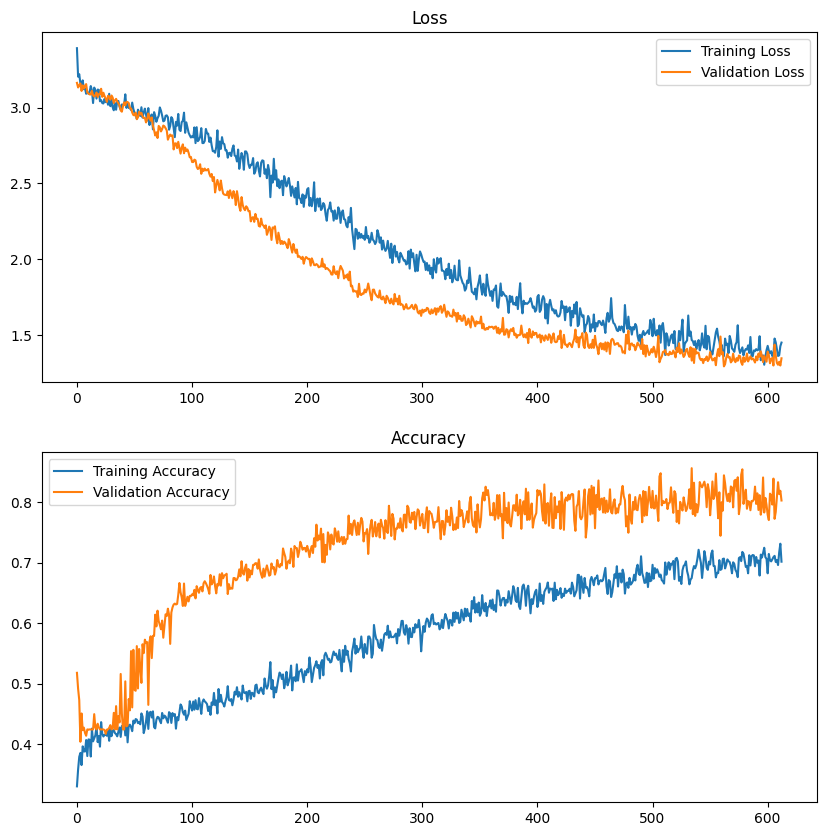

Final Validation Metrics: {'Overall Confusion Matrix': [[273, 11, 4], [97, 265, 29], [3, 0, 29]], 'Per-Class Sensitivity (Recall)': [0.9479166865348816, 0.6777493357658386, 0.90625], 'Per-Class Specificity': [0.7635933756828308, 0.965624988079071, 0.9513990879058838], 'Accuracy': 0.8439720273017883, 'Loss': 1.2940380136171976}

------------------------------------------------------------------------------------------------------------------
Final Train Metrics: {'Overall Confusion Matrix': [[969, 60, 9], [401, 916, 89], [0, 0, 114]], 'Per-Class Sensitivity (Recall)': [0.9335260391235352, 0.6514936089515686, 1.0], 'Per-Class Specificity': [0.7361842393875122, 0.9479166865348816, 0.9599018096923828], 'Accuracy': 0.8616732358932495, 'Loss': 1.1275895580649375}

------------------------------------------------------------------------------------------------------------------


In [ ]:
model = BasicCNNClassifierWithCAM()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Set up the loss function and optimizer
class_counts = [1038, 1406, 114]
class_weights = [sum(class_counts) / c for c in class_counts]
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=0.005)



# Train the model
num_epochs = 1000
patience = 50
l1_lambda = 0.00

model = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    loss_fn=criterion,
    optimizer=optimizer,
    device=device,
    num_epochs=num_epochs,
    patience=patience,
    l1_lambda=l1_lambda
)

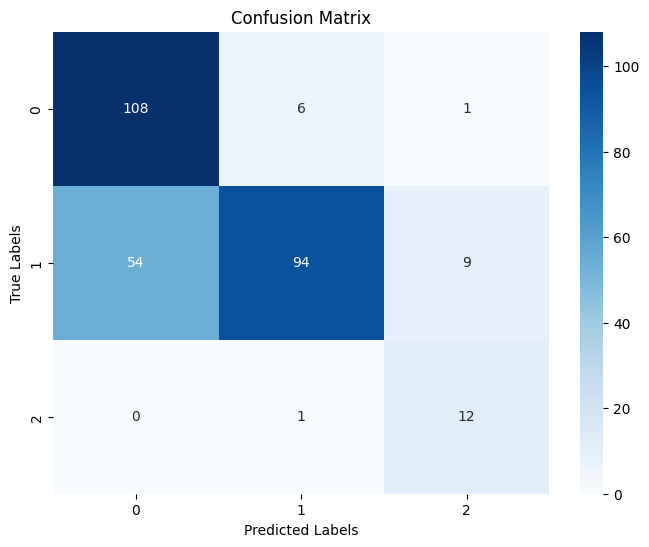

Test Results:
Accuracy: 0.8203
Loss: 1.3108
Class-wise Sensitivity (Recall):
  Class 0: 0.9391
  Class 1: 0.5987
  Class 2: 0.9231
Class-wise Specificity:
  Class 0: 0.6824
  Class 1: 0.9453
  Class 2: 0.9632


In [20]:
metrics = test_model(model, test_loader, criterion, False, device)

# Plot the confusion matrix
conf_matrix = np.array(metrics['Overall Confusion Matrix'])

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=True, yticklabels=True)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

print("Test Results:")
print(f"Accuracy: {metrics['Accuracy']:.4f}")
print(f"Loss: {metrics['Loss']:.4f}")
print("Class-wise Sensitivity (Recall):")
for i, sensitivity in enumerate(metrics["Per-Class Sensitivity (Recall)"]):
    print(f"  Class {i}: {sensitivity:.4f}")
print("Class-wise Specificity:")
for i, specificity in enumerate(metrics["Per-Class Specificity"]):
    print(f"  Class {i}: {specificity:.4f}")

## Q2

In [21]:
data = {}

samples_by_class = get_sample_images_by_class(test_loader, num_samples=2)


for i in range(6):
    data[i+1] = {}
    

In [ ]:
# base class for each of following CAM based classes
class basicCAM():
    def __init__(self, model, target_layer, gap_layer):
        self.model = model
        self.target_layer = target_layer
        self.gap_layer = gap_layer

        self.feature_maps = None
        self.gradient = None
        self.weights = None

        self.register_hooks()

    def register_hooks(self):
        # Register hooks for the target layer and the GAP layer
        def forward_hook(module, input, output):
            self.feature_maps = output

        def backward_hook(module, grad_in, grad_out):
            self.gradient = grad_out[0]


        self.target_layer.register_forward_hook(forward_hook)
        self.gap_layer.register_backward_hook(backward_hook)
    
    def generate_cam(self, image_tensor, target_class, device='cpu'):
        self.model.to(device)
        self.model.eval()
        image_tensor = image_tensor.to(device)


        # Forward pass
        self.model.zero_grad()
        output = self.model(image_tensor)
        
        self.weights = self.model.fc.weight[target_class].detach().cpu().numpy() # detach() to prevent backpropagation

        feature_maps = self.feature_maps.squeeze().cpu().detach().numpy()

        cam = np.zeros(feature_maps.shape[1:], dtype=np.float32)
        for i, weight in enumerate(self.weights):
            cam += weight * feature_maps[i] # Weighted sum of feature maps
        
        # ReLU
        cam = np.maximum(cam, 0)

        # Normalize the CAM to [0, 1]
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-5)

        return cam
        

### a

In [ ]:
# Class for CAM visualization
class CAM(basicCAM):
    def __init__(self, model, target_layer, gap_layer):
        super().__init__(model, target_layer, gap_layer)

    def visualize_cam(self, image_tensor, target_class, alpha=0.5, device='cpu'):
        cam = self.generate_cam(image_tensor, target_class, device)
        visualize_cam_on_image(image_tensor, cam, alpha)
    def compute_cam(self, image_tensor, target_class, alpha=0.5, device='cpu'):
        cam = self.generate_cam(image_tensor, target_class, device)
        return cam

(224, 224)


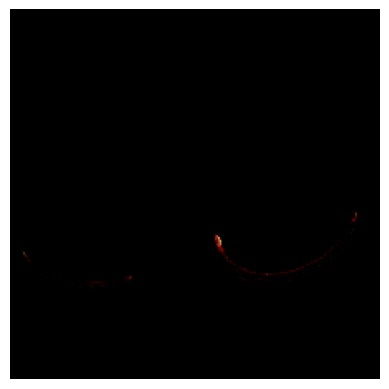

(224, 224)


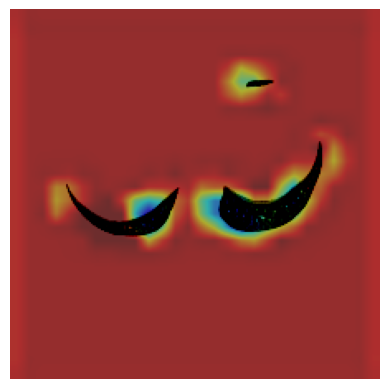

(224, 224)


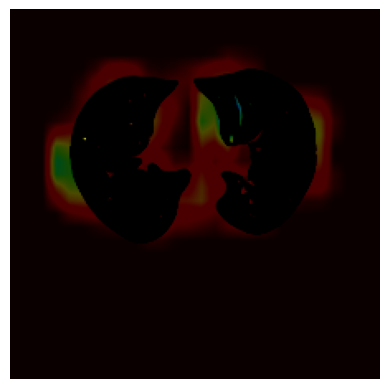

(224, 224)


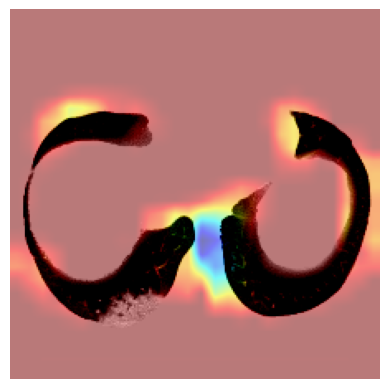

(224, 224)


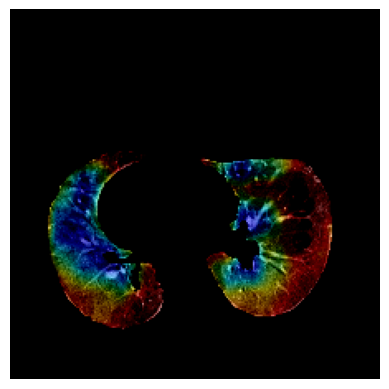

(224, 224)


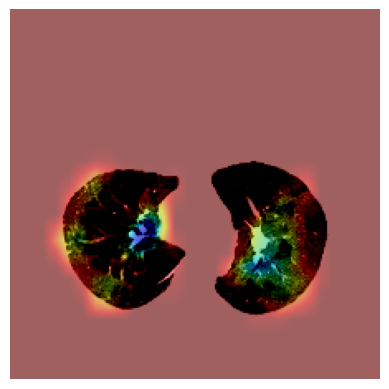

In [ ]:
# Visualize the CAM for each class
for class_label, samples in samples_by_class.items():
    for image_tensor, label in zip(samples["Images"], samples["Labels"]):
        cam = CAM(model, model.relu4, model.gap)
        cam.visualize_cam(image_tensor.unsqueeze(0), target_class=class_label, alpha=0.5, device=device)

In [25]:
remove_all_hooks(model)

### b

In [ ]:
# class for Grad-CAM
class Grad_CAM(basicCAM):
    def __init__(self, model, target_layer, gap_layer):
        super().__init__(model, target_layer, gap_layer) # Call the constructor of the base class

    def generate_grad_cam(self, image_tensor, target_class, device='cpu'):
        self.model.to(device)
        self.model.eval()

        image_tensor = image_tensor.to(device)

        # Forward pass
        self.model.zero_grad()
        output = self.model(image_tensor)
        output[0, target_class].backward()

        gradient = self.gradient[0] # Gradient of the target class with respect to the feature maps
        feature_maps = self.feature_maps[0]
        
        gradient = gradient.squeeze(0)

        self.weights = torch.mean(gradient, dim=(1, 2))
        weights = self.weights
        weights = weights.detach().cpu().numpy()
        feature_maps = feature_maps.detach().cpu().numpy()

        grad_cam = np.zeros(feature_maps.shape[1:], dtype=np.float32)
        for i, weight in enumerate(weights):
            grad_cam += weight * feature_maps[i] # Weighted sum of feature maps

        # ReLU
        grad_cam = np.maximum(grad_cam, 0)

        # Normalize the Grad-CAM to [0, 1]
        grad_cam = (grad_cam - grad_cam.min()) / (grad_cam.max() - grad_cam.min() + 1e-5)

        return grad_cam

    def visualize_grad_cam(self, image_tensor, target_class, alpha=0.5, device='cpu'):
        grad_cam = self.generate_grad_cam(image_tensor, target_class, device)
        visualize_cam_on_image(image_tensor, grad_cam, alpha)

(224, 224)


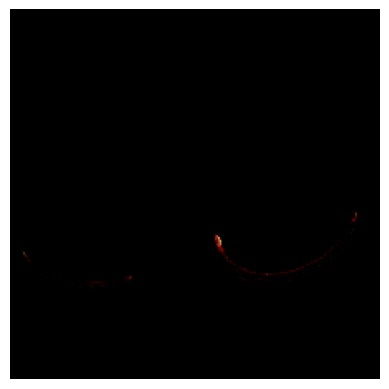

(224, 224)


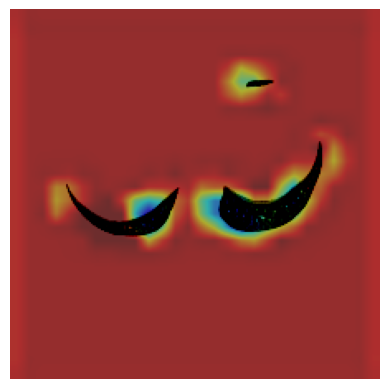

(224, 224)


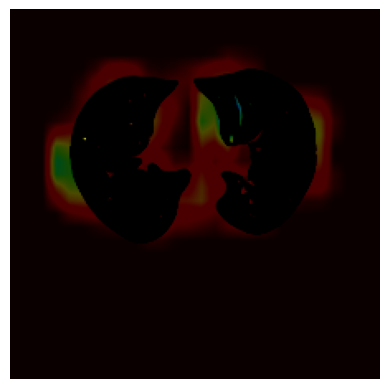

(224, 224)


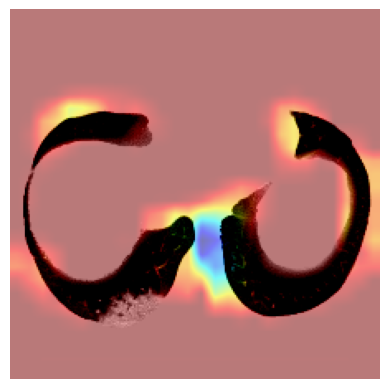

(224, 224)


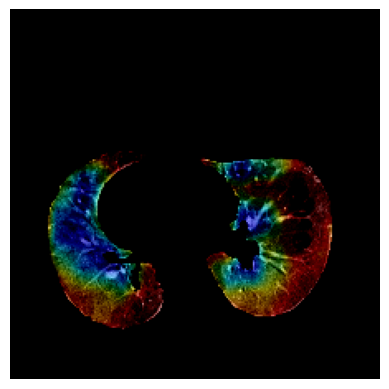

(224, 224)


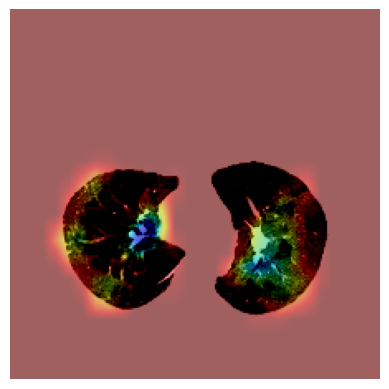

In [ ]:
# Visualize the Grad-CAM for each class
for class_label, samples in samples_by_class.items():
    for image_tensor, label in zip(samples["Images"], samples["Labels"]):
        grad_cam = Grad_CAM(model, model.relu4, model.gap)
        grad_cam.visualize_grad_cam(image_tensor.unsqueeze(0), target_class=class_label, alpha=0.5, device=device)

In [28]:
remove_all_hooks(model)

### C

In [ ]:
# Class for Grad-CAM++
class Grad_CAM_PP(basicCAM):
    def __init__(self, model, target_layer, gap_layer):
        super().__init__(model, target_layer, gap_layer) # Call the constructor of the base class
        
    def generate_grad_cam_pp(self, image_tensor, target_class, device='cpu'):
        self.model.to(device)
        self.model.eval()
        image_tensor = image_tensor.to(device)

        self.model.zero_grad()
        output = self.model(image_tensor)

        if output.dim() == 1:
            output = output.unsqueeze(0)
        
        score = output[0, target_class]
        score.backward()
        
        # Get gradients and feature maps
        gradients = self.gradient[0]  
        feature_maps = self.feature_maps[0]  

        gradients = gradients.cpu().detach()
        feature_maps = feature_maps.cpu().detach()
        
        # Calculate alpha_k^c for each pixel
        alpha_numerator = gradients.pow(2)
        alpha_denominator = 2 * gradients.pow(2)
        alpha_denominator += (feature_maps * gradients.pow(3)).sum(dim=(1, 2), keepdim=True)
        alpha = alpha_numerator / (alpha_denominator + 1e-7)
        
        # Weight calculation
        weights = (alpha * torch.relu(gradients)).sum(dim=(1, 2))
        weights = weights.numpy()
        
        # Generate weighted feature maps
        feature_maps = feature_maps.numpy()
        grad_cam_pp = np.zeros(feature_maps.shape[1:], dtype=np.float32)
        for i, weight in enumerate(weights):
            grad_cam_pp += weight * feature_maps[i] # Weighted sum of feature maps
        
        # Apply ReLU
        grad_cam_pp = np.maximum(grad_cam_pp, 0)
        
        # Normalize
        grad_cam_pp = (grad_cam_pp - grad_cam_pp.min()) / (grad_cam_pp.max() - grad_cam_pp.min() + 1e-5)
        
        return grad_cam_pp
    
    def visualize_grad_cam_pp(self, image_tensor, target_class, alpha=0.5, device='cpu'):
        grad_cam_pp = self.generate_grad_cam_pp(image_tensor, target_class, device)
        visualize_cam_on_image(image_tensor, grad_cam_pp, alpha)

(224, 224)


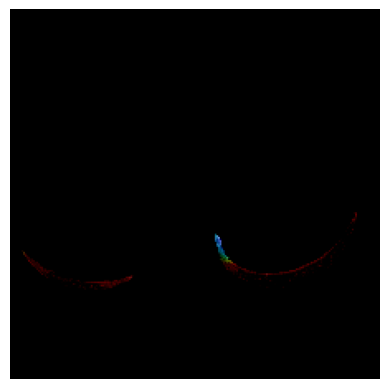

(224, 224)


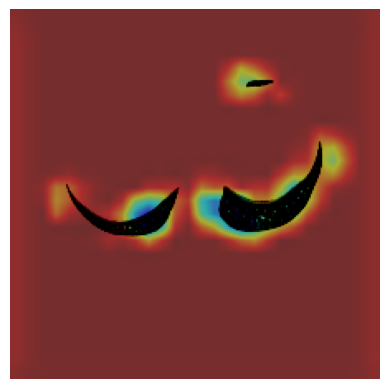

(224, 224)


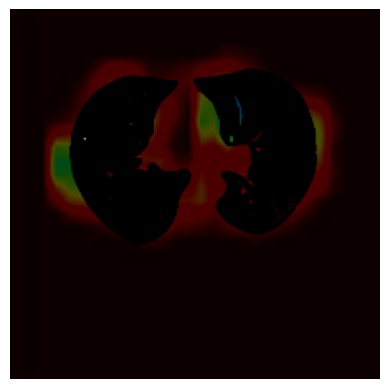

(224, 224)


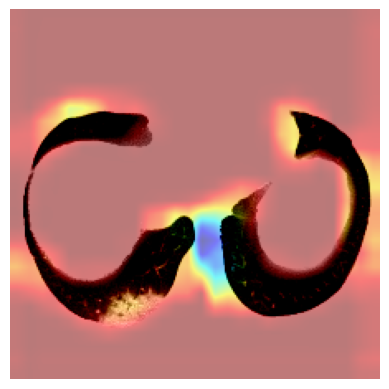

(224, 224)


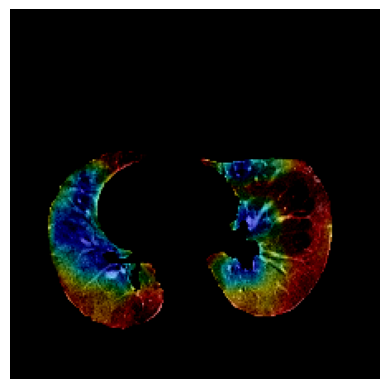

(224, 224)


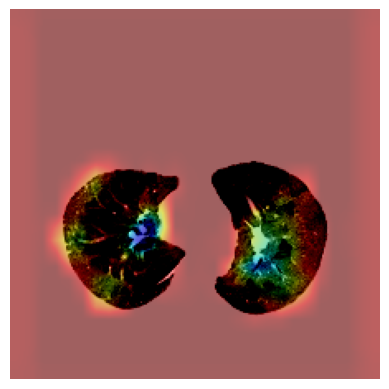

In [ ]:
# Visualize the Grad-CAM++ for each class
for class_label, samples in samples_by_class.items():
    for image_tensor, label in zip(samples["Images"], samples["Labels"]):
        grad_cam_pp = Grad_CAM_PP(model, model.relu4, model.gap)
        grad_cam_pp.visualize_grad_cam_pp(image_tensor.unsqueeze(0), target_class=class_label, alpha=0.5, device=device)

In [31]:
remove_all_hooks(model)

### d

In [ ]:
class Score_CAM(basicCAM):
    def __init__(self, model, target_layer, gap_layer, n_batch=32): 
        super().__init__(model, target_layer, gap_layer) # Call the constructor of the base class
        self.n_batch = n_batch
        
    def generate_score_cam(self, image_tensor, target_class=None, device='cpu'):
        self.model.to(device)
        self.model.eval()
        image_tensor = image_tensor.to(device)
        
        # Get original image dimensions
        _, _, H, W = image_tensor.shape
        
        with torch.no_grad():
            self.model.zero_grad()
            output = self.model(image_tensor)
            prob = F.softmax(output, dim=1)
            
            # If target class not specified, use predicted class
            if target_class is None:
                prob_max, target_class = torch.max(prob, dim=1)
                target_class = target_class.item()
            
            feature_maps = self.feature_maps.cpu().clone()
            
            # ReLU and interpolate feature maps
            feature_maps = F.relu(feature_maps)
            feature_maps = F.interpolate(
                feature_maps, 
                size=(H, W), 
                mode='bilinear',
                align_corners=False
            )
            
            _, C, _, _ = feature_maps.shape
            
            # Normalize feature maps
            feat_mins, _ = feature_maps.view(1, C, -1).min(dim=2)
            feat_mins = feat_mins.view(1, C, 1, 1)
            feat_maxs, _ = feature_maps.view(1, C, -1).max(dim=2)
            feat_maxs = feat_maxs.view(1, C, 1, 1)
            
            # Avoid division by zero
            denominators = torch.where(
                (feat_maxs - feat_mins) != 0.,
                feat_maxs - feat_mins,
                torch.tensor(1.)
            )
            
            normalized_features = feature_maps / denominators
            
            # Calculate weights using masked images
            weights = []
            for i in range(0, C, self.n_batch):
                batch_masks = normalized_features[:, i:i+self.n_batch].transpose(0, 1)
                batch_masks = batch_masks.to(device)
                
                masked_images = image_tensor * batch_masks

                batch_scores = self.model(masked_images)
                batch_probs = F.softmax(batch_scores, dim=1)[:, target_class]
                
                weights.append(batch_probs.cpu().data)
            
            weights = torch.cat(weights)
            weights = weights.view(1, C, 1, 1)
            
            # Generate final CAM
            score_cam = (weights * normalized_features).sum(1, keepdim=True)
            score_cam = F.relu(score_cam)
            
            # Normalize to [0, 1]
            score_cam -= score_cam.min()
            score_cam /= (score_cam.max() + 1e-7)
            
            return score_cam.squeeze().numpy()
    
    def visualize_score_cam(self, image_tensor, target_class=None, alpha=0.5, device='cpu'):
        score_cam = self.generate_score_cam(image_tensor, target_class, device)
        visualize_cam_on_image(image_tensor, score_cam, alpha)

(224, 224)


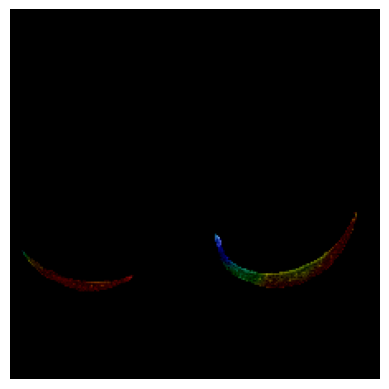

(224, 224)


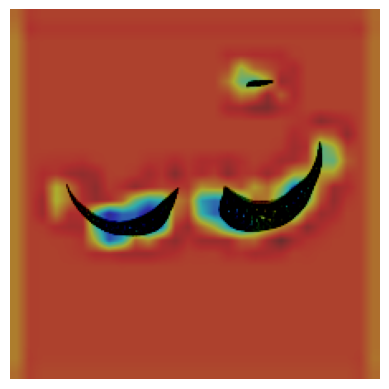

(224, 224)


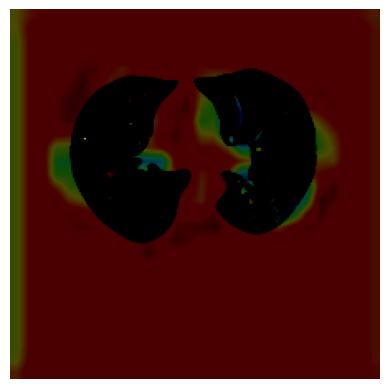

(224, 224)


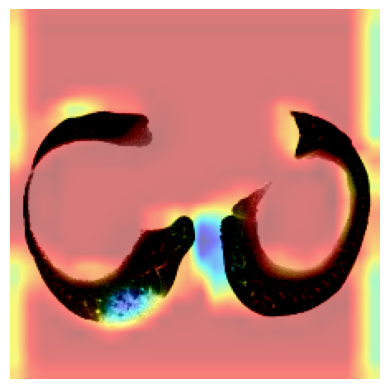

(224, 224)


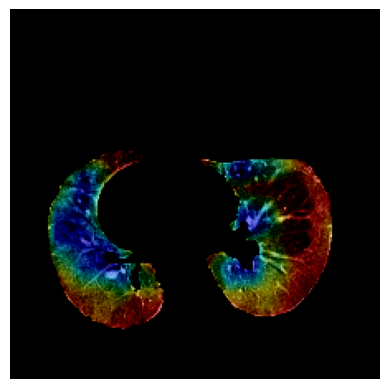

(224, 224)


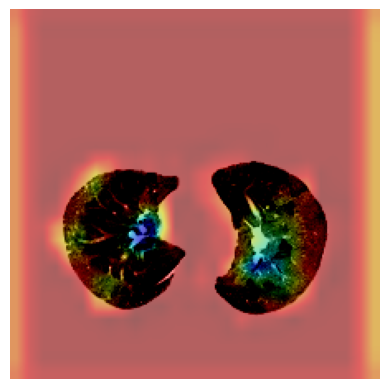

In [ ]:
# Visualize the Score-CAM for each class
for class_label, samples in samples_by_class.items():
    for image_tensor, label in zip(samples["Images"], samples["Labels"]):
        score_cam = Score_CAM(model, model.relu4, model.gap, n_batch=32)
        score_cam.visualize_score_cam(image_tensor.unsqueeze(0), target_class=class_label, alpha=0.5, device=device)

In [37]:
remove_all_hooks(model)

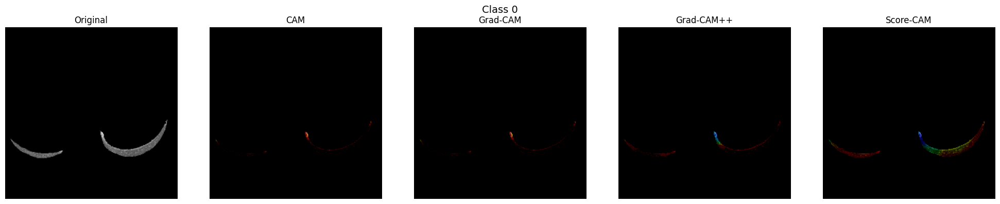

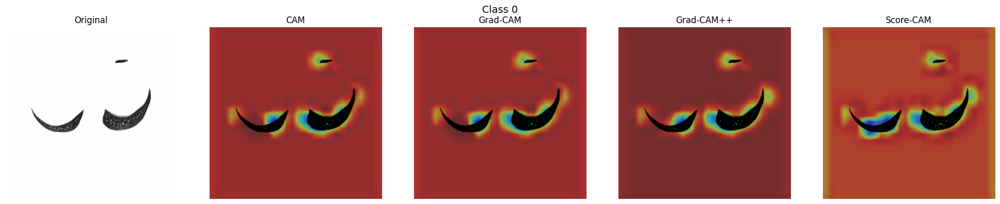

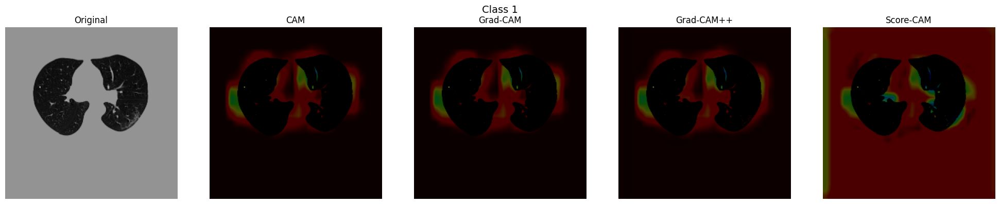

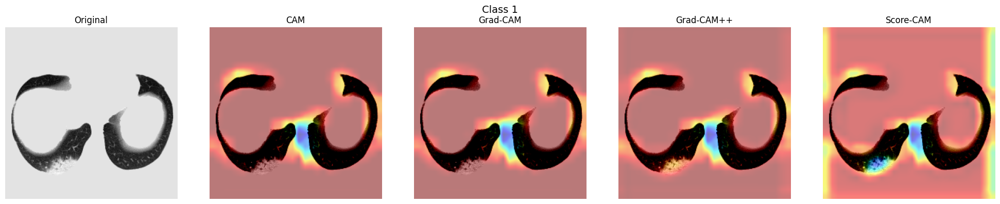

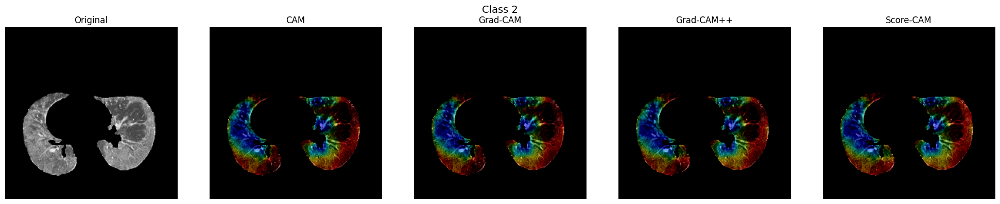

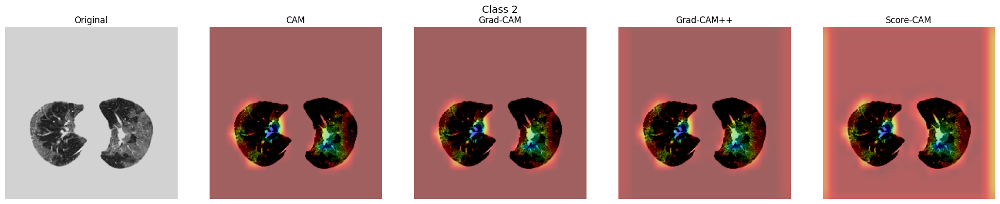

In [ ]:
from collections import defaultdict

def store_and_visualize_cams(samples_by_class, model, device):
    # Dictionary to store results 
    results = defaultdict(lambda: defaultdict(dict))
    
    # Process each image with different CAM methods
    for class_label, samples in samples_by_class.items():
        for idx, (image_tensor, label) in enumerate(zip(samples["Images"], samples["Labels"])):
            image_key = f"class_{class_label}_img_{idx}"
            
            results[image_key]['image'] = image_tensor
            results[image_key]['class'] = class_label
            
            # Get CAM
            cam_method = CAM(model, model.relu4, model.gap)
            cam_result = cam_method.compute_cam(image_tensor.unsqueeze(0), 
                                              target_class=class_label, 
                                              device=device)
            results[image_key]['CAM'] = cam_result
            
            remove_all_hooks(model)
            
            # Get Grad-CAM
            grad_cam = Grad_CAM(model, model.relu4, model.gap)
            grad_cam_result = grad_cam.generate_grad_cam(image_tensor.unsqueeze(0), 
                                                      target_class=class_label, 
                                                      device=device)
            results[image_key]['Grad-CAM'] = grad_cam_result
            
            remove_all_hooks(model)
            
            # Get Grad-CAM++
            grad_cam_pp = Grad_CAM_PP(model, model.relu4, model.gap)
            grad_cam_pp_result = grad_cam_pp.generate_grad_cam_pp(image_tensor.unsqueeze(0), 
                                                               target_class=class_label, 
                                                               device=device)
            results[image_key]['Grad-CAM++'] = grad_cam_pp_result
            
            remove_all_hooks(model)
            
            # Get Score-CAM
            score_cam = Score_CAM(model, model.relu4, model.gap, n_batch=32)
            score_cam_result = score_cam.generate_score_cam(image_tensor.unsqueeze(0), 
                                                         target_class=class_label, 
                                                         device=device)
            results[image_key]['Score-CAM'] = score_cam_result
            
            remove_all_hooks(model)
    
    return results

def process_cam_for_visualization(cam, image_shape):
    if isinstance(cam, torch.Tensor) and cam.requires_grad:
        cam = cam.detach()
        cam = cam.squeeze().cpu().numpy()
    
    # Resize CAM to match the input image size
    cam_resized = cv2.resize(cam, (image_shape[1], image_shape[0]))
    cam_resized -= cam_resized.min()
    cam_resized /= cam_resized.max() if cam_resized.max() != 0 else 1
    return cam_resized

def plot_all_methods(results, alpha=0.5):
    cam_methods = ['CAM', 'Grad-CAM', 'Grad-CAM++', 'Score-CAM']
    
    for image_key in results:
        fig, axes = plt.subplots(1, 5, figsize=(20, 4))
        fig.suptitle(f'Class {results[image_key]["class"]}', fontsize=14)
        
        image = results[image_key]['image'].squeeze().cpu().numpy()
        axes[0].imshow(image, cmap='gray')
        axes[0].set_title('Original')
        axes[0].axis('off')
        
        # Plot each CAM method
        for idx, method in enumerate(cam_methods, 1):
            cam = results[image_key][method]
            cam_resized = process_cam_for_visualization(cam, image.shape)
            
            heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
            heatmap = np.float32(heatmap) / 255
            overlayed_img = heatmap * alpha + np.expand_dims(image, axis=2) * (1 - alpha)
            
            axes[idx].imshow(overlayed_img)
            axes[idx].set_title(method)
            axes[idx].axis('off')
        
        plt.tight_layout()
        plt.show()

results = store_and_visualize_cams(samples_by_class, model, device)
plot_all_methods(results)

## Q3

### Guided Back Propagation

In [ ]:
def remove_all_hooks(model):
    for module in model.modules():
        # Remove all hooks from the model
        if hasattr(module, '_forward_hooks'):
            module._forward_hooks.clear()
        if hasattr(module, '_backward_hooks'):
            module._backward_hooks.clear()
        if hasattr(module, '_forward_pre_hooks'):
            module._forward_pre_hooks.clear()

In [40]:
remove_all_hooks(model)

In [43]:
for name, module in model.named_modules():
    if isinstance(module, nn.ReLU):
        print(name, module)
    

relu1 ReLU()
relu2 ReLU()
relu3 ReLU()
relu4 ReLU()


In [ ]:
class Guided_Backprop():
    def __init__(self, model) -> None:
        self.model = model
        self.activation = []
        self.gradients = []
        self.register_hooks()
        self.image_reconstruction = None
    
    def register_hooks(self):
        def forward_hook_fn(module, input, output):
            self.activation.append(output)
            
        def backward_hook_fn(module, grad_in, grad_out):
            # make gradients to be zero where activation or gradient is less than 0
            activation = self.activation.pop()
            positive_mask = activation > 0

            positive_grad_out = torch.clamp(grad_out[0], min=0.0)
            
            # Apply both masks (element-wise multiplication)
            new_grad_out = positive_grad_out * positive_mask
            
            return (new_grad_out,)
            
        def first_layer_backward_hook_fn(module, grad_in, grad_out):
            self.image_reconstruction = grad_in[0].detach().cpu().numpy()
            
        # Register hooks for all ReLU layers
        for name, module in self.model.named_modules():
            if isinstance(module, nn.ReLU):
                module.register_forward_hook(forward_hook_fn)
                module.register_backward_hook(backward_hook_fn)
        
        first_layer = list(self.model.children())[0]
        first_layer.register_backward_hook(first_layer_backward_hook_fn)
    
    def visualize_reconstruction(self, original_image_tensor):
        # Normalize the image
        def normalize_image(image):
            image = image - image.min()
            image /= image.max() + 1e-7
            return image
        
        image = self.image_reconstruction.squeeze()
        original_image = original_image_tensor.squeeze()
        image = normalize_image(image)
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))

        axes[0].imshow(original_image, cmap='gray')
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        axes[1].imshow(image, cmap='gray')
        axes[1].set_title('Guided Backpropagation')
        axes[1].axis('off')

        plt.show()
    
    def generate_gradients(self, input_tensor, target_class, device='cpu'):
        self.model.to(device)
        self.model.eval()
        input_tensor = input_tensor.to(device)
        input_tensor.requires_grad = True
        
        # Forward pass
        self.model.zero_grad()
        output = self.model(input_tensor)
        
        # Backward pass
        if len(output.shape) == 1:
            score = output[target_class]
        else:
            score = output[0, target_class]
            
        score.backward()
        
        return input_tensor.grad.squeeze().cpu().numpy()

# Visualize the Guided Backpropagation for each class
def visualize_guided_backprop(model, image, target_class, device='cpu'):
    guided_bp = Guided_Backprop(model)
    image_tensor = image.unsqueeze(0)
    gradients = guided_bp.generate_gradients(image_tensor, target_class, device)
    guided_bp.visualize_reconstruction(image_tensor)
    return gradients

/opt/conda/lib/python3.10/site-packages/torch/nn/modules/module.py:1640: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


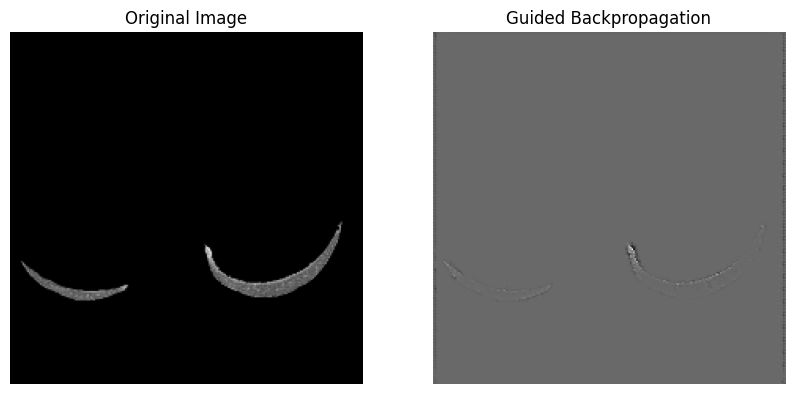

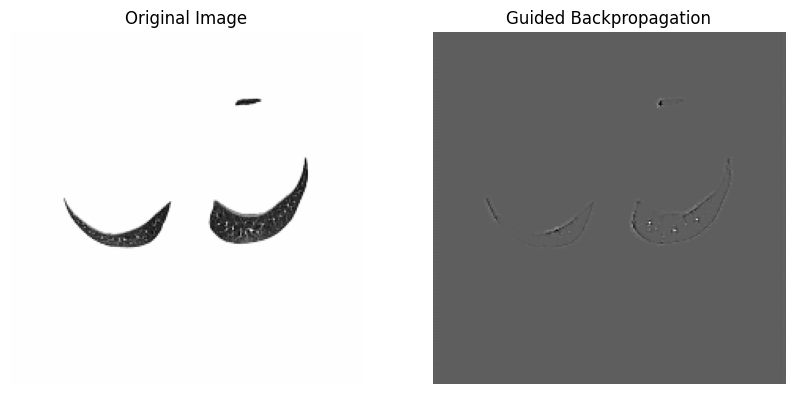

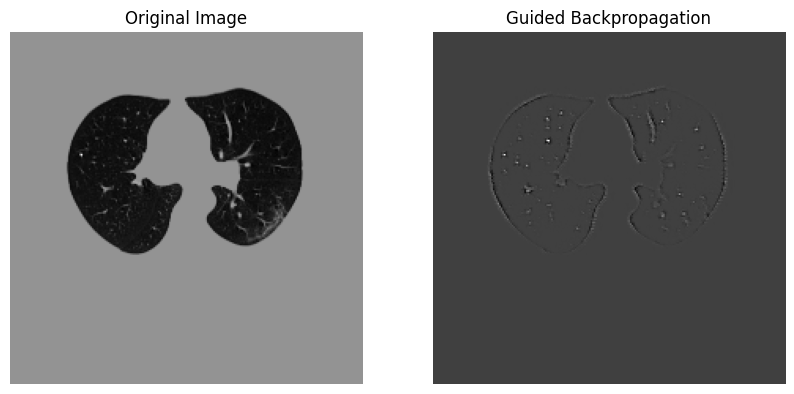

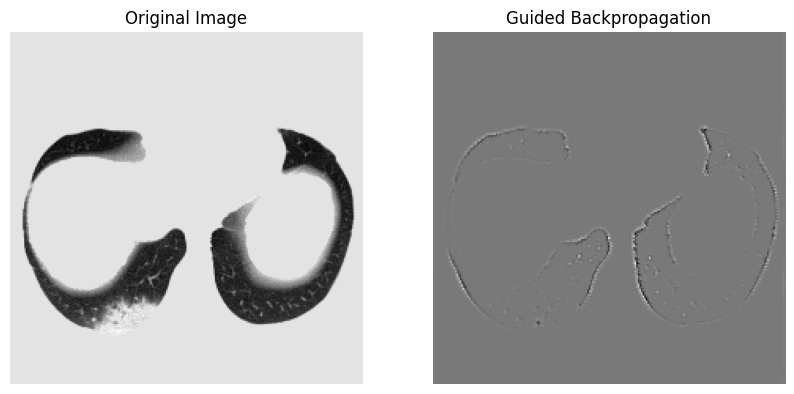

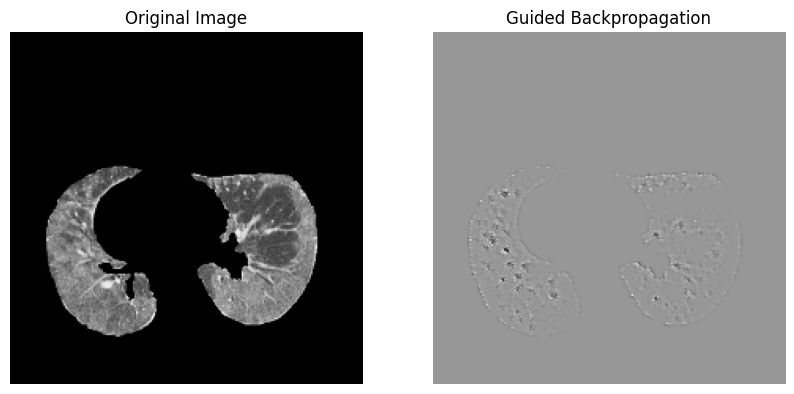

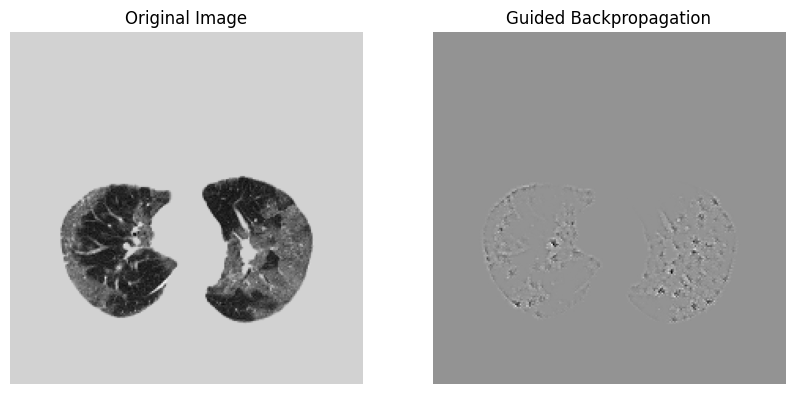

In [46]:
for label_x, data in samples_by_class.items():
    images = data["Images"]
    labels = data["Labels"]
    for i, (image, label) in enumerate(zip(images, labels)):
        gradients = visualize_guided_backprop(model, image, label_x, device)